
<center>
<hr/>
<h1>
<b>
Project Based Learning
</b>
</h1>
<h3>
<b>
Title: Analysis , Visualization and Prediction Based on Chicago Covid-19  &  Crime Datasets
<br/>
</b>
</h3>
</center>
<hr>

<hr>

<center>
<h3>
<b>
     Analysis Based On Chicago Crime Datasets 
</b>
</h3>
<hr>
</center>

In [ ]:

import numpy as np
import pandas as pd 
import folium
import matplotlib.pyplot as plt
import seaborn as sns
#!pip install folium


In [ ]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [ ]:

from google.colab import drive
drive.mount('/content/gdrive',  force_remount=True)


Mounted at /content/gdrive


In [ ]:
df = pd.read_csv('/content/gdrive/MyDrive/Prashant/lab/PBL/Datasets/Crime data/chicago crime dataset without zipcode.csv')
df.head()

,CASE#,Date,Block,Primary_Description,Secondary_Description,Location_Desc,Arrest,Domestic,Beat,Ward,X COORDINATE,Y COORDINATE,LATITUDE,LONGITUDE,LOCATION
0,JD164115,02/25/2020 10:20:00,013XX S CANAL ST,BATTERY,SIMPLE,GROCERY FOOD STORE,Y,N,124,11.0,1173336.0,1893976.0,41.864494,-87.639158,"(41.864493678, -87.639158)"
1,JD163938,02/25/2020 05:30:00,033XX W CULLOM AVE,THEFT,$500 AND UNDER,STREET,N,N,1724,33.0,1153387.0,1928387.0,41.959340,-87.711475,"(41.959339811, -87.711474784)"
2,JC164345,02/25/2020 01:04:00,023XX S PULASKI RD,CRIMINAL TRESPASS,TO LAND,RESTAURANT,Y,N,1013,22.0,1150083.0,1887962.0,41.848475,-87.724676,"(41.848474762, -87.724676285)"
3,JD164701,02/25/2020 06:05:00,058XX N RIDGE AVE,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,Y,Y,2013,48.0,1165471.0,1938819.0,41.987716,-87.666750,"(41.987716355, -87.666750459)"
4,JD164416,02/25/2020 01:42:00,011XX N HARDING AVE,NARCOTICS,POSS: CRACK,STREET,Y,N,1112,37.0,1149847.0,1907230.0,41.901353,-87.725041,"(41.901352928, -87.725041269)"


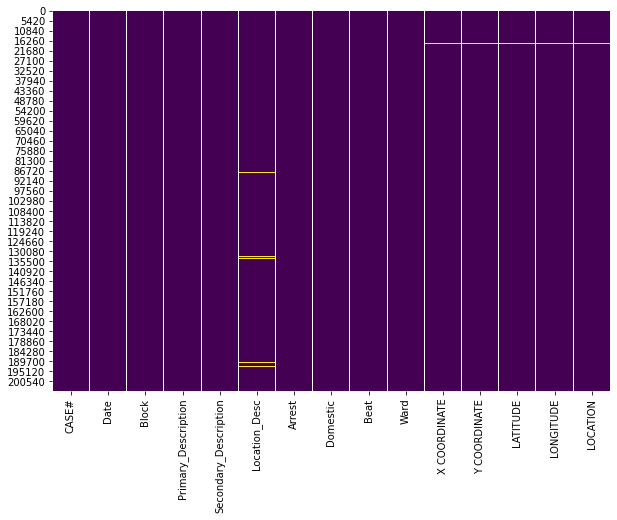

In [ ]:
plt.figure(figsize=(10,7))
sns.heatmap(df.isnull(), cbar = False, cmap = 'viridis')

In [ ]:
%matplotlib inline
plt.style.use('seaborn')
crimes1 = df.dropna()
crimes = pd.concat([crimes1], ignore_index=False, axis=0)
crimes_predict = crimes

print('Dataset ready..')

print('Dataset Shape before drop_duplicate : ', crimes.shape)
crimes.drop_duplicates(subset=['CASE#','Date','Block','Primary_Description','Secondary_Description','Location_Desc','Arrest','X COORDINATE', 'Y COORDINATE','LATITUDE', 'LONGITUDE', 'LOCATION'], inplace=True)
print('Dataset Shape after drop_duplicate: ', crimes.shape)

Dataset ready..
Dataset Shape before drop_duplicate :  (203673, 15)
Dataset Shape after drop_duplicate:  (203665, 15)


In [ ]:
crimes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 203665 entries, 0 to 205922
Data columns (total 15 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   CASE#                  203665 non-null  object 
 1   Date                   203665 non-null  object 
 2   Block                  203665 non-null  object 
 3   Primary_Description    203665 non-null  object 
 4   Secondary_Description  203665 non-null  object 
 5   Location_Desc          203665 non-null  object 
 6   Arrest                 203665 non-null  object 
 7   Domestic               203665 non-null  object 
 8   Beat                   203665 non-null  int64  
 9   Ward                   203665 non-null  float64
 10  X COORDINATE           203665 non-null  float64
 11  Y COORDINATE           203665 non-null  float64
 12  LATITUDE               203665 non-null  float64
 13  LONGITUDE              203665 non-null  float64
 14  LOCATION               203665 non-nu

In [ ]:
crimes.head(3)

,CASE#,Date,Block,Primary_Description,Secondary_Description,Location_Desc,Arrest,Domestic,Beat,Ward,X COORDINATE,Y COORDINATE,LATITUDE,LONGITUDE,LOCATION
0,JD164115,02/25/2020 10:20:00,013XX S CANAL ST,BATTERY,SIMPLE,GROCERY FOOD STORE,Y,N,124,11.0,1173336.0,1893976.0,41.864494,-87.639158,"(41.864493678, -87.639158)"
1,JD163938,02/25/2020 05:30:00,033XX W CULLOM AVE,THEFT,$500 AND UNDER,STREET,N,N,1724,33.0,1153387.0,1928387.0,41.959340,-87.711475,"(41.959339811, -87.711474784)"
2,JC164345,02/25/2020 01:04:00,023XX S PULASKI RD,CRIMINAL TRESPASS,TO LAND,RESTAURANT,Y,N,1013,22.0,1150083.0,1887962.0,41.848475,-87.724676,"(41.848474762, -87.724676285)"


In [ ]:
pd.value_counts(crimes['Location_Desc'])[:10]

STREET                                    49951
RESIDENCE                                 37424
APARTMENT                                 35267
SIDEWALK                                  12914
SMALL RETAIL STORE                         5083
OTHER (SPECIFY)                            4892
PARKING LOT / GARAGE (NON RESIDENTIAL)     4802
ALLEY                                      4689
RESIDENCE - YARD (FRONT / BACK)            3397
GAS STATION                                3391
Name: Location_Desc, dtype: int64

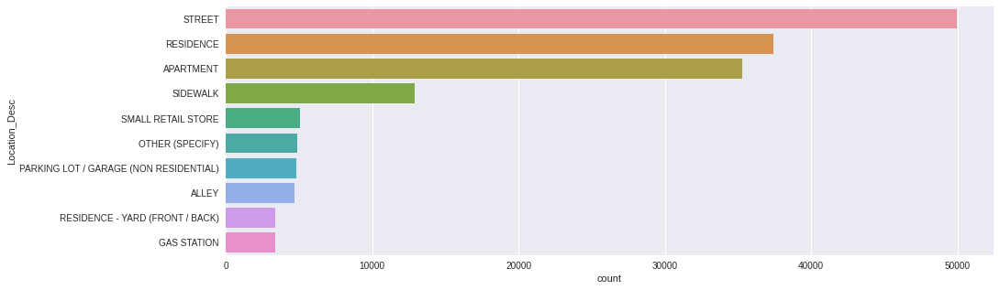

In [ ]:
plt.figure(figsize = (15, 5))
sns.countplot(y= 'Location_Desc', data = crimes, order = crimes['Location_Desc'].value_counts().iloc[:10].index)

In [ ]:
pd.value_counts(crimes['Primary_Description'])[:10]

BATTERY                40699
THEFT                  38655
CRIMINAL DAMAGE        24612
ASSAULT                18014
DECEPTIVE PRACTICE     15862
OTHER OFFENSE          12030
MOTOR VEHICLE THEFT     9983
WEAPONS VIOLATION       8577
BURGLARY                8524
ROBBERY                 7884
Name: Primary_Description, dtype: int64

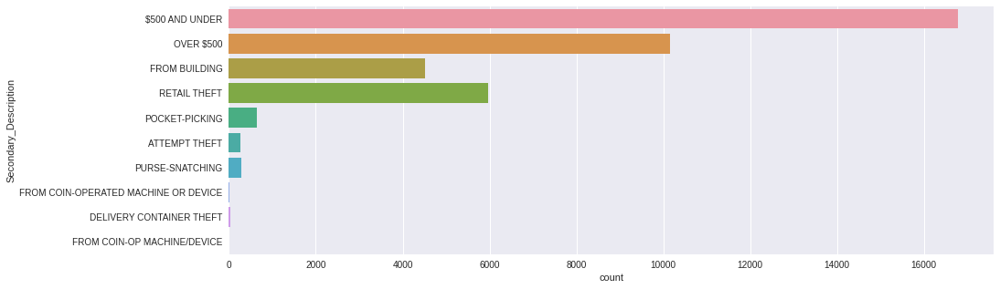

In [ ]:
df_theft = crimes1[crimes1['Primary_Description'] == 'THEFT']
plt.figure(figsize = (15, 5))
sns.countplot(y = df_theft['Secondary_Description'])

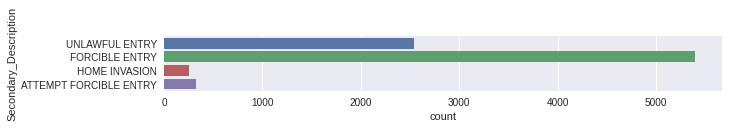

In [ ]:
df_theft = crimes1[crimes1['Primary_Description'] == 'BURGLARY']
plt.figure(figsize = (10, 1))
sns.countplot(y = df_theft['Secondary_Description'])

In [ ]:
locations_case =  crimes.groupby('Primary_Description').first()

In [ ]:
new_locations = locations_case.loc[:, ['LATITUDE', 'LONGITUDE', 'Location_Desc', 'Arrest']]

In [ ]:
new_locations.head()

,LATITUDE,LONGITUDE,Location_Desc,Arrest
Primary_Description,,,,
ARSON,41.809524,-87.701577,STREET,N
ASSAULT,41.772652,-87.698104,RESIDENCE,N
BATTERY,41.864494,-87.639158,GROCERY FOOD STORE,Y
BURGLARY,41.894270,-87.722376,APARTMENT,N
CONCEALED CARRY LICENSE VIOLATION,41.852310,-87.667020,STREET,Y


In [ ]:
# Initial Date Format
crimes.Date 

0         02/25/2020 10:20:00 
1         02/25/2020 05:30:00 
2         02/25/2020 01:04:00 
3         02/25/2020 06:05:00 
4         02/25/2020 01:42:00 
                  ...         
205917          1/04/2021 7:23
205919         10/02/2020 5:39
205920         9/09/2020 10:41
205921    10/17/2020 03:15:00 
205922    12/25/2020 09:50:00 
Name: Date, Length: 203665, dtype: object

In [ ]:
# Setting the index to be the date for further analysis based on time
crimes.Date = pd.to_datetime(crimes.Date, format='%m/%d/%Y %H:%M', exact=False)
crimes.index = pd.DatetimeIndex(crimes.Date)
crimes.Date

Date
2020-02-25 10:20:00   2020-02-25 10:20:00
2020-02-25 05:30:00   2020-02-25 05:30:00
2020-02-25 01:04:00   2020-02-25 01:04:00
2020-02-25 06:05:00   2020-02-25 06:05:00
2020-02-25 01:42:00   2020-02-25 01:42:00
                              ...        
2021-01-04 07:23:00   2021-01-04 07:23:00
2020-10-02 05:39:00   2020-10-02 05:39:00
2020-09-09 10:41:00   2020-09-09 10:41:00
2020-10-17 03:15:00   2020-10-17 03:15:00
2020-12-25 09:50:00   2020-12-25 09:50:00
Name: Date, Length: 203665, dtype: datetime64[ns]

In [ ]:
crimes['Primary_Description']  = pd.Categorical(crimes['Primary_Description'])
crimes['Location_Desc'] = pd.Categorical(crimes['Location_Desc'])
crimes['Secondary_Description'] = pd.Categorical(crimes['Secondary_Description'])

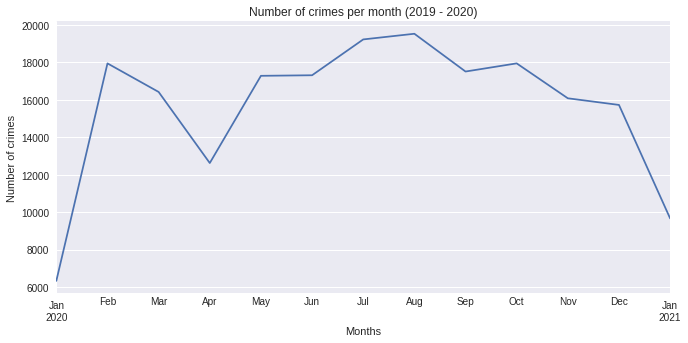

In [ ]:
plt.figure(figsize=(11,5))
crimes.resample('M').size().plot(legend=False)
plt.title('Number of crimes per month (2019 - 2020)')
plt.xlabel('Months')
plt.ylabel('Number of crimes')
plt.show()

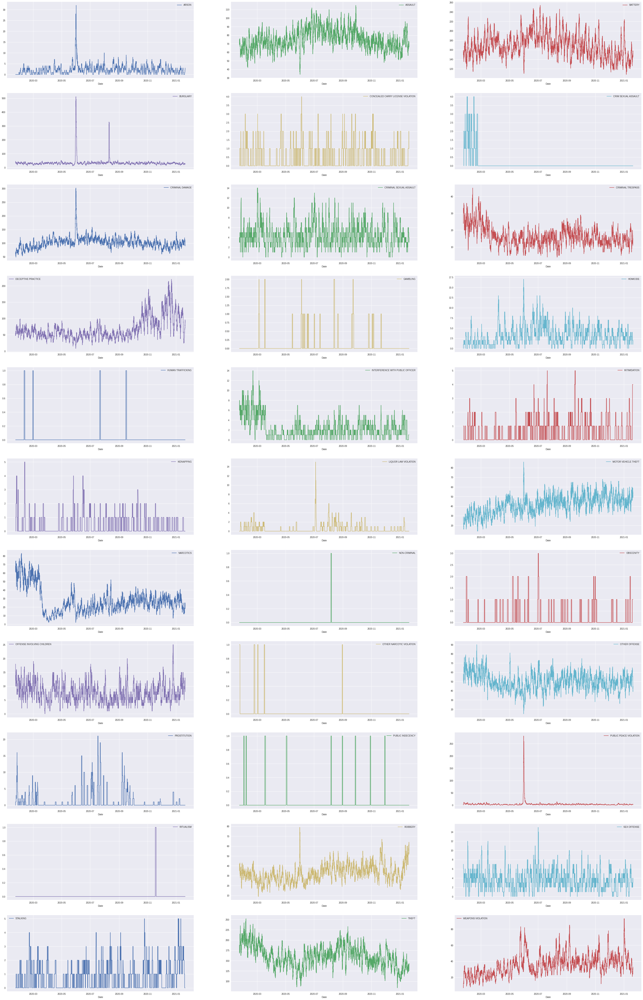

In [ ]:
crimes_count_date = crimes.pivot_table('CASE#', aggfunc=np.size, columns='Primary_Description', index=crimes.index, fill_value=0)
crimes_count_date.index = pd.DatetimeIndex(crimes_count_date.index)
plo = crimes_count_date.rolling(365).sum().plot(figsize=(50, 80), subplots=True, layout=(-1, 3), sharex=False, sharey=False)

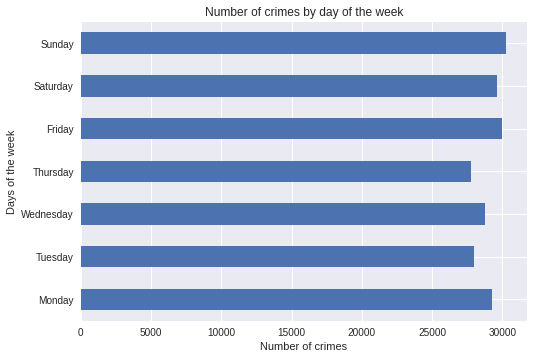

In [ ]:
days = ['Monday','Tuesday','Wednesday',  'Thursday', 'Friday', 'Saturday', 'Sunday']
crimes.groupby([crimes.index.dayofweek]).size().plot(kind='barh')
plt.ylabel('Days of the week')
plt.yticks(np.arange(7), days)
plt.xlabel('Number of crimes')
plt.title('Number of crimes by day of the week')
plt.show()

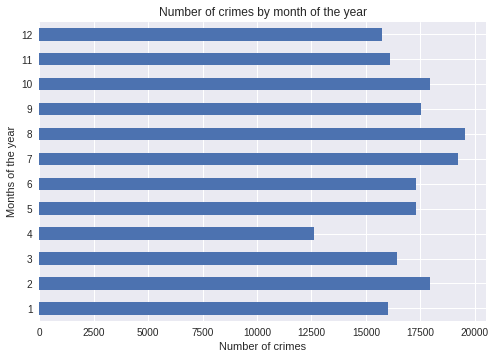

In [ ]:
crimes.groupby([crimes.index.month]).size().plot(kind='barh')
plt.ylabel('Months of the year')
plt.xlabel('Number of crimes')
plt.title('Number of crimes by month of the year')
plt.show()

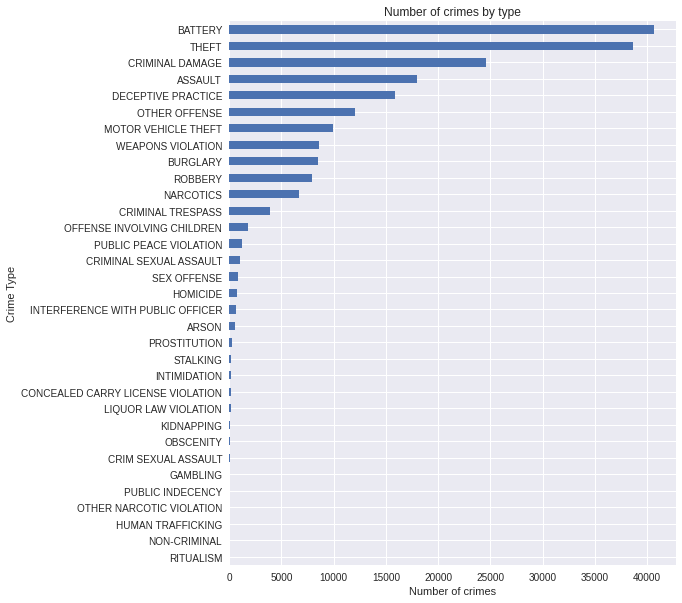

In [ ]:
plt.figure(figsize=(8,10))
crimes.groupby([crimes['Primary_Description']]).size().sort_values(ascending=True).plot(kind='barh')
plt.title('Number of crimes by type')
plt.ylabel('Crime Type')
plt.xlabel('Number of crimes')
plt.show()

<hr>
<center>
<h4>
<b>
Building Heatmaps to show correlation between Parameters
</b>
</h4>
<hr>
</center>

In [ ]:
hour_by_location = crimes.pivot_table(values='CASE#', index='Location_Desc', columns=crimes.index.hour, aggfunc=np.size).fillna(0)
hour_by_type     = crimes.pivot_table(values='CASE#', index='Primary_Description', columns=crimes.index.hour, aggfunc=np.size).fillna(0)
hour_by_week     = crimes.pivot_table(values='CASE#', index=crimes.index.hour, columns=crimes.index, aggfunc=np.size).fillna(0)
dayofweek_by_location = crimes.pivot_table(values='CASE#', index='Location_Desc', columns=crimes.index.dayofweek, aggfunc=np.size).fillna(0)
dayofweek_by_type = crimes.pivot_table(values='CASE#', index='Primary_Description', columns=crimes.index.dayofweek, aggfunc=np.size).fillna(0)
location_by_type  = crimes.pivot_table(values='CASE#', index='Location_Desc', columns='Primary_Description', aggfunc=np.size).fillna(0)

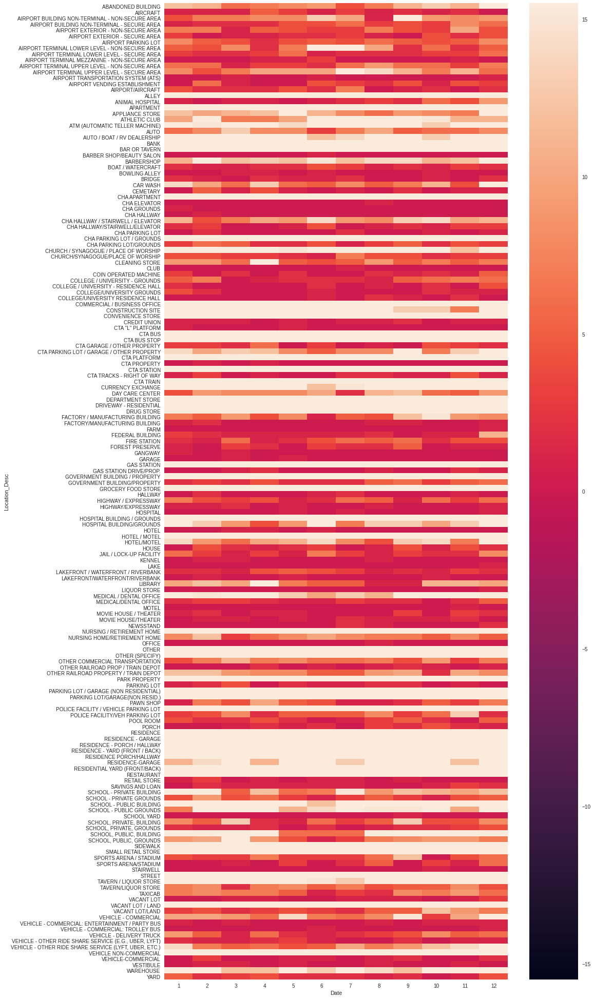

In [ ]:
fig, ax = plt.subplots(figsize=(15, 35))
sns.heatmap(hour_by_location,vmin=-15.5,vmax=15.5)
plt.show()

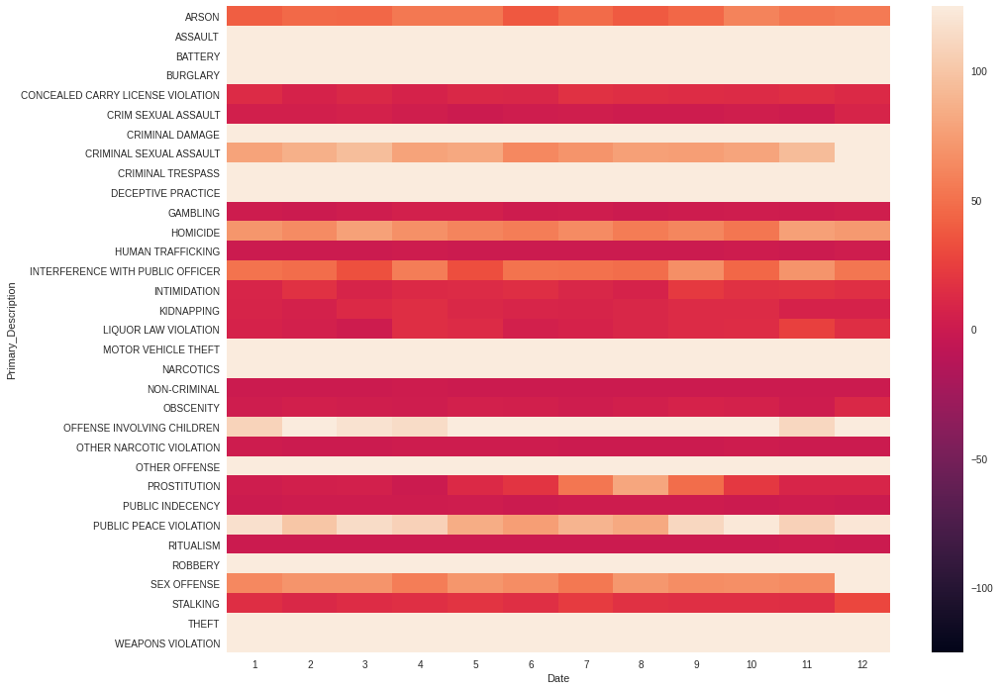

In [ ]:
fig, ax = plt.subplots(figsize=(15, 12))
sns.heatmap(hour_by_type,vmin=-125,vmax=125)
plt.show()

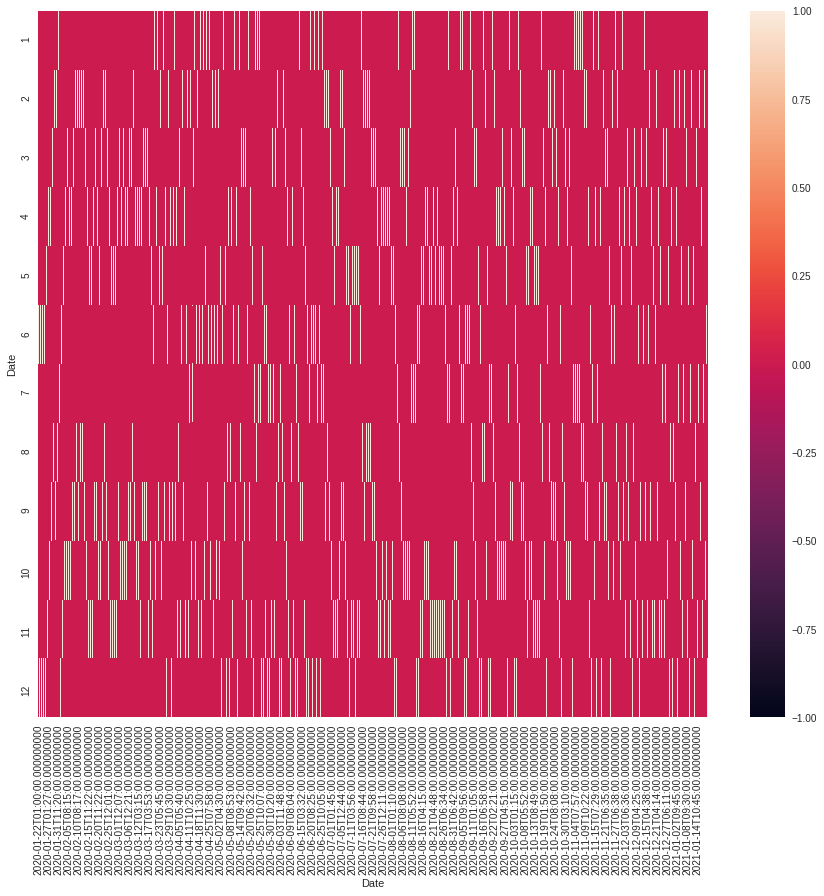

In [ ]:
fig, ax = plt.subplots(figsize=(15, 13))
sns.heatmap(hour_by_week,vmin=-1,vmax=1)
plt.show()

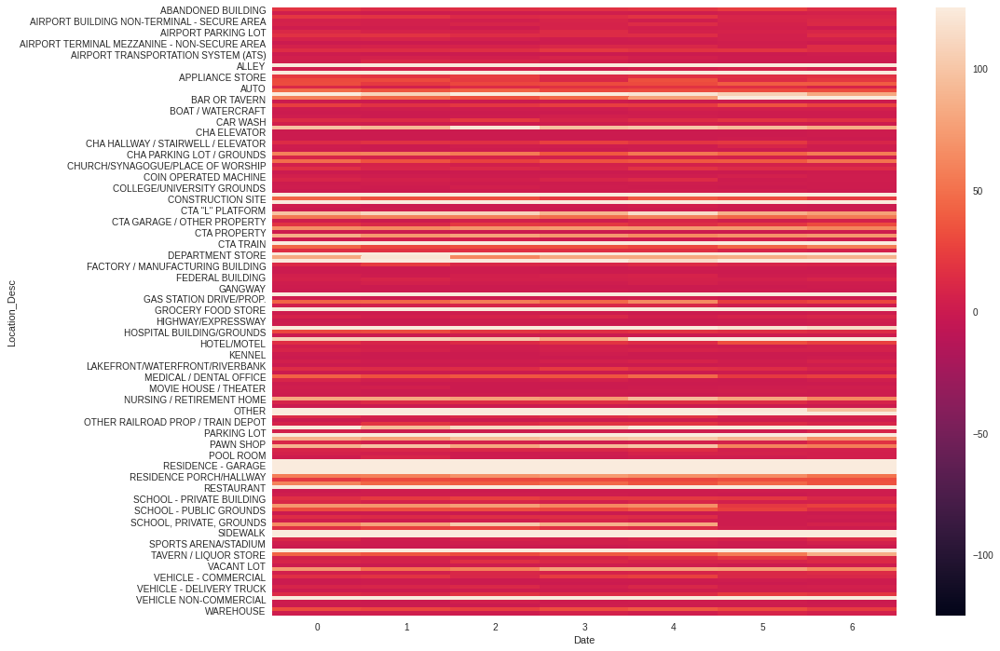

In [ ]:
fig, ax = plt.subplots(figsize=(15, 12))
sns.heatmap(dayofweek_by_location,vmin=-125,vmax=125)
plt.show()

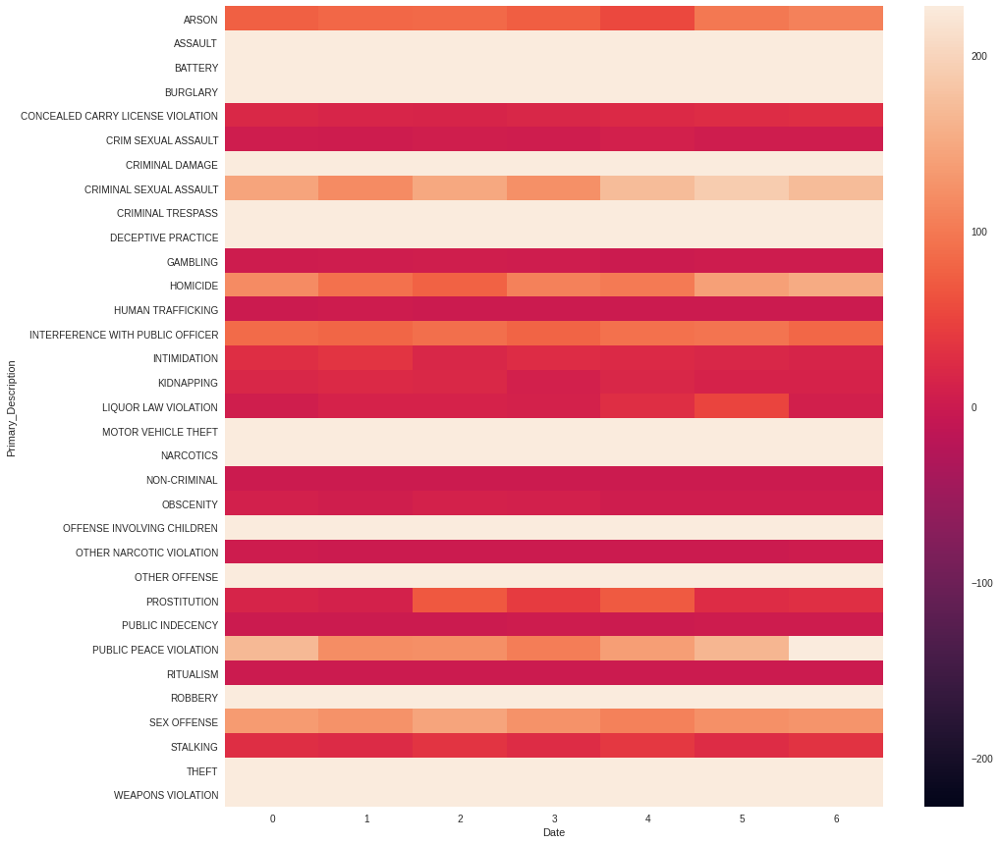

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(dayofweek_by_type,vmin=-228,vmax=228)
plt.show()

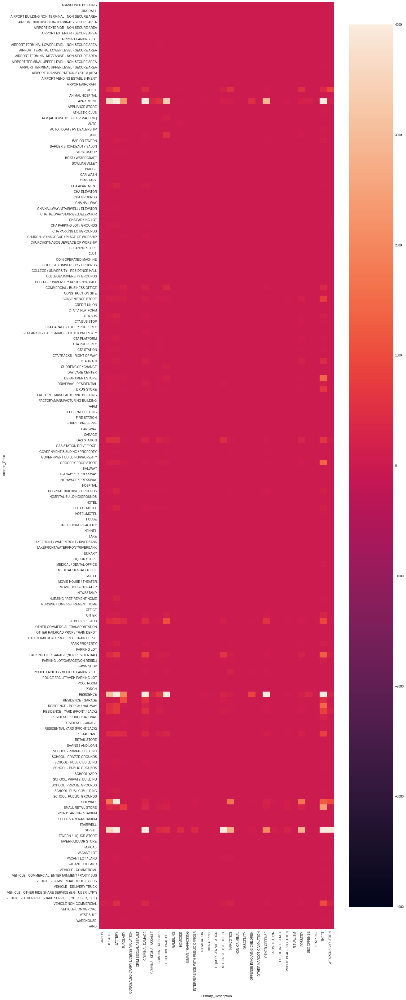

In [ ]:
fig, ax = plt.subplots(figsize=(17, 55))
sns.heatmap(location_by_type,vmin=-4000,vmax=4000)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/regression.py:580: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'fit_reg', 'size', 'scatter_kws'
  **conto

(41.6, 42.05)

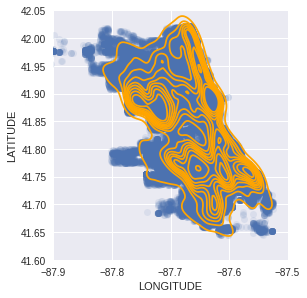

In [ ]:
# All plots on one map as per Primary Description
crimes_new = crimes[(crimes['Primary_Description'] == 'CRIMINAL DAMAGE') | (crimes['Primary_Description'] == 'THEFT') | (crimes['Primary_Description'] == 'BATTERY')]
ax = sns.lmplot('LONGITUDE', 'LATITUDE',
                data= crimes_new[['LONGITUDE','LATITUDE']],
                fit_reg=False,
                size=4, 
                scatter_kws={'alpha':.1})
ax = sns.kdeplot('LONGITUDE', 'LATITUDE',
                data= crimes_new[['LONGITUDE','LATITUDE']],
                fit_reg=False,
                size=4, 
                color='Orange',
                scatter_kws={'alpha':.1}
                 )
ax.set_xlim(-87.9,-87.5)
ax.set_ylim(41.60,42.05)


In [ ]:
#ctypes = ['ARSON', 'ASSAULT', 'BATTERY', 'BURGLARY', 'CONCEALED CARRY LICENSED VIOLATION', 'CRIM SEXUAL ASSAULT', 'CRIMINAL DAMAGE', 'CRIMINAL SEXUAL ASSAULT', 'CRIMINAL TRESPASS', 'DECEPTIVE PRACTICE', 'GAMBLING', 'HOMICIDE', 'HUMAN TRAFFICIKING', 'INTERFERENCE WITH PUBLIC OFFICER', 'INTIMIDATION', 'KIDNAPPING', 'LIQUOR LAW VIOLATION', 'MOTOR VEHICLE THEFT', 'NARCOTICS', 'NON-CRIMINAL', 'OBSCENITY', 'OFFENSE INVOLVING CHILDREN', 'OTHER NARCOTIC VIOLATION','OTHER OFFENSE', 'PROSTITUTION', 'PUBLIC INDECENCY', 'PUBLIC PEACE VIOLATION', 'RITUALISM', 'ROBBERY', 'SEX OFFENSE', 'STALKING', 'THEFT', 'WEAPONS VIOLATION']
ctypes = ['ARSON', 'ASSAULT', 'BATTERY', 'BURGLARY']

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1676: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'fit_re

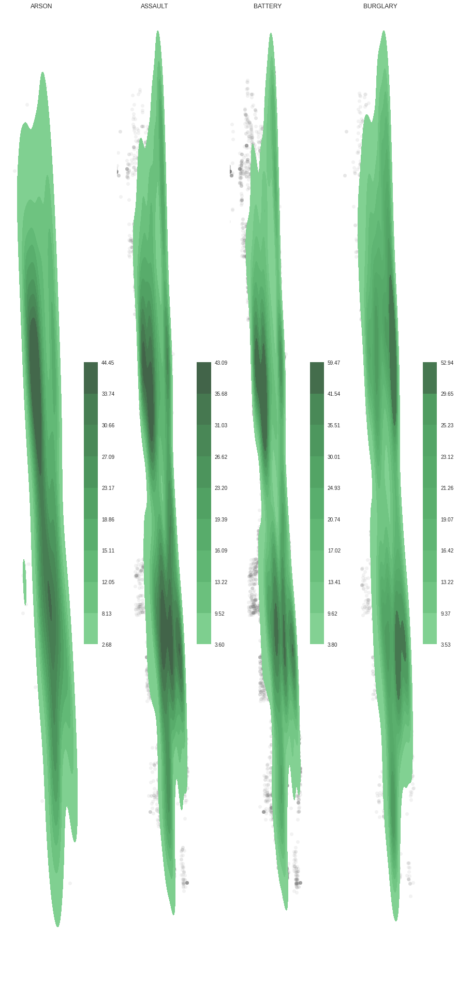

In [ ]:
fig = plt.figure(figsize=(15,35))
for i, crime_type in enumerate(ctypes):
    ax = fig.add_subplot(int(np.ceil(float(len(ctypes)) / 4)), 4, i+1)
    crimes_ = crimes[crimes['Primary_Description']==crime_type]
    sns.regplot('LONGITUDE', 'LATITUDE',
               data= crimes_[['LONGITUDE','LATITUDE']],
               fit_reg=False,
               scatter_kws={'alpha':.1, 'color':'grey'},
               ax=ax)
    
    sns.kdeplot('LONGITUDE', 'LATITUDE',
               data= crimes_[['LONGITUDE','LATITUDE']],
               fit_reg=False,
               scatter_kws={'alpha':.1, 'color':'red'},
               ax=ax,
               cbar=True,
               shade=True, 
               shade_lowest=False,
               
               )
    ax.set_title(crime_type)
    ax.set_xlim(-87.9,-87.5)
    ax.set_ylim(41.60,42.05)
    ax.set_axis_off()   

plt.show()

In [ ]:
crimes_predict.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 203665 entries, 2020-02-25 10:20:00 to 2020-12-25 09:50:00
Data columns (total 15 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   CASE#                  203665 non-null  object        
 1   Date                   203665 non-null  datetime64[ns]
 2   Block                  203665 non-null  object        
 3   Primary_Description    203665 non-null  category      
 4   Secondary_Description  203665 non-null  category      
 5   Location_Desc          203665 non-null  category      
 6   Arrest                 203665 non-null  object        
 7   Domestic               203665 non-null  object        
 8   Beat                   203665 non-null  int64         
 9   Ward                   203665 non-null  float64       
 10  X COORDINATE           203665 non-null  float64       
 11  Y COORDINATE           203665 non-null  float64       
 12  LATITUDE  

In [ ]:
#import geopy
#crimeszip_tmp=crimes_predict
#crimeszip_tmp=crimeszip_tmp.drop(crimeszip_tmp.index[223])
#crimeszip_tmp=crimeszip_tmp.drop(crimeszip_tmp.index[3869])
#geolocator = geopy.Nominatim(user_agent='my-application')
#zipcodes=[]
#for i in range(len(crimeszip_tmp)):
#  print(i)
#  zipcodes.append((geolocator.reverse((crimeszip_tmp['LATITUDE'][i], crimeszip_tmp['LONGITUDE'][i]))).raw['address']['postcode'])

In [ ]:
#crimeszip_tmp=crimeszip_tmp[:3867]
#crimeszip_tmp['zipcode'] = zipcodes
#crimeszip_tmp.to_csv('/content/gdrive/My Drive/Desktop/Crimeszip.csv')

In [ ]:
crimeszip = pd.read_csv('/content/gdrive/MyDrive/Prashant/lab/PBL/Datasets/Crime data/crime_dataset_according_zipcode.csv')
crimeszip.head()

,Date,CASE#,Date.1,Block,Primary_Description,Secondary_Description,Location_Desc,Arrest,Domestic,Beat,Ward,X COORDINATE,Y COORDINATE,LATITUDE,LONGITUDE,LOCATION,zipcode
0,2020-02-25 10:20:00,JD164115,2020-02-25 10:20:00,013XX S CANAL ST,BATTERY,SIMPLE,GROCERY FOOD STORE,Y,N,124,11.0,1173336.0,1893976.0,41.864494,-87.639158,"(41.864493678, -87.639158)",60607
1,2020-02-25 05:30:00,JD163938,2020-02-25 05:30:00,033XX W CULLOM AVE,THEFT,$500 AND UNDER,STREET,N,N,1724,33.0,1153387.0,1928387.0,41.959340,-87.711475,"(41.959339811, -87.711474784)",60618
2,2020-02-25 01:04:00,JC164345,2020-02-25 01:04:00,023XX S PULASKI RD,CRIMINAL TRESPASS,TO LAND,RESTAURANT,Y,N,1013,22.0,1150083.0,1887962.0,41.848475,-87.724676,"(41.848474762, -87.724676285)",60623
3,2020-02-25 06:05:00,JD164701,2020-02-25 06:05:00,058XX N RIDGE AVE,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,Y,Y,2013,48.0,1165471.0,1938819.0,41.987716,-87.666750,"(41.987716355, -87.666750459)",60660
4,2020-02-25 01:42:00,JD164416,2020-02-25 01:42:00,011XX N HARDING AVE,NARCOTICS,POSS: CRACK,STREET,Y,N,1112,37.0,1149847.0,1907230.0,41.901353,-87.725041,"(41.901352928, -87.725041269)",60651


In [ ]:
unique_zipcode =  list(crimeszip['zipcode'].unique())
unique_zipcode

['60607',
 '60618',
 '60623',
 '60660',
 '60651',
 '60631',
 '60619',
 '60632',
 '60652',
 '60629',
 '60603',
 '60644',
 '60615',
 '60633',
 '60625',
 '60634',
 '60657',
 '60637',
 '60647',
 '60628',
 '60602',
 '60624',
 '60653',
 '60643',
 '60614',
 '60630',
 '60642',
 '60620',
 '60617',
 '60621',
 '60627',
 '60608',
 '6069',
 '60639',
 '60654',
 '60601',
 '60609',
 '60640',
 '60641',
 '60626',
 '60636',
 '60645',
 '60612',
 '60622',
 '60617:60649',
 '60611',
 '60459',
 '60613',
 '60827',
 '60646',
 '60712',
 '60656',
 '60618-9997',
 '60610',
 '60616',
 '60659',
 '60605',
 '60655',
 '60638',
 '60606',
 '60649',
 '60124',
 '9020',
 '60302',
 '60707',
 '60402',
 '60661',
 '60628:60827',
 '60604',
 '46394',
 '60696',
 '60805',
 '60456',
 '60804',
 '60666',
 '60409',
 '60706',
 '60202',
 '606',
 '690639',
 '60622-4580',
 '60803',
 '60018']

In [ ]:
crimeszip['Date'] = pd.to_datetime(crimeszip['Date']).dt.date
unique_date =  list(crimeszip['Date'].unique())
unique_date

[datetime.date(2020, 2, 25),
 datetime.date(2020, 4, 28),
 datetime.date(2020, 1, 22),
 datetime.date(2020, 2, 1),
 datetime.date(2020, 9, 30),
 datetime.date(2020, 3, 19),
 datetime.date(2020, 9, 13),
 datetime.date(2020, 4, 2),
 datetime.date(2020, 2, 27),
 datetime.date(2020, 10, 8),
 datetime.date(2020, 5, 31),
 datetime.date(2020, 10, 5),
 datetime.date(2020, 9, 7),
 datetime.date(2020, 11, 20),
 datetime.date(2020, 9, 23),
 datetime.date(2020, 9, 16),
 datetime.date(2020, 10, 6),
 datetime.date(2020, 12, 11),
 datetime.date(2020, 12, 10),
 datetime.date(2020, 11, 4),
 datetime.date(2020, 11, 23),
 datetime.date(2020, 11, 11),
 datetime.date(2020, 11, 19),
 datetime.date(2020, 10, 23),
 datetime.date(2020, 10, 27),
 datetime.date(2020, 12, 9),
 datetime.date(2020, 9, 14),
 datetime.date(2020, 11, 30),
 datetime.date(2020, 12, 7),
 datetime.date(2020, 11, 21),
 datetime.date(2020, 12, 5),
 datetime.date(2020, 11, 8),
 datetime.date(2020, 12, 4),
 datetime.date(2020, 11, 16),
 datet

In [ ]:
Primary_Description_Crimes = []
Secondary_Description_Crimes = []
Location_Desc_Crimes = []
Date_Desc_Crimes = []
for i in range(len(unique_zipcode)):
    Primary_Description_Crimes.append(int(crimeszip[crimeszip['zipcode']==unique_zipcode[i]]['Primary_Description'].nunique()))
    Secondary_Description_Crimes.append(int(crimeszip[crimeszip['zipcode']==unique_zipcode[i]]['Secondary_Description'].nunique()))
    Location_Desc_Crimes.append(int(crimeszip[crimeszip['zipcode']==unique_zipcode[i]]['Location_Desc'].nunique()))
    Date_Desc_Crimes.append(int(crimeszip[crimeszip['zipcode']==unique_zipcode[i]]['Date'].nunique()))
    
Primary_Description_Crimes_Date = []
Secondary_Description_Crimes_Date = []
Location_Desc_Crimes_Date = []
Zipcode_Desc_Crimes_Date = []
for i in range(len(unique_date)):
    Primary_Description_Crimes_Date.append(int(crimeszip[crimeszip['Date']==unique_date[i]]['Primary_Description'].nunique()))
    Secondary_Description_Crimes_Date.append(int(crimeszip[crimeszip['Date']==unique_date[i]]['Secondary_Description'].nunique()))
    Location_Desc_Crimes_Date.append(int(crimeszip[crimeszip['Date']==unique_date[i]]['Location_Desc'].nunique()))
    Zipcode_Desc_Crimes_Date.append(int(crimeszip[crimeszip['Date']==unique_date[i]]['zipcode'].nunique()))
    

In [ ]:
zipcode_df1 = pd.DataFrame({'Zipcode':unique_zipcode , 'Primary_Description_Crimes': Primary_Description_Crimes,'Secondary_Description_Crimes': Secondary_Description_Crimes,'Location_Desc_Crimes': Location_Desc_Crimes, 'Date_Desc_Crimes': Date_Desc_Crimes})
zipcode_df1.style.background_gradient(cmap='Blues')

,Zipcode,Primary_Description_Crimes,Secondary_Description_Crimes,Location_Desc_Crimes,Date_Desc_Crimes
0,60607,11,21,17,12
1,60618,14,28,21,19
2,60623,17,47,16,25
3,60660,7,13,11,11
4,60651,17,57,22,35
5,60631,5,7,6,7
6,60619,15,43,21,29
7,60632,14,28,15,21
8,60652,13,27,17,19
9,60629,14,46,17,33


<Figure size 3600x576 with 0 Axes>

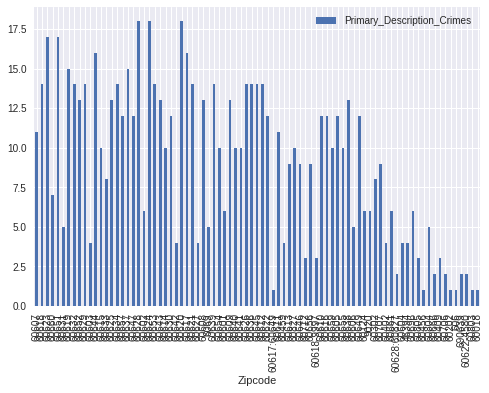

In [ ]:
plt.figure(figsize=(50,8))
zipcode_df1.plot('Zipcode','Primary_Description_Crimes',kind='bar')

In [ ]:
zipcode_df2 = pd.DataFrame({'Date':unique_date , 'Primary_Description_Crimes': Primary_Description_Crimes_Date,'Secondary_Description_Crimes': Secondary_Description_Crimes_Date,'Location_Desc_Crimes': Location_Desc_Crimes_Date,'Zipcode_Desc_Crimes': Zipcode_Desc_Crimes_Date})
zipcode_df2.style.background_gradient(cmap='Blues')

,Date,Primary_Description_Crimes,Secondary_Description_Crimes,Location_Desc_Crimes,Zipcode_Desc_Crimes
0,2020-02-25,12,20,14,23
1,2020-04-28,18,55,35,53
2,2020-01-22,2,2,2,2
3,2020-02-01,4,4,5,4
4,2020-09-30,4,7,5,7
5,2020-03-19,1,1,1,1
6,2020-09-13,3,4,4,4
7,2020-04-02,1,1,1,1
8,2020-02-27,2,2,2,2
9,2020-10-08,21,82,43,63


<Figure size 3600x576 with 0 Axes>

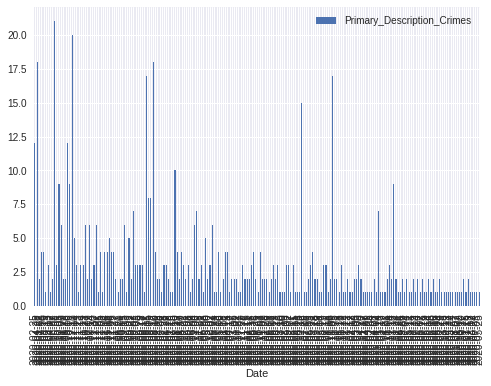

In [ ]:
plt.figure(figsize=(50,8))
zipcode_df2.plot('Date','Primary_Description_Crimes',kind='bar')

In [ ]:
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors
import random
import math
import time
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
import datetime
import operator 
plt.style.use('fivethirtyeight')
%matplotlib inline

In [ ]:
def plot_bar_graphs(x, y, title):
    plt.figure(figsize=(16, 9))
    plt.barh(x, y)
    plt.title(title, size=20)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

<Figure size 3600x2520 with 0 Axes>

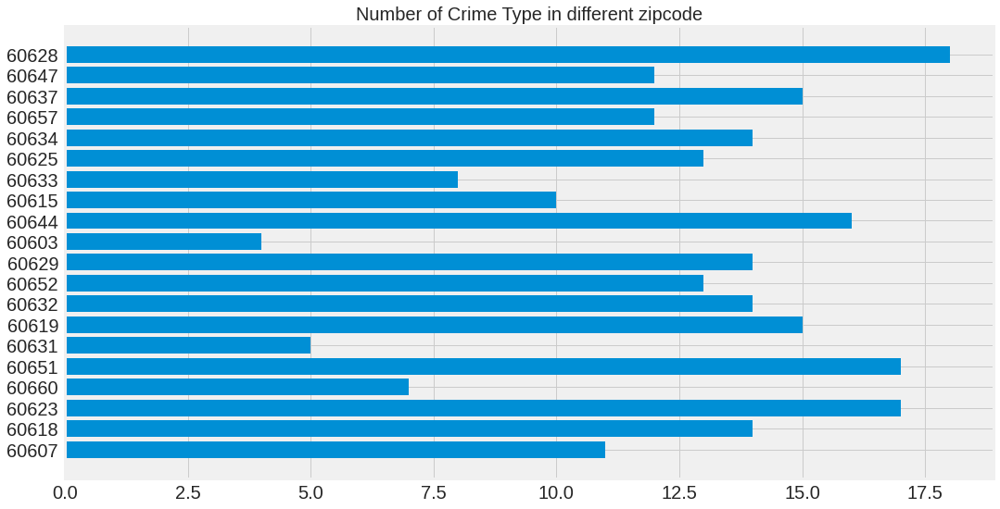

In [ ]:
plt.figure(figsize=(50,35))
plot_bar_graphs(unique_zipcode[:20], Primary_Description_Crimes[:20], 'Number of Crime Type in different zipcode')

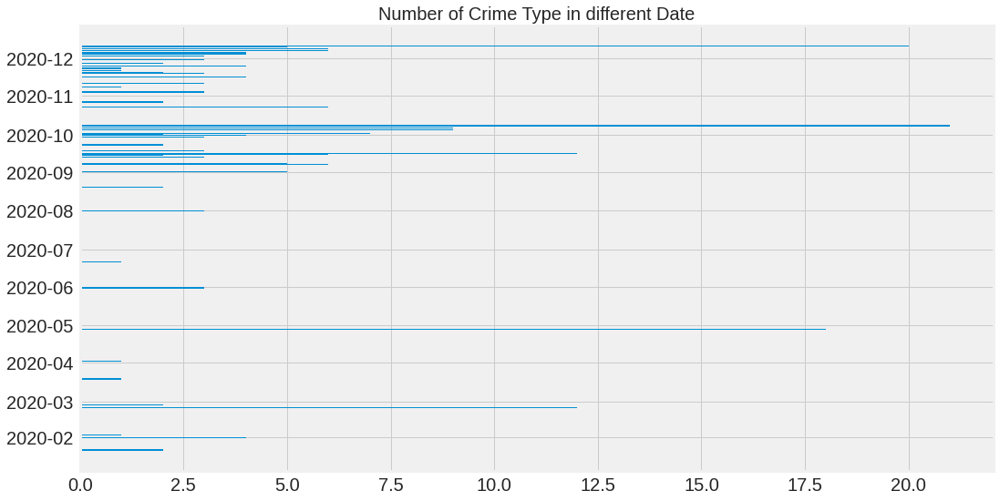

In [ ]:
plot_bar_graphs(unique_date[:50], Primary_Description_Crimes_Date[:50], 'Number of Crime Type in different Date')

In [ ]:
def plot_pie_charts(x, y, title):
    c = random.choices(list(mcolors.CSS4_COLORS.values()),k = 10)
    plt.figure(figsize=(12,12))
    plt.title(title, size=20)
    plt.pie(y, colors=c)
    plt.legend(x, loc='best', fontsize=15)
    plt.show()

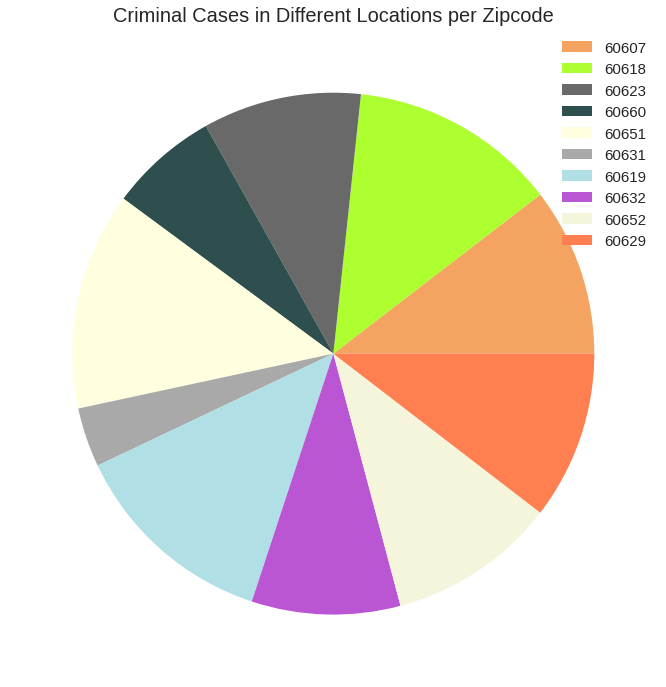

In [ ]:
plot_pie_charts(unique_zipcode[:10], Location_Desc_Crimes[:10], 'Criminal Cases in Different Locations per Zipcode')

<center>
<h1>
<hr/>
<b>
ML Algorithms Implementation on Crime Data
</b>
<hr/>
</h1>
</center>

In [ ]:
# Predicting the future
dates = zipcode_df2['Date']
dates.min()

datetime.date(2020, 1, 22)

In [ ]:
days_since_1_22 = np.array([i for i in range(len(dates))]).reshape(-1, 1)
Primary_Description_Cases = np.array(zipcode_df2['Primary_Description_Crimes']).reshape(-1, 1)
Secondary_Description_Cases = np.array(zipcode_df2['Secondary_Description_Crimes']).reshape(-1, 1)
Location_Desc_Crimes_Cases = np.array(zipcode_df2['Location_Desc_Crimes']).reshape(-1, 1)
Zipcode_Desc_Crimes_Cases = np.array(zipcode_df2['Zipcode_Desc_Crimes']).reshape(-1, 1)

In [ ]:
days_in_future = 50
future_forecast = np.array([i for i in range(len(dates)+days_in_future)]).reshape(-1, 1)
adjusted_dates = future_forecast[:-50]

In [ ]:
start = '1/22/2020'
start_date = datetime.datetime.strptime(start, '%m/%d/%Y')
future_forecast_dates = []
for i in range(len(future_forecast)):
    future_forecast_dates.append((start_date + datetime.timedelta(days=i)).strftime('%m/%d/%Y'))

<hr>
<center>
<h4>
<b>
Building A Linear Regression Model
</b>
</h4>
<hr>
</center>

In [ ]:
X_train_confirmed_Crimes, X_test_confirmed_Crimes, y_train_confirmed_Crimes, y_test_confirmed_Crimes = train_test_split(days_since_1_22, Primary_Description_Cases, test_size=0.25, shuffle=False) 

In [ ]:
# Linear regression for test 
crime_linear_model = LinearRegression()
crime_linear_model.fit(X_train_confirmed_Crimes, y_train_confirmed_Crimes)

crime_linear_pred = crime_linear_model.predict(X_test_confirmed_Crimes)

print('\n')

print('MAE for Linear Regression :', mean_absolute_error(y_test_confirmed_Crimes,crime_linear_pred))
print('MSE for Linear Regression :', mean_squared_error(y_test_confirmed_Crimes,crime_linear_pred))
print('RMSE for Linear Regression : ', np.sqrt(mean_squared_error(y_test_confirmed_Crimes,crime_linear_pred)))

print('\n')



MAE for Linear Regression : 0.9457881535827267
MSE for Linear Regression : 2.5511946918914252
RMSE for Linear Regression :  1.5972459710049123




In [ ]:
confirmed_future_forecast_linear_pred = crime_linear_model.predict(future_forecast)

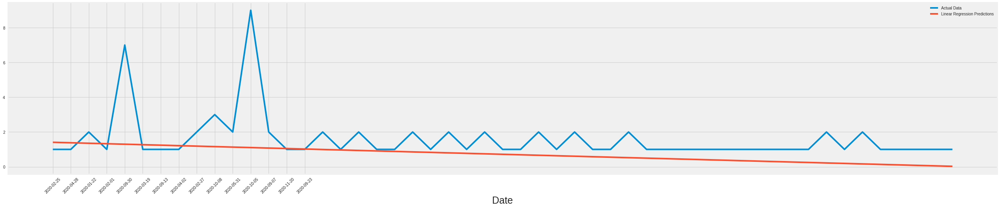

In [ ]:
plt.figure(figsize=(40,8)) 

plt.xticks(range(0,15,1),dates,rotation=45)
plt.xlabel('Date',fontsize=25)

plt.plot(y_test_confirmed_Crimes)
plt.plot(crime_linear_pred)

plt.legend(['Actual Data', 'Linear Regression Predictions']);


<hr>
<center>
<h4>
<b>
Building A Polynomial Model
</b>
</h4>
<hr>
</center>

In [ ]:
# transform data for polynomial regression
poly = PolynomialFeatures(degree=3)
poly_X_train_confirmed_Crimes = poly.fit_transform(X_train_confirmed_Crimes)
poly_X_test_confirmed_Crimes = poly.fit_transform(X_test_confirmed_Crimes)
poly_future_forecast = poly.fit_transform(future_forecast)

In [ ]:
# Polynomial regression
linear_model = LinearRegression(normalize=True, fit_intercept=False)
linear_model.fit(poly_X_train_confirmed_Crimes, y_train_confirmed_Crimes)
test_linear_pred = linear_model.predict(poly_X_test_confirmed_Crimes)
linear_pred = linear_model.predict(poly_future_forecast)
print('MAE:', mean_absolute_error(test_linear_pred, y_test_confirmed_Crimes))
print('MSE:',mean_squared_error(test_linear_pred, y_test_confirmed_Crimes))
print('RMSE for SVM : ', np.sqrt(mean_squared_error(test_linear_pred,y_test_confirmed_Crimes)))

MAE: 1.022337341089966
MSE: 2.4937134978827857
RMSE for SVM :  1.5791496122542619


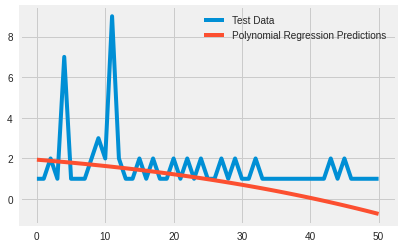

In [ ]:
plt.plot(y_test_confirmed_Crimes)
plt.plot(test_linear_pred)
plt.legend(['Test Data', 'Polynomial Regression Predictions'])

<hr>
<center>
<h4>
<b>
Building A SVM Model
</b>
</h4>
<hr>
</center>

In [ ]:
# svm_confirmed = svm_search.best_estimator_
svm_confirmed = SVR(shrinking=True, kernel='poly',gamma=0.01, epsilon=1,degree=5, C=0.1)
svm_confirmed.fit(X_train_confirmed_Crimes, y_train_confirmed_Crimes)
svm_pred = svm_confirmed.predict(future_forecast)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


MAE: 916.5156680070727
MSE: 974679.1512979766
RMSE for SVM :  987.258401482599


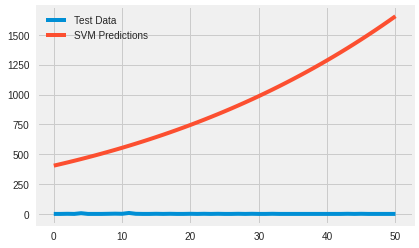

In [ ]:
svm_test_pred = svm_confirmed.predict(X_test_confirmed_Crimes)
plt.plot(y_test_confirmed_Crimes)
plt.plot(svm_test_pred)
plt.legend(['Test Data', 'SVM Predictions'])
print('MAE:', mean_absolute_error(svm_test_pred, y_test_confirmed_Crimes))
print('MSE:',mean_squared_error(svm_test_pred, y_test_confirmed_Crimes))
print('RMSE for SVM : ', np.sqrt(mean_squared_error(svm_test_pred,y_test_confirmed_Crimes)))

In [ ]:
adjusted_dates = adjusted_dates.reshape(1, -1)[0]
def plot_predictions(x, y, pred, algo_name, color):
    plt.figure(figsize=(16, 9))
    plt.plot(x, y)
    plt.plot(future_forecast, pred, linestyle='dashed', color=color)
    plt.title('Number of Criminal Cases Over Time', size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('Number of Cases', size=30)
    plt.legend(['Confirmed Cases', algo_name], prop={'size': 20})
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

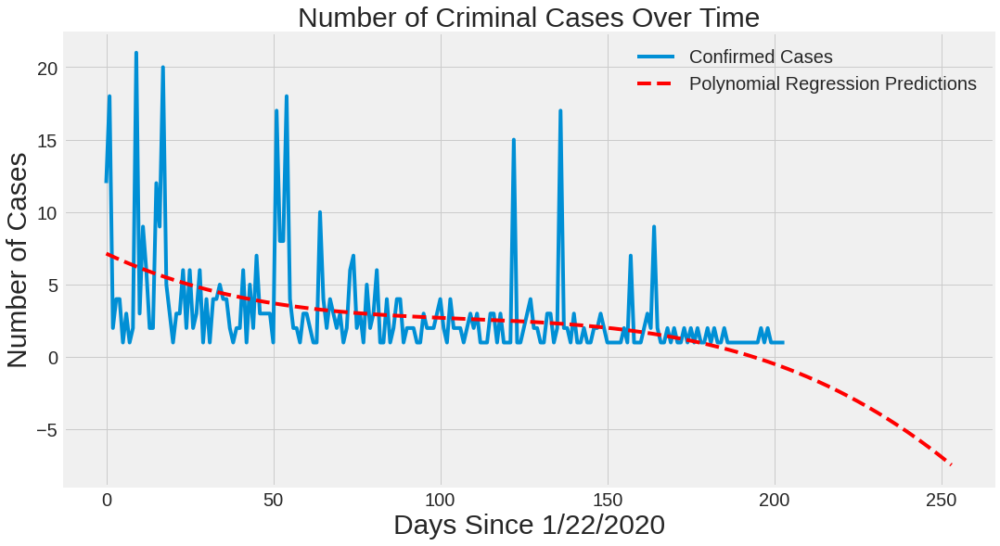

In [ ]:
plot_predictions(adjusted_dates, zipcode_df2['Primary_Description_Crimes'], linear_pred, 'Polynomial Regression Predictions', 'red')


<hr>
<center>
<h4>
<b>
Prophet
</b>
</h4>
<hr>
</center>


In [ ]:
from fbprophet import Prophet
df_prophet = pd.DataFrame({'ds':dates , 'y': zipcode_df2['Primary_Description_Crimes']})
df_m1 = df_prophet.copy()

In [ ]:
df_m1['y'] = np.log(df_m1['y'])

In [ ]:
m1_plain = Prophet()
m1_plain.fit(df_m1)
future = m1_plain.make_future_dataframe(periods=365)
forecast_m1 = m1_plain.predict(future)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


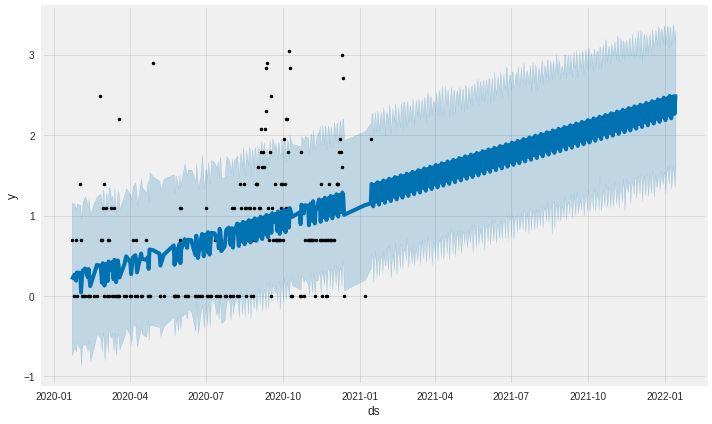

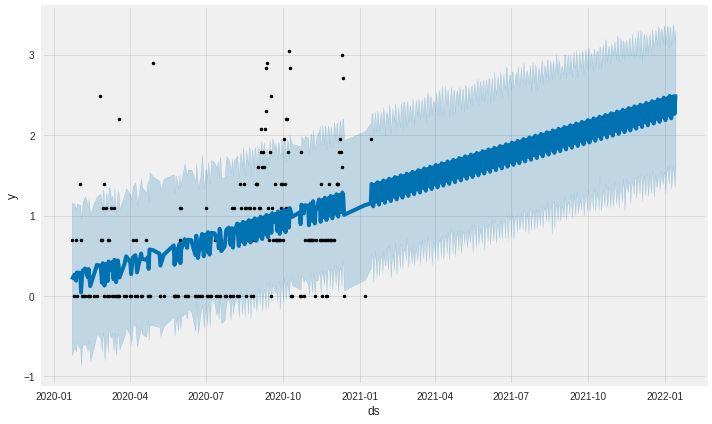

In [ ]:
m1_plain.plot(forecast_m1)

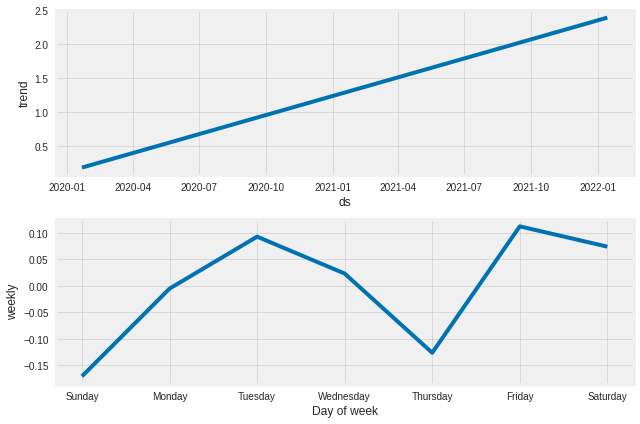

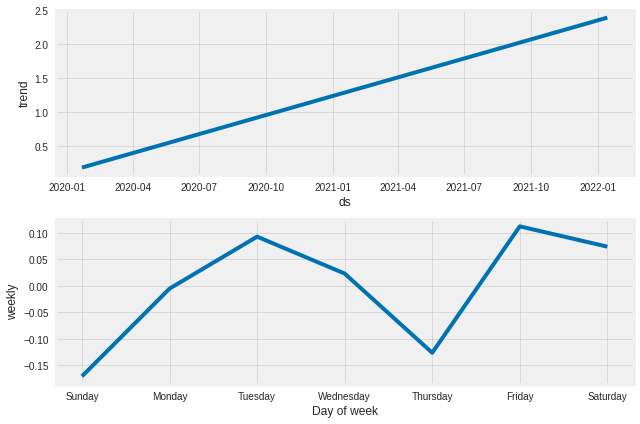

In [ ]:
m1_plain.plot_components(forecast_m1)

In [ ]:
# First, let's get some useful variables: "y" for the actual value and "n" for the number of observations.
y = df_prophet['y'].to_frame()
y.index = df_prophet['ds']
n = np.int(y.count())


In [ ]:
# The forecast is 'log transformed', so we need to 'inverse' it back by using the exp
forecast_m1_exp = np.exp(forecast_m1[['yhat','yhat_lower','yhat_upper']])
forecast_m1_exp.index = forecast_m1['ds']

In [ ]:
# Now let's calculate the MAPE for m1
error = forecast_m1_exp['yhat'] - y['y']
MAPE_m1 = (error/y['y']).abs().sum()/n *100
round(MAPE_m1,2)

56.38

<hr>

<center>
<h1>
<b>
     Analysis Based On Chicago Covid-19 Datasets 
</b>
</h1>
<hr>
</center>

In [ ]:

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:



import math
import time
import random
import operator 
import datetime

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors


from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error, mean_absolute_error
from pylab import rcParams
plt.style.use('fivethirtyeight')
%matplotlib inline


!pip install geopandas
import geopandas




     |████████████████████████████████| 1.0MB 19.7MB/s 
     |████████████████████████████████| 15.3MB 338kB/s 
     |████████████████████████████████| 6.5MB 38.9MB/s 


In [ ]:
Covid19_Datasets_url='/content/drive/MyDrive/Prashant/lab/PBL/Datasets/Covid19_data/Covid19_data.csv'
covid_data=pd.read_csv(Covid19_Datasets_url)
df=covid_data
df.sample(10)

,ZIP Code,Week Number,Week Start,Week End,Cases - Weekly,Cases - Cumulative,Case Rate - Weekly,Case Rate - Cumulative,Tests - Weekly,Tests - Cumulative,Test Rate - Weekly,Test Rate - Cumulative,Percent Tested Positive - Weekly,Percent Tested Positive - Cumulative,Deaths - Weekly,Deaths - Cumulative,Death Rate - Weekly,Death Rate - Cumulative,Population,Row ID,ZIP Code Location
311,60636,23,05/31/2020,06/06/2020,25.0,722.0,78.0,2242.0,308.0,3146,956,9769.3,0.1,0.2,1,46,3.1,142.8,32203,60636-2020-23,POINT (-87.668597 41.77599)
1047,60656,51,12/13/2020,12/19/2020,102.0,1980.0,370.0,7179.4,740.0,17967,2683,65147.4,0.2,0.1,3,32,10.9,116.0,27579,60656-2020-51,POINT (-87.817934 41.974566)
1547,60647,16,04/12/2020,04/18/2020,123.0,281.0,141.0,321.1,404.0,1152,462,1316.4,0.3,0.2,6,7,6.9,8.0,87509,60647-2020-16,POINT (-87.701101 41.921058)
1740,60617,42,10/11/2020,10/17/2020,170.0,2572.0,206.0,3116.3,1676.0,31966,2031,38730.7,0.1,0.1,2,84,2.4,101.8,82534,60617-2020-42,POINT (-87.556897 41.721257)
1490,60625,36,08/30/2020,09/05/2020,56.0,2043.0,71.0,2578.1,1470.0,24451,1855,30855.7,0.0,0.1,2,110,2.5,138.8,79243,60625-2020-36,POINT (-87.701816 41.971155)
1536,60643,39,09/20/2020,09/26/2020,18.0,1210.0,36.0,2426.3,1298.0,21818,2603,43749.7,0.0,0.1,0,75,0.0,150.4,49870,60643-2020-39,POINT (-87.662381 41.700445)
2733,60611,10,03/01/2020,03/07/2020,NaN,NaN,NaN,NaN,3.0,3,9,9.3,0.0,0.0,0,0,0.0,0.0,32426,60611-2020-10,POINT (-87.620291 41.894734)
5,60618,38,09/13/2020,09/19/2020,65.0,2183.0,69.0,2312.6,1789.0,33034,1895,34995.5,0.0,0.1,0,52,0.0,55.1,94395,60618-2020-38,POINT (-87.703343 41.946699)
69,60610,48,11/22/2020,11/28/2020,95.0,1821.0,244.0,4667.0,1705.0,32537,4370,83387.6,0.1,0.1,1,16,2.6,41.0,39019,60610-2020-48,POINT (-87.63581 41.90455)
1592,60660,49,11/29/2020,12/05/2020,123.0,1635.0,284.0,3781.0,1589.0,29888,3675,69118.0,0.1,0.1,2,48,4.6,111.0,43242,60660-2020-49,POINT (-87.666362 41.991062)


In [ ]:


df.isna().sum()



ZIP Code                                  0
Week Number                               0
Week Start                                0
Week End                                  0
Cases - Weekly                          185
Cases - Cumulative                      185
Case Rate - Weekly                      185
Case Rate - Cumulative                  185
Tests - Weekly                           50
Tests - Cumulative                        0
Test Rate - Weekly                        0
Test Rate - Cumulative                    0
Percent Tested Positive - Weekly          0
Percent Tested Positive - Cumulative      0
Deaths - Weekly                           0
Deaths - Cumulative                       0
Death Rate - Weekly                       0
Death Rate - Cumulative                   0
Population                                0
Row ID                                    0
ZIP Code Location                        48
dtype: int64

In [ ]:


df.isnull().sum()



ZIP Code                                  0
Week Number                               0
Week Start                                0
Week End                                  0
Cases - Weekly                          185
Cases - Cumulative                      185
Case Rate - Weekly                      185
Case Rate - Cumulative                  185
Tests - Weekly                           50
Tests - Cumulative                        0
Test Rate - Weekly                        0
Test Rate - Cumulative                    0
Percent Tested Positive - Weekly          0
Percent Tested Positive - Cumulative      0
Deaths - Weekly                           0
Deaths - Cumulative                       0
Death Rate - Weekly                       0
Death Rate - Cumulative                   0
Population                                0
Row ID                                    0
ZIP Code Location                        48
dtype: int64

In [ ]:


df=df.fillna(0)
df.isna().sum()



ZIP Code                                0
Week Number                             0
Week Start                              0
Week End                                0
Cases - Weekly                          0
Cases - Cumulative                      0
Case Rate - Weekly                      0
Case Rate - Cumulative                  0
Tests - Weekly                          0
Tests - Cumulative                      0
Test Rate - Weekly                      0
Test Rate - Cumulative                  0
Percent Tested Positive - Weekly        0
Percent Tested Positive - Cumulative    0
Deaths - Weekly                         0
Deaths - Cumulative                     0
Death Rate - Weekly                     0
Death Rate - Cumulative                 0
Population                              0
Row ID                                  0
ZIP Code Location                       0
dtype: int64

In [ ]:


df['ZIP Code'].unique()



array(['60621', '60623', '60652', '60647', '60613', '60618', '60601',
       '60628', '60636', '60707', '60659', '60634', '60632', '60655',
       '60616', '60641', '60637', '60645', '60630', '60631', '60607',
       '60666', '60629', '60602', '60639', '60624', '60651', '60615',
       '60646', '60644', '60638', '60643', '60609', '60633', '60654',
       '60827', '60625', '60617', '60606', '60605', '60640', '60610',
       '60656', '60622', '60620', '60657', '60604', '60619', 'Unknown',
       '60611', '60626', '60642', '60649', '60653', '60608', '60603',
       '60612', '60614', '60660', '60661'], dtype=object)

In [ ]:


new_df=df[(df['ZIP Code']!="Unknown") & (df['Population']!=0)].dropna(how="any")

new_df['ZIP Code'].unique()



array(['60621', '60623', '60652', '60647', '60613', '60618', '60601',
       '60628', '60636', '60707', '60659', '60634', '60632', '60655',
       '60616', '60641', '60637', '60645', '60630', '60631', '60607',
       '60629', '60602', '60639', '60624', '60651', '60615', '60646',
       '60644', '60638', '60643', '60609', '60633', '60654', '60827',
       '60625', '60617', '60606', '60605', '60640', '60610', '60656',
       '60622', '60620', '60657', '60604', '60619', '60611', '60626',
       '60642', '60649', '60653', '60608', '60603', '60612', '60614',
       '60660', '60661'], dtype=object)

In [ ]:


new_df



,ZIP Code,Week Number,Week Start,Week End,Cases - Weekly,Cases - Cumulative,Case Rate - Weekly,Case Rate - Cumulative,Tests - Weekly,Tests - Cumulative,Test Rate - Weekly,Test Rate - Cumulative,Percent Tested Positive - Weekly,Percent Tested Positive - Cumulative,Deaths - Weekly,Deaths - Cumulative,Death Rate - Weekly,Death Rate - Cumulative,Population,Row ID,ZIP Code Location
0,60621,10,03/01/2020,03/07/2020,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0,0,0.0,0.0,29042,60621-2020-10,POINT (-87.638812 41.776931)
1,60623,11,03/08/2020,03/14/2020,0.0,0.0,0.0,0.0,4.0,6,5,7.0,0.0,0.0,0,0,0.0,0.0,85979,60623-2020-11,POINT (-87.717446 41.850321)
2,60652,10,03/01/2020,03/07/2020,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0,0,0.0,0.0,43907,60652-2020-10,POINT (-87.714238 41.745398)
3,60647,13,03/22/2020,03/28/2020,27.0,48.0,31.0,54.9,174.0,309,199,353.1,0.1,0.1,0,0,0.0,0.0,87509,60647-2020-13,POINT (-87.701101 41.921058)
4,60613,31,07/26/2020,08/01/2020,27.0,559.0,54.0,1115.5,1171.0,10239,2337,20431.8,0.0,0.1,0,31,0.0,61.9,50113,60613-2020-31,POINT (-87.661343 41.953742)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2874,60660,25,06/14/2020,06/20/2020,22.0,465.0,51.0,1075.3,798.0,3969,1845,9178.6,0.0,0.1,0,39,0.0,90.2,43242,60660-2020-25,POINT (-87.666362 41.991062)
2875,60621,16,04/12/2020,04/18/2020,75.0,218.0,258.0,750.6,168.0,586,578,2017.8,0.4,0.4,3,9,10.3,31.0,29042,60621-2020-16,POINT (-87.638812 41.776931)
2876,60630,35,08/23/2020,08/29/2020,50.0,1158.0,87.0,2019.4,984.0,14516,1716,25313.9,0.1,0.1,1,63,1.7,109.9,57344,60630-2020-35,POINT (-87.759611 41.971261)
2877,60640,3,01/17/2021,01/23/2021,75.0,3607.0,108.0,5173.9,3194.0,78955,4582,113254.0,0.0,0.0,3,134,4.3,192.2,69715,60640-2021-3,POINT (-87.662232 41.971888)


In [ ]:

cols = new_df.keys()
cols


Index(['ZIP Code', 'Week Number', 'Week Start', 'Week End', 'Cases - Weekly',
       'Cases - Cumulative', 'Case Rate - Weekly', 'Case Rate - Cumulative',
       'Tests - Weekly', 'Tests - Cumulative', 'Test Rate - Weekly',
       'Test Rate - Cumulative', 'Percent Tested Positive - Weekly',
       'Percent Tested Positive - Cumulative', 'Deaths - Weekly',
       'Deaths - Cumulative', 'Death Rate - Weekly', 'Death Rate - Cumulative',
       'Population', 'Row ID', 'ZIP Code Location'],
      dtype='object')

In [ ]:


groupby_for_v=new_df.groupby(['ZIP Code','Week End','Cases - Weekly','Tests - Weekly','Percent Tested Positive - Weekly','Deaths - Weekly','Population']).sum()
groupby_for_v.head(50)



Week Number  ...  Death Rate - Cumulative
ZIP Code Week End   Cases - Weekly Tests - Weekly Percent Tested Positive - Weekly Deaths - Weekly Population               ...                         
60601    01/02/2021 25.0           503.0          0.1                              0               14675                53  ...                     68.1
         01/09/2021 43.0           759.0          0.0                              1               14675                 1  ...                     75.0
         01/16/2021 25.0           605.0          0.0                              0               14675                 2  ...                     75.0
         01/23/2021 16.0           494.0          0.0                              0               14675                 3  ...                     75.0
         01/30/2021 11.0           528.0          0.0                              0               14675                 4  ...                     75.0
         03/07/2020 0.0            1.0            0.0                              0               14675                10  ...                      0.0
         03/14/2020 0.0            5.0            0.0                              0               14675                11  ...                      0.0
         03/21/2020 10.0           31.0           0.2                              0               14675                12  ...                      0.0
         03/28/2020 9.0            36.0           0.2                              0               14675                13  ...                      0.0
         04/04/2020 5.0            21.0           0.2                              0               14675                14  ...                      0.0
         04/11/2020 5.0            38.0           0.1                              0               14675                15  ...                      0.0
         04/18/2020 3.0            31.0           0.1                              1               14675                16  ...                      6.8
         04/25/2020 7.0            35.0           0.1                              1               14675                17  ...                     13.6
         05/02/2020 13.0           70.0           0.2                              1               14675                18  ...                     20.4
         05/09/2020 7.0            76.0           0.1                              1               14675                19  ...                     27.3
         05/16/2020 3.0            83.0           0.0                              0               14675                20  ...                     27.3
         05/23/2020 2.0            88.0           0.0                              0               14675                21  ...                     27.3
         05/30/2020 2.0            86.0           0.0                              0               14675                22  ...                     27.3
         06/06/2020 1.0            75.0           0.0                              1               14675                23  ...                     34.1
         06/13/2020 6.0            105.0          0.0                              0               14675                24  ...                     34.1
         06/20/2020 5.0            118.0          0.1                              0               14675                25  ...                     34.1
         06/27/2020 4.0            175.0          0.0                              0               14675                26  ...                     34.1
         07/04/2020 3.0            162.0          0.0                              0               14675                27  ...                     34.1
         07/11/2020 4.0            202.0          0.0                              0               14675                28  ...                     34.1
         07/18/2020 6.0            199.0          0.0                              0               14675                29  ...      

In [ ]:


new_df[['ZIP Code','Week End','Cases - Weekly','Case Rate - Weekly','Tests - Weekly','Test Rate - Weekly','Percent Tested Positive - Weekly','Deaths - Weekly','Death Rate - Weekly','Population']].value_counts()

# d['ZIP Code'].value_counts().count()
# d[d['ZIP Code']=='60621']



ZIP Code  Week End    Cases - Weekly  Case Rate - Weekly  Tests - Weekly  Test Rate - Weekly  Percent Tested Positive - Weekly  Deaths - Weekly  Death Rate - Weekly  Population
60827     12/26/2020  4.0             14.0                0.0             0                   0.0                               0                0.0                  28577         1
60620     04/25/2020  185.0           272.0               930.0           1366                0.2                               4                5.9                  68096         1
          06/20/2020  28.0            41.0                755.0           1109                0.0                               2                2.9                  68096         1
          06/13/2020  31.0            46.0                792.0           1163                0.0                               1                1.5                  68096         1
          06/06/2020  37.0            54.0                608.0           893                 0

In [ ]:


df.columns



Index(['ZIP Code', 'Week Number', 'Week Start', 'Week End', 'Cases - Weekly',
       'Cases - Cumulative', 'Case Rate - Weekly', 'Case Rate - Cumulative',
       'Tests - Weekly', 'Tests - Cumulative', 'Test Rate - Weekly',
       'Test Rate - Cumulative', 'Percent Tested Positive - Weekly',
       'Percent Tested Positive - Cumulative', 'Deaths - Weekly',
       'Deaths - Cumulative', 'Death Rate - Weekly', 'Death Rate - Cumulative',
       'Population', 'Row ID', 'ZIP Code Location'],
      dtype='object')

In [ ]:


df[['Cases - Weekly','Cases - Cumulative', 'Case Rate - Weekly', 'Case Rate - Cumulative',
       'Tests - Weekly', 'Tests - Cumulative', 'Test Rate - Weekly',
       'Test Rate - Cumulative', 'Percent Tested Positive - Weekly',
       'Percent Tested Positive - Cumulative', 'Deaths - Weekly',
       'Deaths - Cumulative', 'Death Rate - Weekly', 'Death Rate - Cumulative',
       'Population']].describe()



,Cases - Weekly,Cases - Cumulative,Case Rate - Weekly,Case Rate - Cumulative,Tests - Weekly,Tests - Cumulative,Test Rate - Weekly,Test Rate - Cumulative,Percent Tested Positive - Weekly,Percent Tested Positive - Cumulative,Deaths - Weekly,Deaths - Cumulative,Death Rate - Weekly,Death Rate - Cumulative,Population
count,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000,2880.000000
mean,79.217708,1456.931250,154.493750,2787.667604,967.224306,16547.549306,2064.914236,34548.856806,0.091389,0.119931,1.620486,43.378472,2.998472,79.110799,46230.216667
std,109.540815,1923.405617,160.827739,2617.002489,905.603297,19574.509159,1645.323856,35049.364067,0.095771,0.084704,2.727282,44.284640,5.133395,70.194421,26854.761468
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15.000000,194.750000,47.000000,803.925000,230.000000,1353.250000,857.750000,4804.875000,0.000000,0.100000,0.000000,4.000000,0.000000,13.500000,28747.250000
50%,42.000000,822.500000,94.000000,2039.150000,762.000000,8968.000000,1774.500000,23804.500000,0.100000,0.100000,0.000000,32.000000,0.000000,68.250000,44965.500000
75%,101.000000,1915.250000,219.250000,4100.175000,1439.000000,24870.250000,2951.000000,55939.775000,0.100000,0.200000,2.000000,71.000000,4.200000,125.125000,67067.000000
max,1217.000000,15287.000000,1151.000000,13978.600000,5542.000000,105885.000000,11679.000000,188939.100000,0.500000,0.500000,25.000000,233.000000,80.400000,319.400000,111850.000000


In [ ]:

# Pair plot for better visualization

sns.pairplot(new_df)



Output hidden; open in https://colab.research.google.com to view.

In [ ]:

# Finding relation between features

rcParams['figure.figsize'] =40,20
sns.set(font_scale=2)
corr=new_df.corr()
corr



,Week Number,Cases - Weekly,Cases - Cumulative,Case Rate - Weekly,Case Rate - Cumulative,Tests - Weekly,Tests - Cumulative,Test Rate - Weekly,Test Rate - Cumulative,Percent Tested Positive - Weekly,Percent Tested Positive - Cumulative,Deaths - Weekly,Deaths - Cumulative,Death Rate - Weekly,Death Rate - Cumulative,Population
Week Number,1.000000e+00,0.266531,0.177709,0.372003,0.252579,0.366061,0.255364,0.443883,0.302780,-0.134283,-0.252352,-0.073375,0.216996,-0.060454,0.248788,1.181593e-17
Cases - Weekly,2.665305e-01,1.000000,0.689351,0.783804,0.515397,0.664854,0.557293,0.292395,0.259827,0.466295,0.261193,0.474454,0.501770,0.275540,0.310053,5.180750e-01
Cases - Cumulative,1.777095e-01,0.689351,1.000000,0.460905,0.815167,0.688245,0.826366,0.290443,0.461620,0.144436,0.096314,0.264922,0.800924,0.105928,0.573722,5.605069e-01
Case Rate - Weekly,3.720033e-01,0.783804,0.460905,1.000000,0.577496,0.496477,0.422982,0.547596,0.464753,0.456755,0.151106,0.324033,0.267959,0.260411,0.245224,1.251604e-01
Case Rate - Cumulative,2.525792e-01,0.515397,0.815167,0.577496,1.000000,0.566041,0.756467,0.574346,0.788670,0.054035,-0.040059,0.125328,0.617673,0.083678,0.603929,1.838526e-01
Tests - Weekly,3.660609e-01,0.664854,0.688245,0.496477,0.566041,1.000000,0.866977,0.637743,0.559880,-0.010610,-0.157948,0.156161,0.652421,0.032575,0.503337,5.400900e-01
Tests - Cumulative,2.553639e-01,0.557293,0.826366,0.422982,0.756467,0.866977,1.000000,0.555538,0.715645,-0.033856,-0.195749,0.099887,0.699781,0.005811,0.572525,4.449493e-01
Test Rate - Weekly,4.438825e-01,0.292395,0.290443,0.547596,0.574346,0.637743,0.555538,1.000000,0.839295,-0.173189,-0.351568,-0.092425,0.212190,-0.058819,0.285500,-1.228456e-01
Test Rate - Cumulative,3.027802e-01,0.259827,0.461620,0.464753,0.788670,0.559880,0.715645,0.839295,1.000000,-0.155792,-0.334016,-0.086789,0.325594,-0.048864,0.413610,-7.691719e-02
Percent Tested Positive - Weekly,-1.342826e-01,0.466295,0.144436,0.456755,0.054035,-0.010610,-0.033856,-0.173189,-0.155792,1.000000,0.725103,0.507329,0.014834,0.419070,-0.074466,2.456080e-01


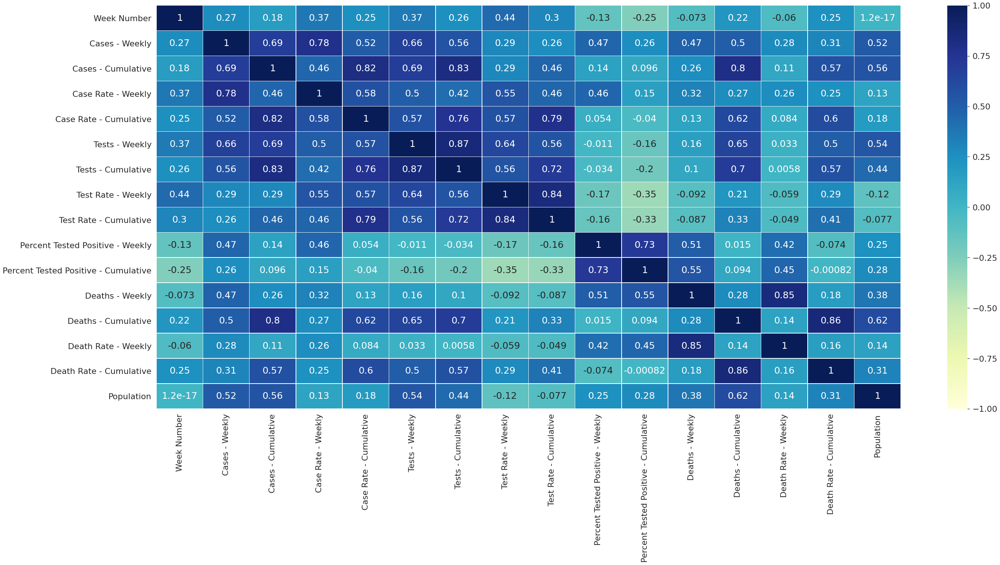

In [ ]:

sns.heatmap(corr, xticklabels=corr.columns.values,yticklabels=corr.columns.values,annot=True,linewidths=.5,cmap="YlGnBu",annot_kws={"size":25},vmin=-1,vmax=1)


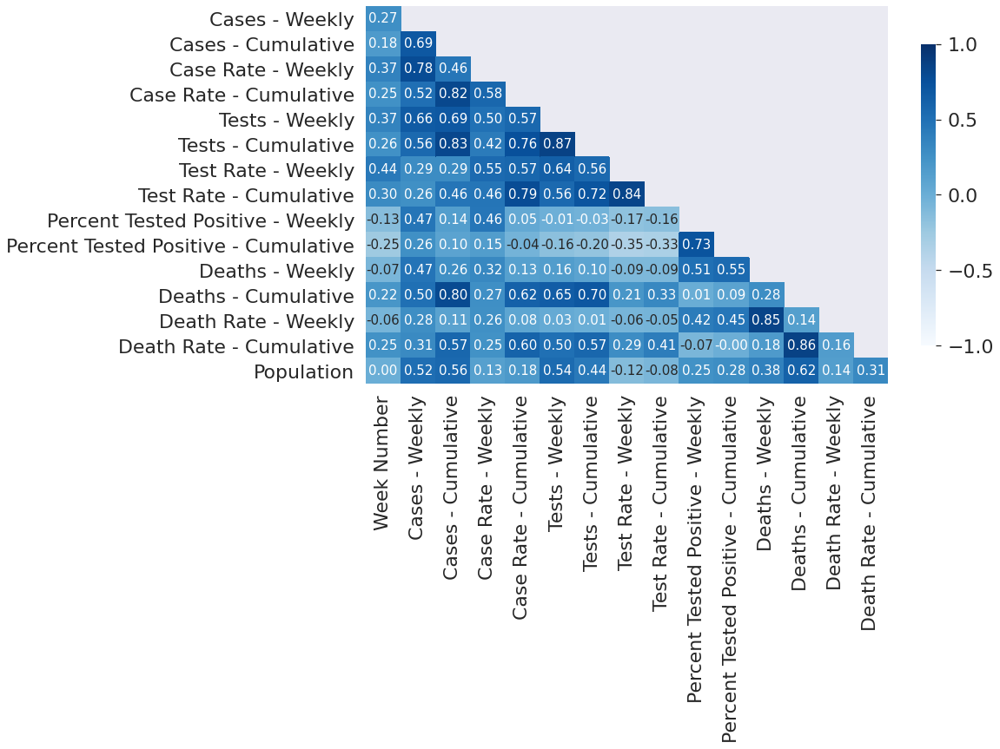

In [ ]:


fig, ax = plt.subplots(figsize=(12, 8))# mask
mask = np.triu(np.ones_like(corr, dtype=np.bool))# adjust mask and df
mask = mask[1:, :-1]
corr = corr.iloc[1:,:-1].copy()# plot heatmap
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap='Blues',
           vmin=-1, vmax=1, cbar_kws={"shrink": .8},annot_kws={"size":15})# yticks
plt.yticks(rotation=0)
plt.show()



In [ ]:


cases=new_df.groupby('ZIP Code')['Cases - Weekly'].sum()
population=new_df.groupby('ZIP Code')['Population'].sum()
deaths = new_df.groupby('ZIP Code')['Deaths - Weekly'].sum()
tests=new_df.groupby('ZIP Code')['Tests - Weekly'].sum()
percent_positive=new_df.groupby('ZIP Code')['Percent Tested Positive - Weekly'].sum()

cases



ZIP Code
60601      831.0
60602       79.0
60603       54.0
60604       83.0
60605     1516.0
60606      241.0
60607     2106.0
60608     7044.0
60609     6270.0
60610     2575.0
60611     1719.0
60612     2885.0
60613     2887.0
60614     4168.0
60615     1838.0
60616     3020.0
60617     6719.0
60618     6739.0
60619     3613.0
60620     4297.0
60621     1885.0
60622     4068.0
60623     9746.0
60624     2704.0
60625     5708.0
60626     3538.0
60628     4148.0
60629    15287.0
60630     4532.0
60631     2508.0
60632    11926.0
60633     1168.0
60634     8570.0
60636     2680.0
60637     2710.0
60638     6695.0
60639    12653.0
60640     3660.0
60641     7483.0
60642     1545.0
60643     3530.0
60644     3525.0
60645     3959.0
60646     2115.0
60647     7172.0
60649     2751.0
60651     6653.0
60652     4521.0
60653     2085.0
60654     1549.0
60655     2795.0
60656     2440.0
60657     3932.0
60659     3343.0
60660     2218.0
60661      613.0
60707     1944.0
60827      267.0
Name:

In [ ]:

unique_region =  list(new_df['ZIP Code'].unique())
# len(unique_region)
# unique_region


confirmed_by_region = []
death_by_region = [] 
test_by_region=[]
population_by_region=[]


for i in unique_region:
    cases12 = new_df[new_df['ZIP Code']==i]['Cases - Weekly'].sum()
    if cases12 > 0:
        confirmed_by_region.append(cases12)

# len(confirmed_by_region) 
# # sort region by the number of confirmed cases
unique_region = [k for k, v in sorted(zip(unique_region, confirmed_by_region), key=operator.itemgetter(1), reverse=True)]
# len(unique_region)

for i in range(len(unique_region)):
    confirmed_by_region[i]=int(new_df[new_df['ZIP Code']==unique_region[i]]['Cases - Weekly'].sum())
    death_by_region.append(int(new_df[new_df['ZIP Code']==unique_region[i]]['Deaths - Weekly'].sum()))
    test_by_region.append(int(new_df[new_df['ZIP Code']==unique_region[i]]['Tests - Weekly'].sum()))
    population_by_region.append(int(new_df[new_df['ZIP Code']==unique_region[i]]['Population'].sum()))
   

In [ ]:

region_df = pd.DataFrame({'Region': unique_region, 'Number of Confirmed Cases': confirmed_by_region,'Number of Deaths': death_by_region,'Number of Tests': test_by_region,'Population': population_by_region})
region_df.style.background_gradient(cmap='Blues')


,Region,Number of Confirmed Cases,Number of Deaths,Number of Tests,Population
0,60629,15287,212,90535,5368800
1,60639,12653,207,80460,4344816
2,60632,11926,178,69375,4369872
3,60623,9746,233,66350,4126992
4,60634,8570,127,73778,3647760
5,60641,7483,103,76008,3409104
6,60647,7172,138,105885,4200432
7,60608,7044,123,75867,3801840
8,60618,6739,100,89106,4530960
9,60617,6719,126,64375,3961632


In [ ]:


# Only show 10 region with the most confirmed cases, the rest are grouped into the other category
# confirmed_by_region.sort(reverse=True)

visual_unique_region = [] 
visual_confirmed_cases = []
others = np.sum(confirmed_by_region[10:])
for i in range(len(confirmed_by_region[:10])):
    visual_unique_region.append(unique_region[i])
    visual_confirmed_cases.append(confirmed_by_region[i])
    
visual_unique_region.append('Others')
visual_confirmed_cases.append(others)



In [ ]:

def plot_bar_graphs(x, y, title):
    plt.figure(figsize=(16, 9))
    plt.barh(x, y)
    plt.title(title, size=20)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    

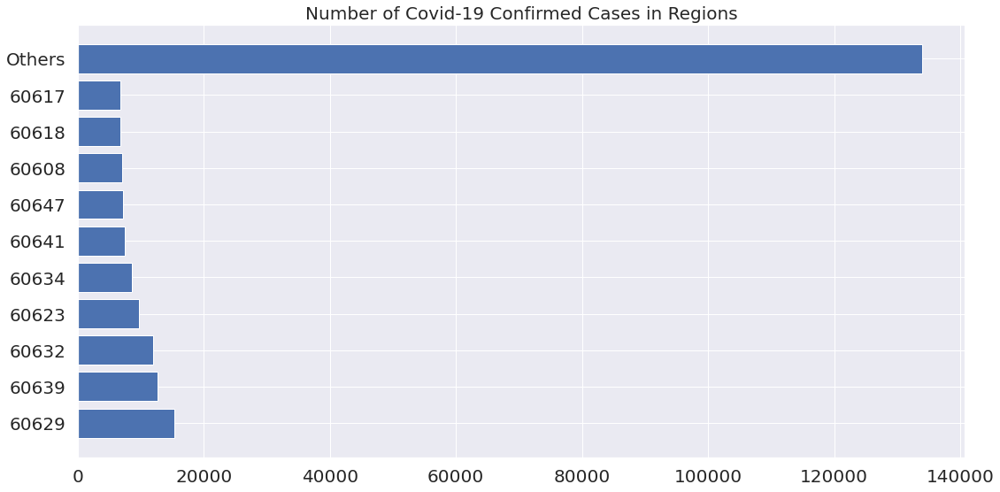

In [ ]:

plot_bar_graphs(visual_unique_region, visual_confirmed_cases, 'Number of Covid-19 Confirmed Cases in Regions')


In [ ]:

def plot_pie_charts(x, y, title):
    plt.rcParams['font.size'] = 15.0
    c = random.choices(list(mcolors.CSS4_COLORS.values()),k = len(unique_region))
    plt.figure(figsize=(10,10))
    plt.title(title, size=20)
    plt.pie(y, colors=c, labels=x, autopct='%1.0f%%')
    plt.legend(x, fontsize=10,loc='upper right')
    plt.show()



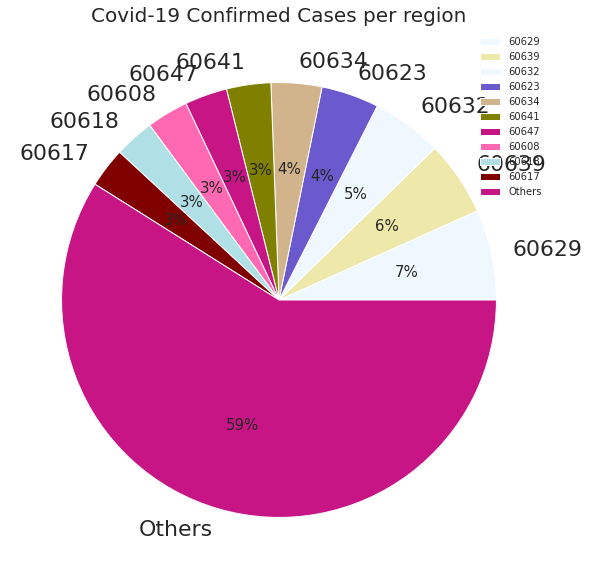

In [ ]:

plot_pie_charts(visual_unique_region, visual_confirmed_cases, 'Covid-19 Confirmed Cases per region')


INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should

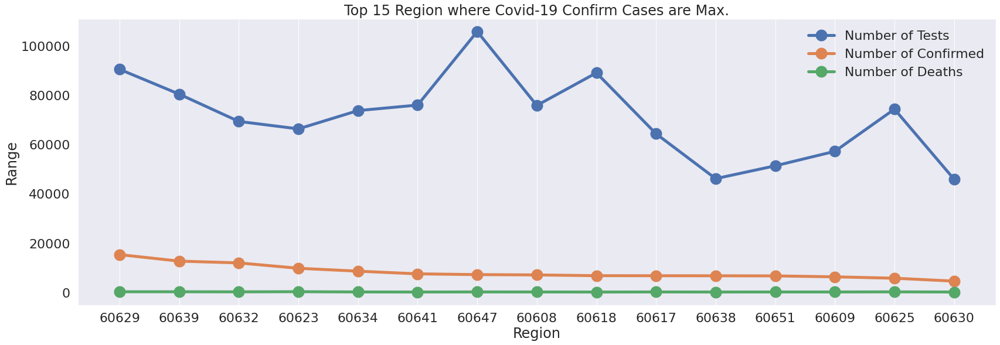

In [ ]:


plt.figure(figsize=(25, 9))

plt.xlabel("Region") 
plt.ylabel("Range") 

plt.plot(unique_region[:15],test_by_region[:15], label = 'Number of Tests',marker = 'o',ms = 20, mec = 'r',linewidth = '5')
plt.plot(unique_region[:15],confirmed_by_region[:15], label = 'Number of Confirmed',marker = 'o',ms = 20, mec = 'g',linewidth = '5')
plt.plot(unique_region[:15],death_by_region[:15], label = 'Number of Deaths',marker = 'o',ms = 20, mec = 'b',linewidth = '5')

# plt.plot(unique_region,population_by_region,label = 'Population')


plt.grid(axis = 'y')
plt.legend()
plt.title('Top 15 Region where Covid-19 Confirm Cases are Max.')

plt.show()




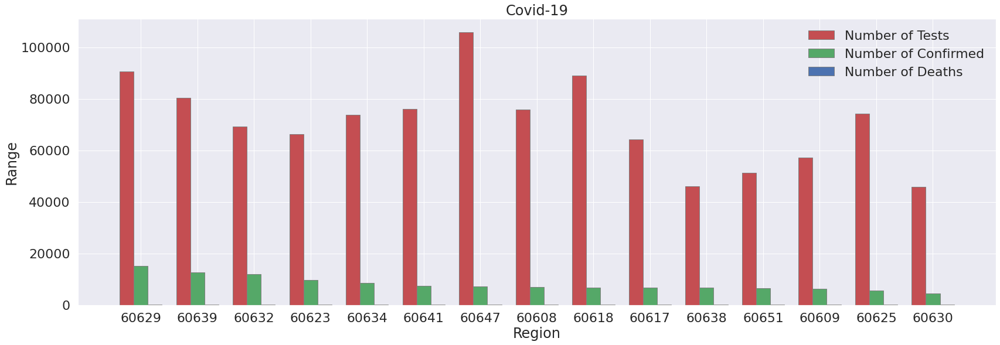

In [ ]:


plt.figure(figsize=(25, 9))

plt.xlabel("Region") 
plt.ylabel("Range") 

barWidth = 0.25

# Set position of bar on X axis 
br1 = np.arange(len(test_by_region[:15])) 
br2 = [x + barWidth for x in br1] 
br3 = [x + barWidth for x in br2] 

# Make the plot
plt.bar(br1,test_by_region[:15], color ='r', width = barWidth, 
        edgecolor ='grey', label = 'Number of Tests') 
plt.bar(br2, confirmed_by_region[:15], color ='g', width = barWidth, 
        edgecolor ='grey', label = 'Number of Confirmed') 
plt.bar(br3, death_by_region[:15], color ='b', width = barWidth, 
        edgecolor ='grey', label = 'Number of Deaths') 
 
# Adding Xticks 

plt.xticks([r + barWidth for r in range(len(unique_region[:15]))], unique_region[:15])
 
plt.legend()
plt.title("Covid-19")
plt.show()





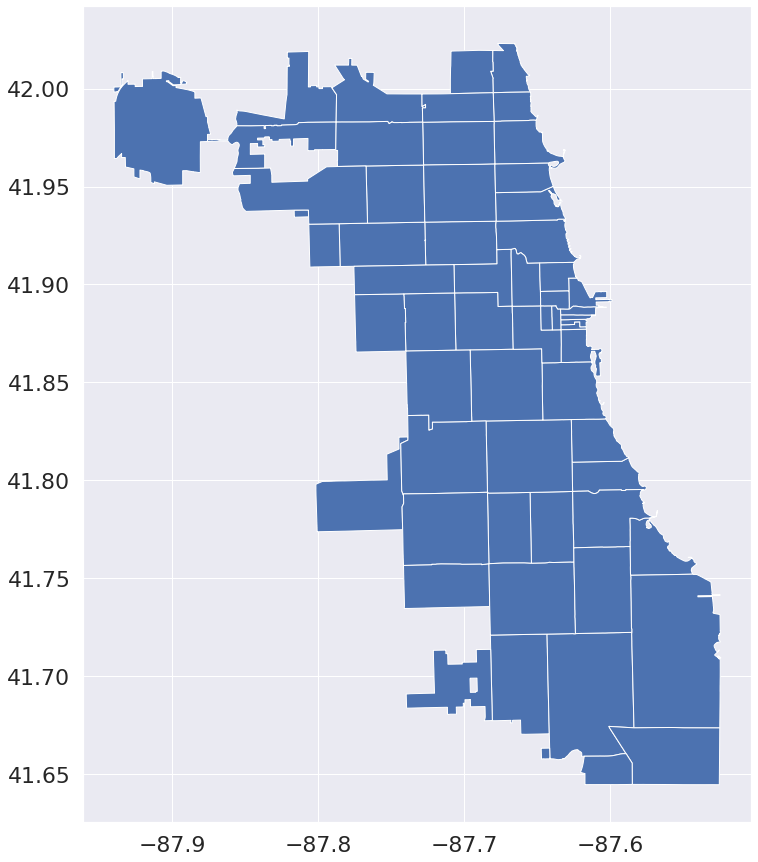

In [ ]:
plt.rcParams["figure.figsize"] = (80,15)
chi_zips = geopandas.read_file('/content/drive/MyDrive/Prashant/lab/PBL/Datasets/GeoShapeFile/geoshapefile.shp')
chi_zips.plot()

In [ ]:

cases.name = 'total_cases'


In [ ]:

# run only once if run again then there are overwriting the values.
chi_zips = chi_zips.join(cases, on='zip')
chi_zips


,objectid,shape_area,shape_len,zip,geometry,total_cases
0,33.0,1.060523e+08,42720.044406,60647,"POLYGON ((-87.67762 41.91776, -87.67761 41.917...",7172.0
1,34.0,1.274761e+08,48103.782721,60639,"POLYGON ((-87.72683 41.92265, -87.72693 41.922...",12653.0
2,35.0,4.506904e+07,27288.609612,60707,"POLYGON ((-87.78500 41.90915, -87.78531 41.909...",1944.0
3,36.0,7.085383e+07,42527.989679,60622,"POLYGON ((-87.66707 41.88885, -87.66707 41.888...",4068.0
4,37.0,9.903962e+07,47970.140153,60651,"POLYGON ((-87.70656 41.89555, -87.70672 41.895...",6653.0
...,...,...,...,...,...,...
56,57.0,1.552855e+08,53406.915617,60623,"POLYGON ((-87.69479 41.83008, -87.69486 41.830...",9746.0
57,58.0,2.111148e+08,58701.325375,60629,"POLYGON ((-87.68306 41.75786, -87.68306 41.757...",15287.0
58,59.0,2.116961e+08,58466.160298,60620,"POLYGON ((-87.62373 41.72167, -87.62388 41.721...",4297.0
59,60.0,1.254243e+08,52377.854541,60637,"POLYGON ((-87.57691 41.79511, -87.57700 41.795...",2710.0


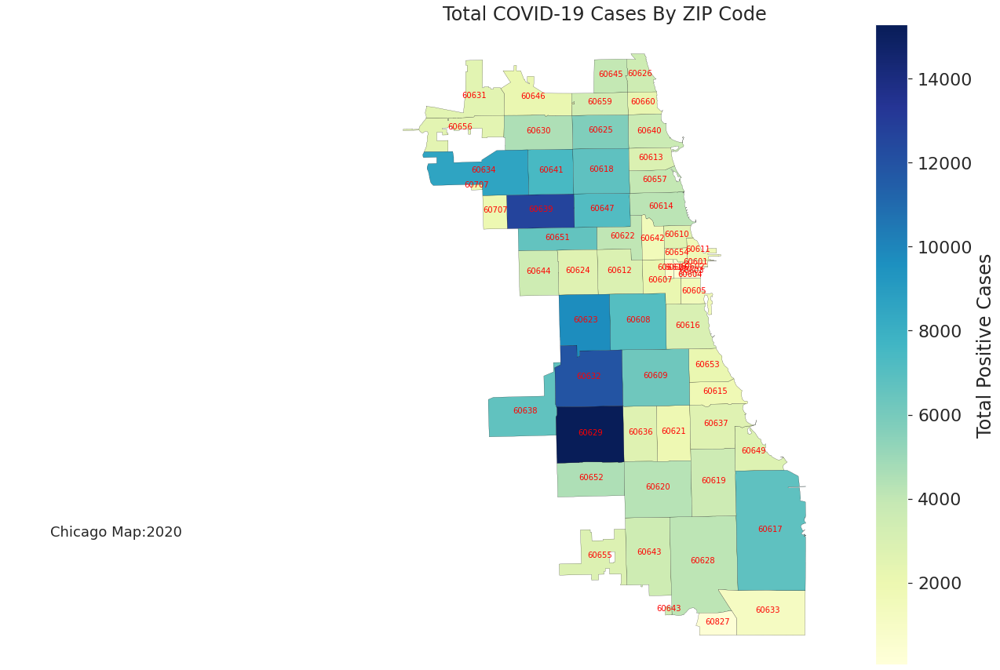

In [ ]:

fig, ax = plt.subplots(figsize=(20,15))
ax.axis('off')
ax.set_title('Total COVID-19 Cases By ZIP Code',
            fontdict={'fontsize': 24, 'fontweight':10})# plot the map
chi_zips.plot(ax=ax, column='total_cases',
            edgecolor='black', linewidth=.2,
            cmap='YlGnBu', legend=True,
            legend_kwds={'label': 'Total Positive Cases'});# source the data
ax.annotate('Chicago Map:2020' ,
            xy=(0.05, .2),  xycoords='figure fraction', 
            fontsize=18);

for _, row in chi_zips.iterrows():
    xy = row['geometry'].centroid.coords
    ax.annotate(row['zip'], xy=xy[0],
                 horizontalalignment='center',
                 color='red',fontsize=10)
    

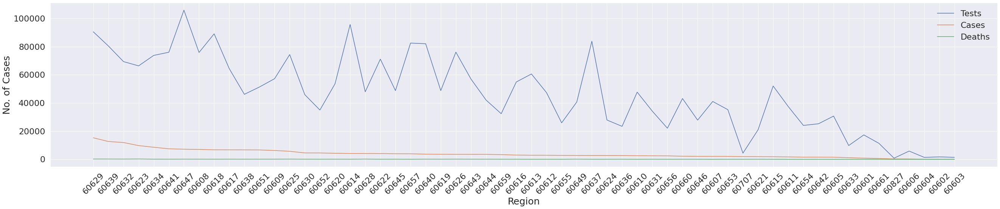

In [ ]:


plt.figure(figsize = (40,8))
plt.plot(range(region_df.shape[0]),region_df['Number of Tests'])
plt.plot(range(region_df.shape[0]),region_df['Number of Confirmed Cases'])
plt.plot(range(region_df.shape[0]),region_df['Number of Deaths'])
plt.xticks(range(0,region_df.shape[0],1),region_df['Region'],rotation=45)
plt.xlabel('Region',fontsize=25)
plt.ylabel('No. of Cases',fontsize=25)
plt.legend(['Tests','Cases','Deaths'])
plt.show()

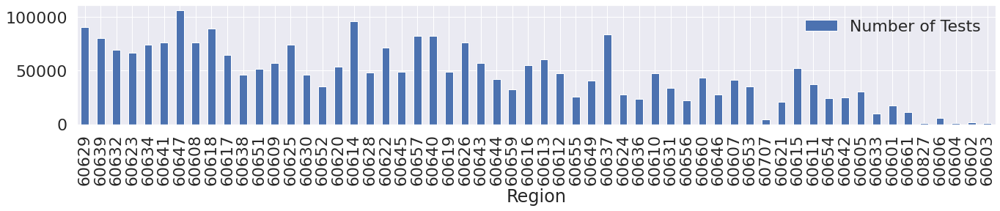

In [ ]:
plt.rcParams["figure.figsize"] = (20,3)

region_df.plot('Region','Number of Tests',kind='bar')

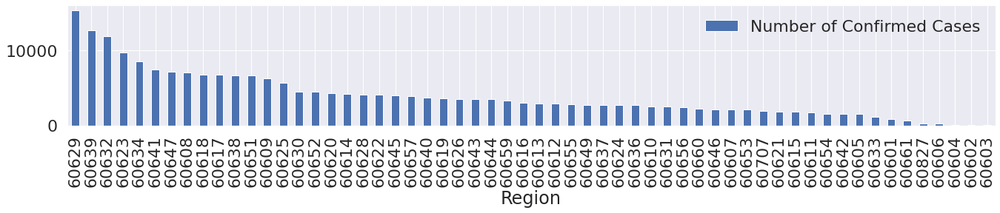

In [ ]:
plt.rcParams["figure.figsize"] = (20,3)

region_df.plot('Region','Number of Confirmed Cases',kind='bar')

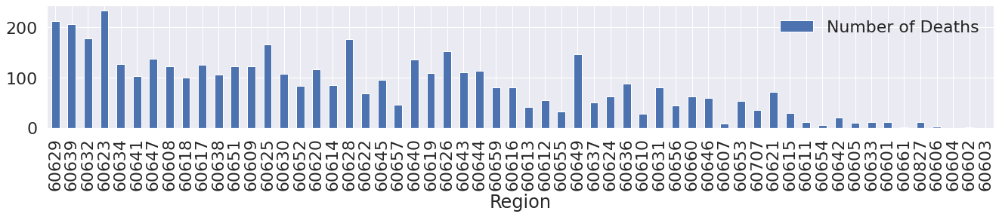

In [ ]:
plt.rcParams["figure.figsize"] = (20,3)

region_df.plot('Region','Number of Deaths',kind='bar')

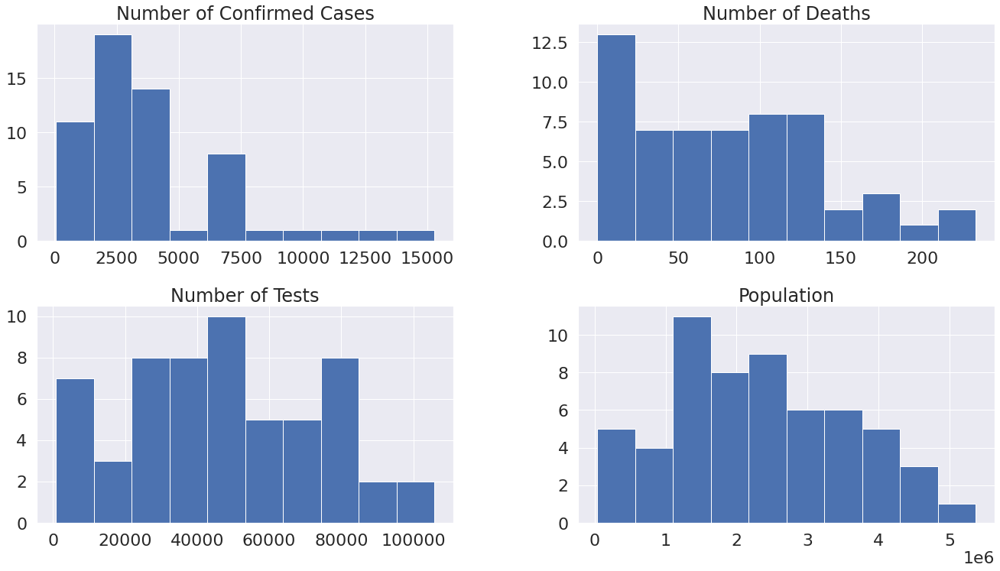

In [ ]:
region_df.hist(figsize=(20,12), layout=(2,2), sharex=False);

In [ ]:


# confirmed_cases_by_date,test_by_date and death_by_date

dates=df['Week End'].unique()
print('Region length:',len(unique_region))
print('Date length:',len(dates))

test_by_date=[]
confirmed_cases_by_date=[]
death_by_date=[]

for i in range (len(unique_region)):
  for j in range (len(dates)):
  
    test_by_date.append(int(df[(df['ZIP Code']== unique_region[i]) & (df['Week End']==dates[j])]['Tests - Weekly'].sum()))
    confirmed_cases_by_date.append(df[(df['ZIP Code']== unique_region[i]) & (df['Week End']==dates[j])]['Cases - Weekly'].sum())
    death_by_date.append(df[(df['ZIP Code']== unique_region[i]) & (df['Week End']==dates[j])]['Deaths - Weekly'].sum())
    



Region length: 58
Date length: 48


In [ ]:
# print(test_by_date[:48])
#Converting 1D Array to 2D Array like: test_by_date[region->59][date->48]
test_by_date=np.reshape(test_by_date,(-1, 48))
confirmed_cases_by_date=np.reshape(confirmed_cases_by_date,(-1,48))
death_by_date=np.reshape(death_by_date,(-1,48))

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should

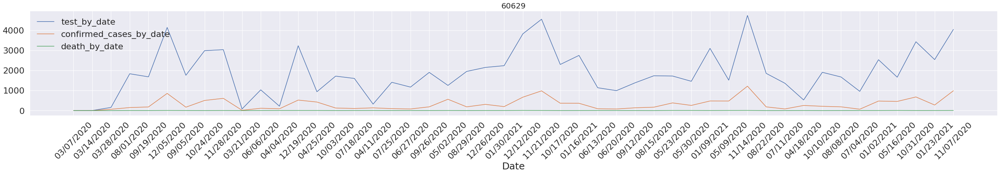

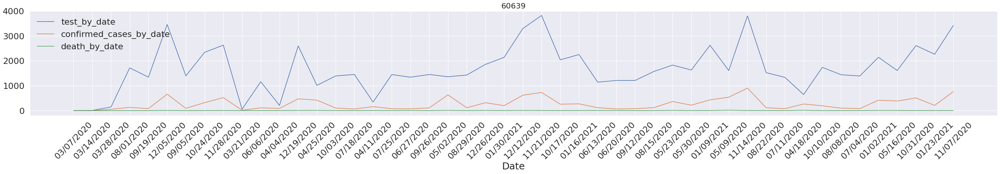

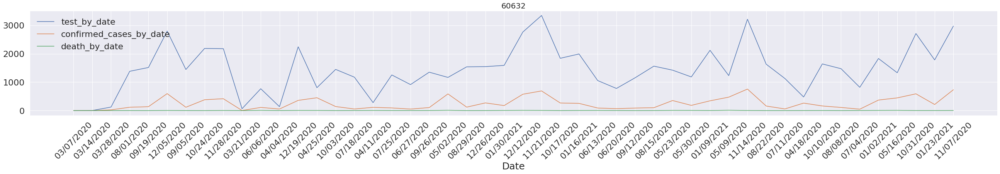

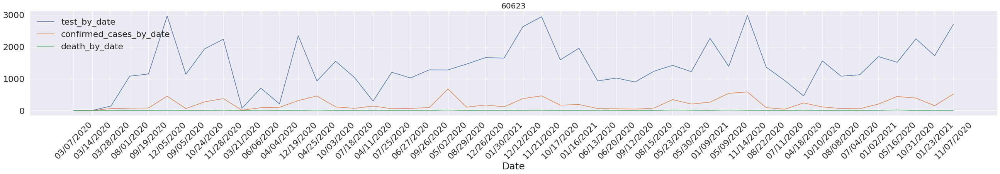

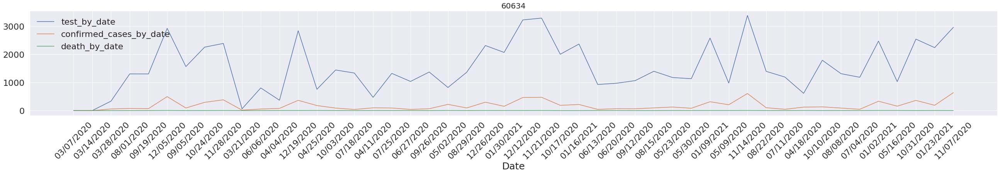

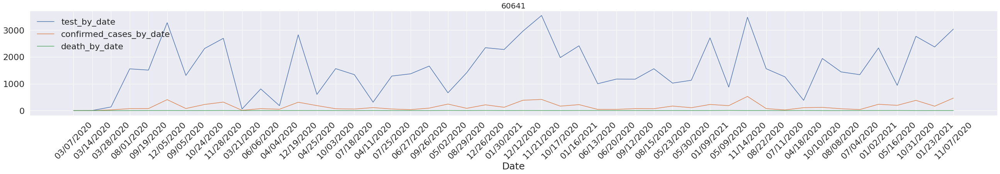

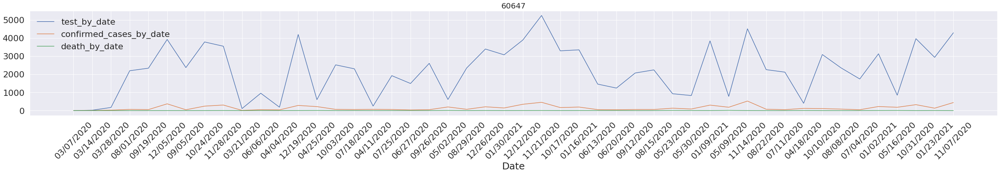

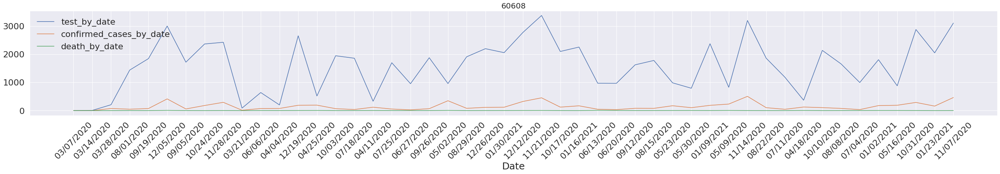

In [ ]:



for i in range((len(unique_region)-50)):
  plt.figure(figsize=(40,5))
  plt.title(unique_region[i], size=20) 
 
  plt.xticks(range(0,48,1),dates,rotation=45)
  plt.xlabel('Date',fontsize=25) 

  plt.plot(dates[:],test_by_date[i][:])
  plt.plot(dates[:],confirmed_cases_by_date[i][:])
  plt.plot(dates[:],death_by_date[i][:])
  plt.legend(['test_by_date','confirmed_cases_by_date','death_by_date']);

  

In [ ]:

def daily_increase(data):
    d = [] 
    for i in range(len(data)):
        if i == 0:
            d.append(data[0])
        else:
            d.append(abs(data[i]-data[i-1]))
    return d

In [ ]:

weekly_increase_cases=[]
weekly_increase_deaths=[]
weekly_increase_test=[]


for i in range(len(unique_region)):
  weekly_increase_cases.append(daily_increase(confirmed_cases_by_date[i]))
  weekly_increase_deaths.append(daily_increase(death_by_date[i]))
  weekly_increase_test.append(daily_increase(test_by_date[i]))


In [ ]:


t_cases=[]
t_deaths=[]
t_test=[]


days_since_03_07_2020 = np.array([i for i in range(len(dates))]).reshape(-1, 1)
for i in range(len(unique_region)):
  t_cases.append(np.array(confirmed_cases_by_date[i]).reshape(-1, 1))
  t_deaths.append(np.array(death_by_date[i]).reshape(-1, 1))
  t_test.append(np.array(test_by_date[i]).reshape(-1, 1))



In [ ]:
days_since_03_07_2020 


array([[ 0],
       [ 1],
       [ 2],
       [ 3],
       [ 4],
       [ 5],
       [ 6],
       [ 7],
       [ 8],
       [ 9],
       [10],
       [11],
       [12],
       [13],
       [14],
       [15],
       [16],
       [17],
       [18],
       [19],
       [20],
       [21],
       [22],
       [23],
       [24],
       [25],
       [26],
       [27],
       [28],
       [29],
       [30],
       [31],
       [32],
       [33],
       [34],
       [35],
       [36],
       [37],
       [38],
       [39],
       [40],
       [41],
       [42],
       [43],
       [44],
       [45],
       [46],
       [47]])

In [ ]:
len(t_cases)

58

In [ ]:
days_in_future = 20
future_forecast = np.array([i for i in range(len(dates)+days_in_future)]).reshape(-1, 1)
adjusted_dates = future_forecast[:-20]

In [ ]:
future_forecast

array([[ 0],
       [ 1],
       [ 2],
       [ 3],
       [ 4],
       [ 5],
       [ 6],
       [ 7],
       [ 8],
       [ 9],
       [10],
       [11],
       [12],
       [13],
       [14],
       [15],
       [16],
       [17],
       [18],
       [19],
       [20],
       [21],
       [22],
       [23],
       [24],
       [25],
       [26],
       [27],
       [28],
       [29],
       [30],
       [31],
       [32],
       [33],
       [34],
       [35],
       [36],
       [37],
       [38],
       [39],
       [40],
       [41],
       [42],
       [43],
       [44],
       [45],
       [46],
       [47],
       [48],
       [49],
       [50],
       [51],
       [52],
       [53],
       [54],
       [55],
       [56],
       [57],
       [58],
       [59],
       [60],
       [61],
       [62],
       [63],
       [64],
       [65],
       [66],
       [67]])

In [ ]:
adjusted_dates

array([[ 0],
       [ 1],
       [ 2],
       [ 3],
       [ 4],
       [ 5],
       [ 6],
       [ 7],
       [ 8],
       [ 9],
       [10],
       [11],
       [12],
       [13],
       [14],
       [15],
       [16],
       [17],
       [18],
       [19],
       [20],
       [21],
       [22],
       [23],
       [24],
       [25],
       [26],
       [27],
       [28],
       [29],
       [30],
       [31],
       [32],
       [33],
       [34],
       [35],
       [36],
       [37],
       [38],
       [39],
       [40],
       [41],
       [42],
       [43],
       [44],
       [45],
       [46],
       [47]])

In [ ]:
len(future_forecast)

68

In [ ]:
start = '03/07/2020'
start_date = datetime.datetime.strptime(start, '%m/%d/%Y')
future_forecast_dates = []
for i in range(len(future_forecast)):
    future_forecast_dates.append((start_date + datetime.timedelta(days=i)).strftime('%m/%d/%Y'))


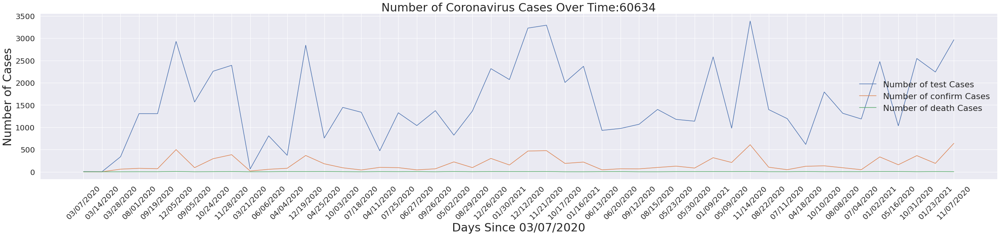

In [ ]:


adjusted_dates = adjusted_dates.reshape(1, -1)[0]
plt.figure(figsize=(40,8))

plt.xticks(range(0,48,1),dates,rotation=45)
plt.xlabel('Date',fontsize=25) 


plt.plot(adjusted_dates, t_test[4])
plt.plot(adjusted_dates, t_cases[4])
plt.plot(adjusted_dates, t_deaths[4])
#  plt.title(unique_region[i], size=20)
plt.title('Number of Coronavirus Cases Over Time:{}'.format(unique_region[4]),size=30)
plt.xlabel('Days Since 03/07/2020', size=30)
plt.ylabel('Number of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.legend(['Number of test Cases','Number of confirm Cases','Number of death Cases'])
plt.show()




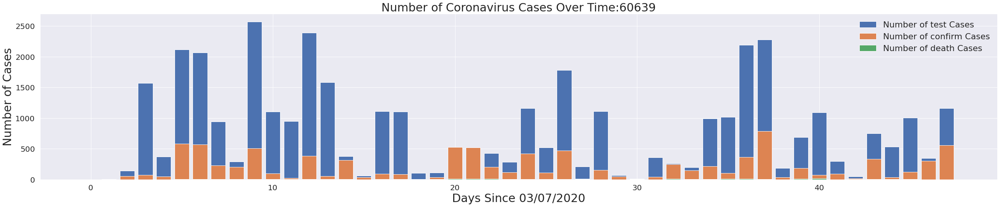

In [ ]:
adjusted_dates = adjusted_dates.reshape(1, -1)[0]
plt.figure(figsize=(40, 8))
plt.bar(adjusted_dates, weekly_increase_test[1])
plt.bar(adjusted_dates, weekly_increase_cases[1])
plt.bar(adjusted_dates, weekly_increase_deaths[1])
plt.title('Number of Coronavirus Cases Over Time:{}'.format(unique_region[1]),size=30)
plt.xlabel('Days Since 03/07/2020', size=30)
plt.ylabel('Number of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.legend(['Number of test Cases','Number of confirm Cases','Number of death Cases'])
plt.show()


<center>
<h1>
<hr/>
<b>
ML Algorithms Implementation on Covid19 Data
</b>
<hr/>
</h1>
</center>

In [ ]:

which_region=4


<hr>
<center>
<h4>
<b>
Number of Test Prediction
</b>
</h4>
<hr>
</center>

In [ ]:

X_train_test,X_test_test, y_train_test, y_test_test = train_test_split(days_since_03_07_2020,t_test[which_region], test_size=0.3,shuffle= True,random_state=6)


In [ ]:

print("X_train_test:",X_train_test.shape)
print("X_test_test:",X_test_test.shape)
print("y_train_test:",y_train_test.shape)
print('y_test_test:',y_test_test.shape)


X_train_test: (33, 1)
X_test_test: (15, 1)
y_train_test: (33, 1)
y_test_test: (15, 1)


<hr>
<center>
<h4>
<b>
Scatter Plot
</b>
</h4>
<hr>
</center>

The linear model is: Y = 1077.5 + 19.556X


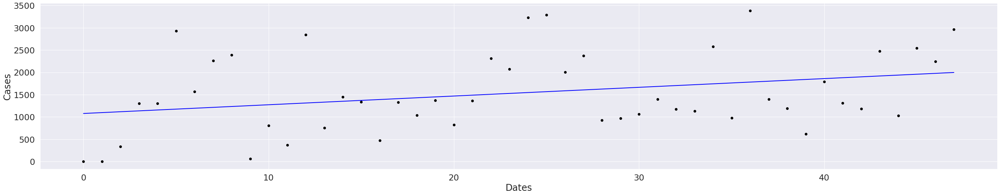

In [ ]:


X=days_since_03_07_2020
y=t_test[which_region]

reg = LinearRegression()
reg.fit(X, y)
print("The linear model is: Y = {:.5} + {:.5}X".format(reg.intercept_[0], reg.coef_[0][0]))
predictions = reg.predict(X)

actvspred = pd.DataFrame({'Actual': y.flatten(), 'Predicted': predictions.flatten()})

plt.figure(figsize=(40, 8))
plt.scatter(
    X,
    y,
    c='black'
)
plt.plot(
    X,
    predictions,
    c='blue',
    linewidth=2
)

plt.xlabel("Dates")
plt.ylabel("Cases")
plt.show()


<hr>
<center>
<h4>
<b>
Building A Linear Model
</b>
</h4>
<hr>
</center>

In [ ]:

# Linear regression for test 
test_linear_model = LinearRegression()
test_linear_model.fit(X_train_test, y_train_test)

test_linear_pred = test_linear_model.predict(X_test_test)

print('\n')

print('MAE for Linear Regression :', mean_absolute_error(y_test_test,test_linear_pred))
print('MSE for Linear Regression :', mean_squared_error(y_test_test,test_linear_pred))
print('RMSE for Linear Regression : ', np.sqrt(mean_squared_error(y_test_test,test_linear_pred)))

print('\n')




MAE for Linear Regression : 613.3388744144992
MSE for Linear Regression : 598026.5063011638
RMSE for Linear Regression :  773.321735308897




In [ ]:

# future forecast value for 20 days
test_future_forecast_linear_pred = test_linear_model.predict(future_forecast)


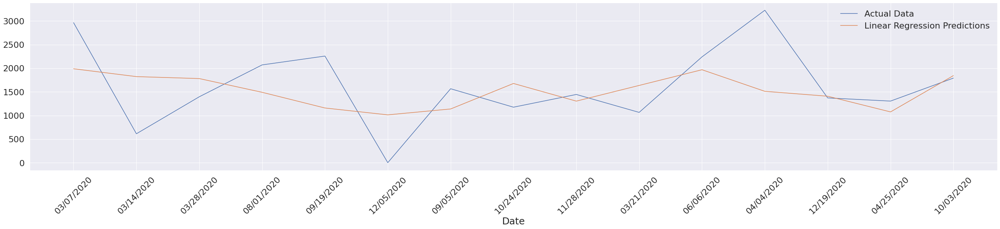

In [ ]:

plt.figure(figsize=(40,8)) 

plt.xticks(range(0,15,1),dates,rotation=45)
plt.xlabel('Date',fontsize=25)

plt.plot(y_test_test)
plt.plot(test_linear_pred)

plt.legend(['Actual Data', 'Linear Regression Predictions']);


<hr>
<center>
<h4>
<b>
Building A Polynomial Model
</b>
</h4>
<hr>
</center>

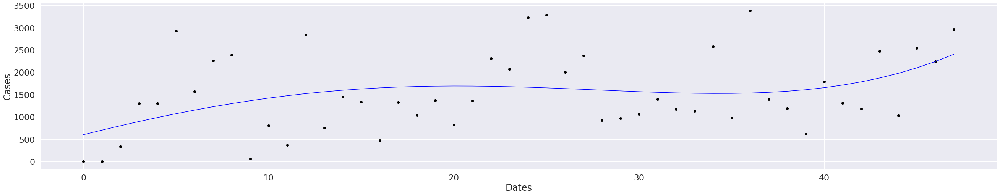

In [ ]:

poly = PolynomialFeatures(degree =4) 
X_poly = poly.fit_transform(X) 
  
poly.fit(X_poly, y) 
lin2 = LinearRegression() 
lin2.fit(X_poly, y) 
pred = lin2.predict(X_poly)
new_X, new_y = zip(*sorted(zip(X, pred)))

plt.figure(figsize=(40, 8))
plt.scatter(
    X,
    y,
    c='black'
)
plt.plot(
    new_X, new_y,
    c='blue'
)
plt.xlabel("Dates")
plt.ylabel("Cases")
plt.show()




In [ ]:

from sklearn.preprocessing import PolynomialFeatures
from sklearn import linear_model

# transform data for polynomial regression
poly = PolynomialFeatures(degree=3)
poly_X_train_test = poly.fit_transform(X_train_test)
poly_X_test_test = poly.fit_transform(X_test_test)
poly_future_forecast_test = poly.fit_transform(future_forecast)

test_poly_model = linear_model.LinearRegression()
test_poly_model.fit(poly_X_train_test, y_train_test)

test_poly_pred=test_poly_model.predict(poly_X_test_test)

print('\n')

print('MAE for Poly Regression :', mean_absolute_error(y_test_test,test_poly_pred))
print('MSE for Poly Regression :',mean_squared_error(y_test_test,test_poly_pred))
print('RMSE for Poly Regression : ',np.sqrt(mean_squared_error(y_test_test,test_poly_pred)))

print('\n')




MAE for Poly Regression : 622.2233280813272
MSE for Poly Regression : 582573.2680532637
RMSE for Poly Regression :  763.264874112037




In [ ]:

test_future_forecast_poly_pred =test_poly_model.predict(poly_future_forecast_test)


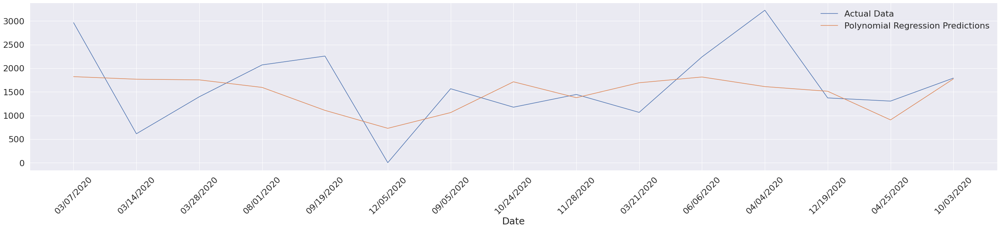

In [ ]:

plt.figure(figsize=(40,8)) 
plt.xticks(range(0,48,1),dates,rotation=45)
plt.xlabel('Date',fontsize=25)

plt.plot(y_test_test)
plt.plot(test_poly_pred)
plt.legend(['Actual Data', 'Polynomial Regression Predictions']);


<hr>
<center>
<h4>
<b>
Building A SVM Model
</b>
</h4>
<hr>
</center>

In [ ]:

# svm_confirmed = svm_search.best_estimator_
test_svm_model = SVR(shrinking=True, kernel='poly',gamma=0.01, epsilon=1,degree=5, C=0.1)
test_svm_model.fit(X_train_test, y_train_test)
test_svm_pred = test_svm_model.predict(X_test_test);

print('\n')

print('MAE for SVM :', mean_absolute_error(y_test_test,test_svm_pred))
print('MSE for SVM :',mean_squared_error(y_test_test,test_svm_pred))
print('RMSE for SVM : ',np.sqrt(mean_squared_error(y_test_test,test_svm_pred)))

print('\n')




MAE for SVM : 697.0748331125626
MSE for SVM : 799562.6472312689
RMSE for SVM :  894.182669945727




/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [ ]:

test_future_forecast_svm_pred=test_svm_model.predict(future_forecast);


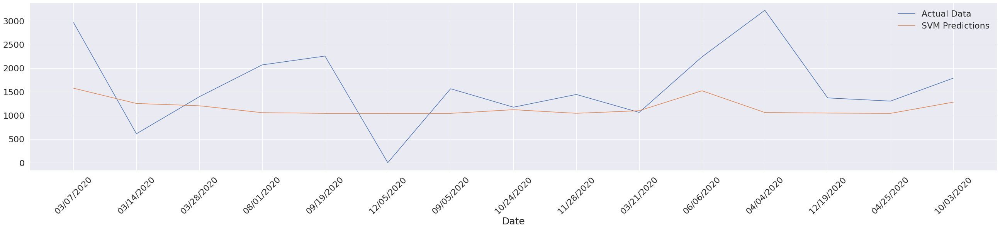

In [ ]:

plt.figure(figsize=(40,8)) 
plt.xticks(range(0,15,1),dates,rotation=45)
plt.xlabel('Date',fontsize=25)

plt.plot(y_test_test)
plt.plot(test_svm_pred)
plt.legend(['Actual Data', 'SVM Predictions']);


In [ ]:

def plot_predictions(x, y, pred, algo_name, color,region):
    plt.figure(figsize=(40, 8))
    plt.plot(x, y)

    plt.xticks(range(0,48,1),dates,rotation=45)
    plt.xlabel('Date',fontsize=25)


    plt.plot(future_forecast, pred, linestyle='dashed', color=color)
    plt.title('Number of Coronavirus Cases Over Time:{}'.format(region), size=30)
    plt.xlabel('Days Since 03/07/2020', size=30)
    plt.ylabel('Number of Cases', size=30)
    plt.legend(['Confirmed Cases', algo_name], prop={'size': 20})
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()
    

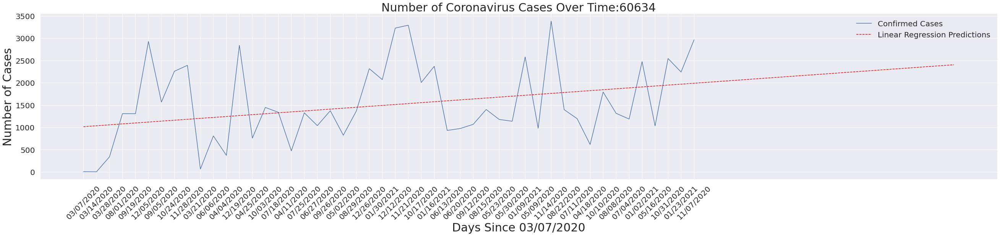

In [ ]:
plot_predictions(adjusted_dates, t_test[which_region], test_future_forecast_linear_pred, 'Linear Regression Predictions', 'red',unique_region[which_region])

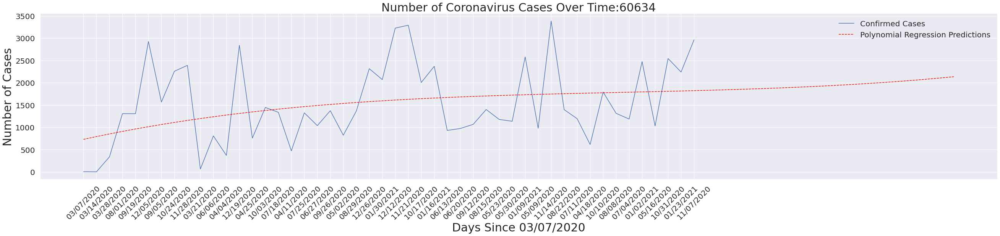

In [ ]:

plot_predictions(adjusted_dates, t_test[which_region], test_future_forecast_poly_pred, 'Polynomial Regression Predictions', 'red',unique_region[which_region])



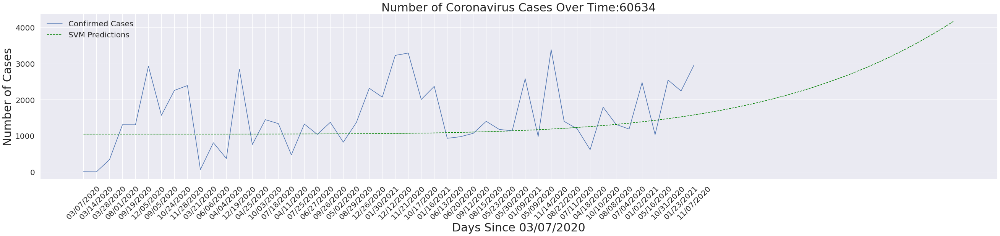

In [ ]:

plot_predictions(adjusted_dates, t_test[which_region],test_future_forecast_svm_pred, 'SVM Predictions', 'green',unique_region[which_region])


In [ ]:

# Future predictions 
# linear_pred = linear_pred.reshape(1,-1)[0]
test_pred_df = pd.DataFrame({'Date': future_forecast_dates[-20:],'RL test Cases Prediction': np.round(test_future_forecast_linear_pred[-20:].ravel()),'Poly test Cases Prediction': np.round(test_future_forecast_poly_pred[-20:].ravel()),'SVM test Cases prediction': np.round(test_future_forecast_svm_pred[-20:].ravel())})
test_pred_df


,Date,RL test Cases Prediction,Poly test Cases Prediction,SVM test Cases prediction
0,04/24/2020,2010.0,1831.0,1637.0
1,04/25/2020,2031.0,1839.0,1702.0
2,04/26/2020,2052.0,1847.0,1771.0
3,04/27/2020,2073.0,1857.0,1847.0
4,04/28/2020,2093.0,1867.0,1928.0
5,04/29/2020,2114.0,1877.0,2016.0
6,04/30/2020,2135.0,1889.0,2112.0
7,05/01/2020,2156.0,1901.0,2214.0
8,05/02/2020,2176.0,1914.0,2324.0
9,05/03/2020,2197.0,1928.0,2442.0


In [ ]:

total_test_future_forecast_linear_pred=test_future_forecast_linear_pred[-20:].ravel().sum()
total_test_future_forecast_linear_pred


44147.16055183018

In [ ]:

total_test_future_forecast_poly_pred=test_future_forecast_poly_pred[-20:].ravel().sum()
total_test_future_forecast_poly_pred


39057.52457310451

In [ ]:

total_test_future_forecast_svm_pred=test_future_forecast_svm_pred[-20:].ravel().sum()
total_test_future_forecast_svm_pred


53049.797980514166

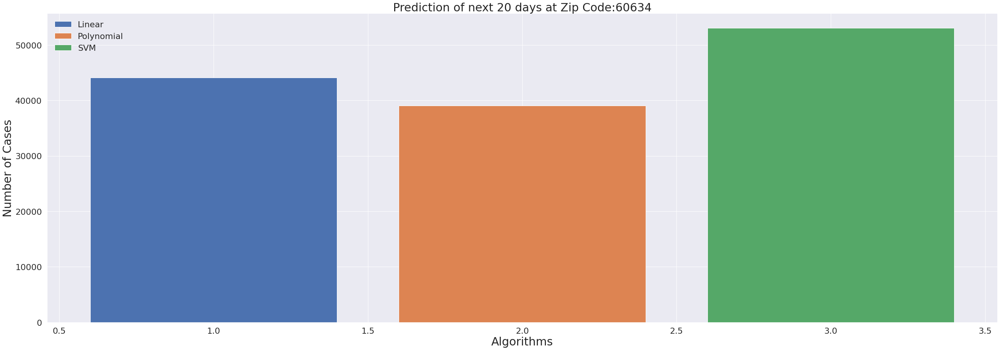

In [ ]:

plt.figure(figsize=(40,15))

plt.bar(1,total_test_future_forecast_linear_pred)
plt.bar(2,total_test_future_forecast_poly_pred)
plt.bar(3,total_test_future_forecast_svm_pred)

plt.title('Prediction of next 20 days at Zip Code:{}'.format(unique_region[which_region]),size=30)
plt.xlabel('Algorithms', size=30)
plt.ylabel('Number of Cases', size=30)
plt.legend(['Linear','Polynomial','SVM'])
plt.show()


<hr>
<center>
<h4>
<b>
Prophet
</b>
</h4>
<hr>
</center>

In [ ]:

a=t_test[which_region] #Target
b=a.ravel().astype(int)
b[b<1]=1
b


array([   4,    2,  337, 1306, 1305, 2927, 1567, 2258, 2391,   64,  807,
        370, 2842,  758, 1446, 1337,  472, 1325, 1038, 1373,  823, 1364,
       2316, 2071, 3227, 3292, 2006, 2369,  930,  973, 1067, 1400, 1177,
       1136, 2580,  980, 3385, 1397, 1194,  615, 1792, 1314, 1186, 2474,
       1032, 2544, 2241, 2964])

In [ ]:

from fbprophet import Prophet
df_prophet= pd.DataFrame({'ds':dates, 'y':b})
df_m1=df_prophet.copy()


In [ ]:

b=158
df_m1['y'] = np.log(df_m1['y'])


In [ ]:

m1_plain = Prophet()
m1_plain.fit(df_m1)
future = m1_plain.make_future_dataframe(periods=20)
forecast_m1 = m1_plain.predict(future)


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


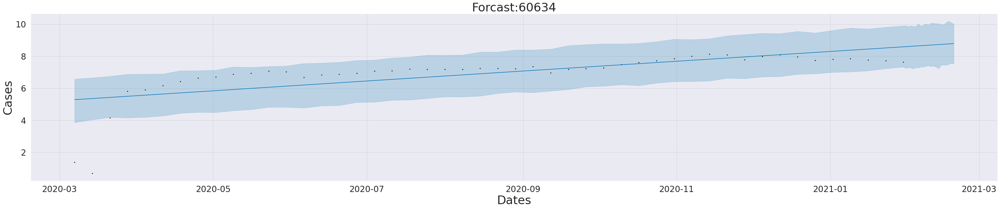

In [ ]:

from fbprophet.plot import plot,plot_components
fig=plot(m1_plain,forecast_m1, figsize=(40,8))
ax = fig.gca()
ax.set_title("Forcast:{}".format(unique_region[which_region]), size=34)
ax.set_xlabel("Dates", size=34)
ax.set_ylabel("Cases", size=34)
ax.tick_params(axis="x", labelsize=24)
ax.tick_params(axis="y", labelsize=24)


In [ ]:

# First, let's get some useful variables: "y" for the actual value and "n" for the number of observations.
y = df_prophet['y'].to_frame()
y.index = df_prophet['ds']
n = np.int(y.count())


In [ ]:

# The forecast is 'log transformed', so we need to 'inverse' it back by using the exp
forecast_m1_exp = np.exp(forecast_m1[['yhat','yhat_lower','yhat_upper']])
forecast_m1_exp.index = forecast_m1['ds']


In [ ]:

# Now let's calculate the MAPE for m1
error = forecast_m1_exp['yhat'] - y['y']
MAPE_m1 = ((error/y['y']).abs().sum()/n *100)
round(MAPE_m1,2)


362.13

<hr>
<center>
<h4>
<b>
Confirm Cases Prediction
</b>
</h4>
<hr>
</center>

In [ ]:

X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(days_since_03_07_2020,t_cases[which_region], test_size=0.3, shuffle= True,random_state=4)


In [ ]:
print("X_train_confirmed:",X_train_confirmed.shape)
print("X_test_confirmed:",X_test_confirmed.shape)
print("y_train_confirmed:",y_train_confirmed.shape)
print('y_test_confirmed:',y_test_confirmed.shape)

X_train_confirmed: (33, 1)
X_test_confirmed: (15, 1)
y_train_confirmed: (33, 1)
y_test_confirmed: (15, 1)


<hr/>
<center>
<h4>
<b>
Scatter Plot
</b>
</h4>
<hr>
</center>

The linear model is: Y = 112.15 + 2.8252X


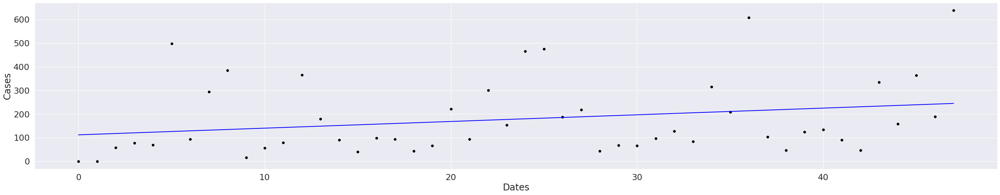

In [ ]:


X=days_since_03_07_2020
y=t_cases[which_region]

reg = LinearRegression()
reg.fit(X, y)
print("The linear model is: Y = {:.5} + {:.5}X".format(reg.intercept_[0], reg.coef_[0][0]))
predictions = reg.predict(X)

actvspred = pd.DataFrame({'Actual': y.flatten(), 'Predicted': predictions.flatten()})

plt.figure(figsize=(40, 8))
plt.scatter(
    X,
    y,
    c='black'
)
plt.plot(
    X,
    predictions,
    c='blue',
    linewidth=2
)

plt.xlabel("Dates")
plt.ylabel("Cases")
plt.show()


<hr>
<center>
<h4>
<b>
Building A Linear Model
</b>
</h4>
<hr>
</center>

In [ ]:

# Linear regression for test 
confirmed_linear_model = LinearRegression()
confirmed_linear_model.fit(X_train_confirmed, y_train_confirmed)

confirmed_linear_pred = confirmed_linear_model.predict(X_test_confirmed)

print('\n')

print('MAE for Linear Regression :', mean_absolute_error(y_test_confirmed,confirmed_linear_pred))
print('MSE for Linear Regression :', mean_squared_error(y_test_confirmed,confirmed_linear_pred))
print('RMSE for Linear Regression : ', np.sqrt(mean_squared_error(y_test_confirmed,confirmed_linear_pred)))

print('\n')




MAE for Linear Regression : 137.66041609519107
MSE for Linear Regression : 29083.20609629572
RMSE for Linear Regression :  170.53799018487265




In [ ]:

# future forecast value for 20 days
confirmed_future_forecast_linear_pred = confirmed_linear_model.predict(future_forecast)


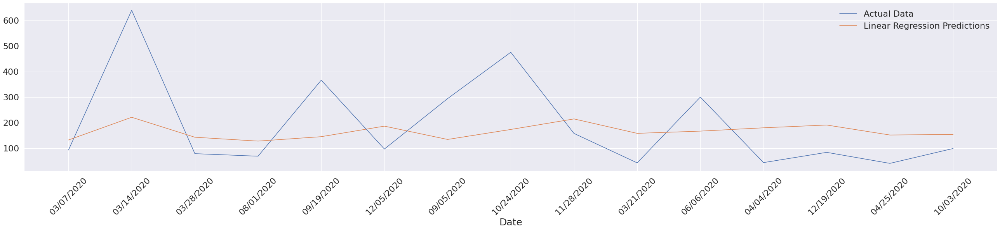

In [ ]:

plt.figure(figsize=(40,8)) 

plt.xticks(range(0,15,1),dates,rotation=45)
plt.xlabel('Date',fontsize=25)

plt.plot(y_test_confirmed)
plt.plot(confirmed_linear_pred)

plt.legend(['Actual Data', 'Linear Regression Predictions']);


<hr>
<center>
<h4>
<b>
Building A Polynomial Model
</b>
</h4>
<hr>
</center>

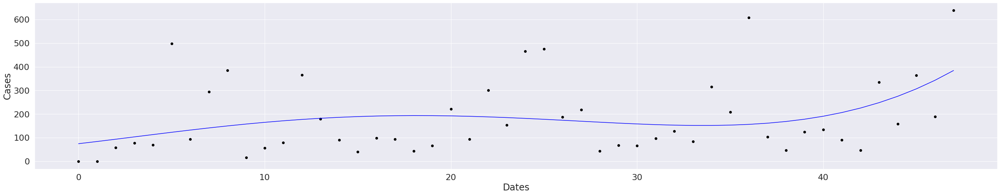

In [ ]:

poly = PolynomialFeatures(degree =4) 
X_poly = poly.fit_transform(X) 
  
poly.fit(X_poly, y) 
lin2 = LinearRegression() 
lin2.fit(X_poly, y) 
pred = lin2.predict(X_poly)
new_X, new_y = zip(*sorted(zip(X, pred)))

plt.figure(figsize=(40, 8))
plt.scatter(
    X,
    y,
    c='black'
)
plt.plot(
    new_X, new_y,
    c='blue'
)
plt.xlabel("Dates")
plt.ylabel("Cases")
plt.show()




In [ ]:

from sklearn.preprocessing import PolynomialFeatures
from sklearn import linear_model

# transform data for polynomial regression
poly = PolynomialFeatures(degree=3)
poly_X_train_confirmed = poly.fit_transform(X_train_confirmed)
poly_X_test_confirmed = poly.fit_transform(X_test_confirmed)
poly_future_forecast_confirmed = poly.fit_transform(future_forecast)

confirmed_poly_model = linear_model.LinearRegression()
confirmed_poly_model.fit(poly_X_train_confirmed, y_train_confirmed)

confirmed_poly_pred=confirmed_poly_model.predict(poly_X_test_confirmed)

print('\n')

print('MAE for Poly Regression :', mean_absolute_error(y_test_confirmed,confirmed_poly_pred))
print('MSE for Poly Regression :',mean_squared_error(y_test_confirmed,confirmed_poly_pred))
print('RMSE for Poly Regression : ',np.sqrt(mean_squared_error(y_test_confirmed,confirmed_poly_pred)))

print('\n')




MAE for Poly Regression : 137.40519333065228
MSE for Poly Regression : 27097.373539626293
RMSE for Poly Regression :  164.61279883297743




In [ ]:
confirmed_future_forecast_poly_pred =confirmed_poly_model.predict(poly_future_forecast_confirmed)

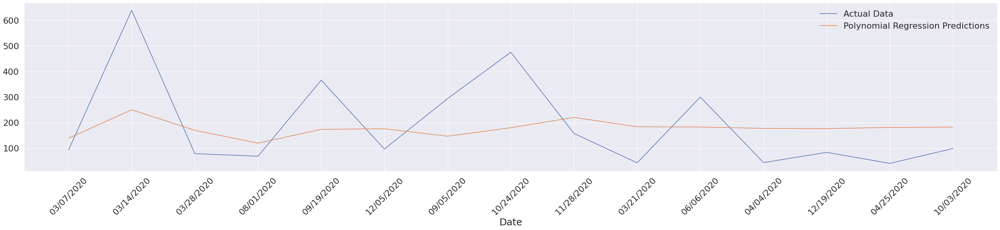

In [ ]:

plt.figure(figsize=(40,8)) 
plt.xticks(range(0,48,1),dates,rotation=45)
plt.xlabel('Date',fontsize=25)

plt.plot(y_test_confirmed)
plt.plot(confirmed_poly_pred)
plt.legend(['Actual Data', 'Polynomial Regression Predictions']);


<hr>
<center>
<h4>
<b>
Building A SVM Model
</b>
</h4>
<hr>
</center>

In [ ]:

# svm_confirmed = svm_search.best_estimator_
confirmed_svm_model = SVR(shrinking=True, kernel='poly',gamma=0.01, epsilon=1,degree=5, C=0.1)
confirmed_svm_model.fit(X_train_confirmed, y_train_confirmed)
confirmed_svm_pred = confirmed_svm_model.predict(X_test_confirmed);

print('\n')

print('MAE for SVM :', mean_absolute_error(y_test_confirmed,confirmed_svm_pred))
print('MSE for SVM :',mean_squared_error(y_test_confirmed,confirmed_svm_pred))
print('RMSE for SVM : ',np.sqrt(mean_squared_error(y_test_confirmed,confirmed_svm_pred)))

print('\n')




MAE for SVM : 116.36175390590138
MSE for SVM : 33755.8122790072
RMSE for SVM :  183.72754904751545




/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [ ]:

confirmed_future_forecast_svm_pred=confirmed_svm_model.predict(future_forecast);


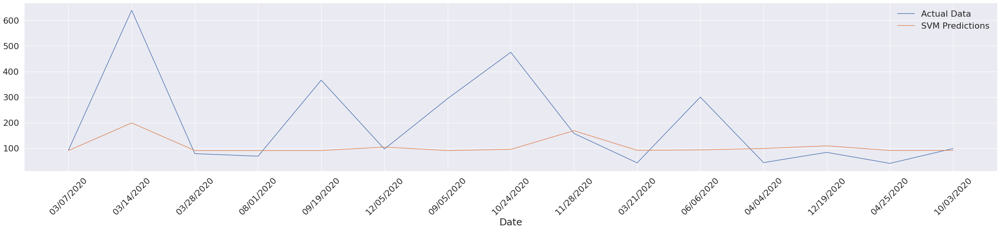

In [ ]:

plt.figure(figsize=(40,8)) 
plt.xticks(range(0,15,1),dates,rotation=45)
plt.xlabel('Date',fontsize=25)

plt.plot(y_test_confirmed)
plt.plot(confirmed_svm_pred)
plt.legend(['Actual Data', 'SVM Predictions']);


In [ ]:

def plot_predictions(x, y, pred, algo_name, color,region):
    plt.figure(figsize=(40, 8))
    plt.plot(x, y)

    plt.xticks(range(0,48,1),dates,rotation=45)
    plt.xlabel('Date',fontsize=25)


    plt.plot(future_forecast, pred, linestyle='dashed', color=color)
    plt.title('Number of Coronavirus Cases Over Time:{}'.format(region), size=30)
    plt.xlabel('Days Since 03/07/2020', size=30)
    plt.ylabel('Number of Cases', size=30)
    plt.legend(['Confirmed Cases', algo_name], prop={'size': 20})
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()
    

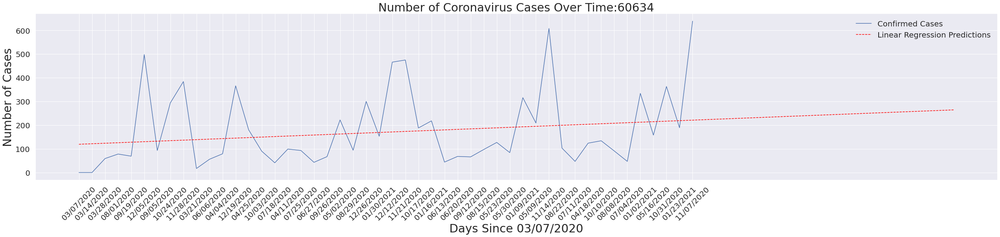

In [ ]:

plot_predictions(adjusted_dates, t_cases[which_region], confirmed_future_forecast_linear_pred, 'Linear Regression Predictions', 'red',unique_region[which_region])


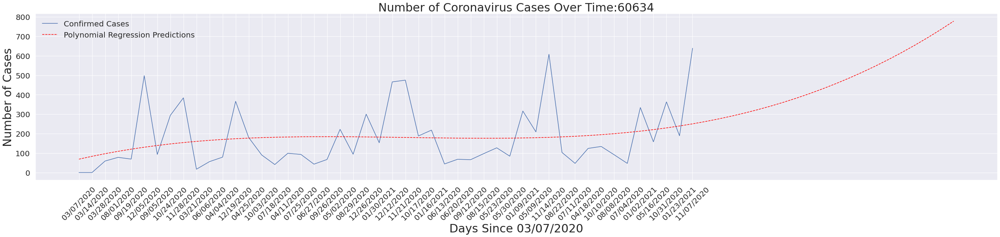

In [ ]:

plot_predictions(adjusted_dates, t_cases[which_region], confirmed_future_forecast_poly_pred ,'Polynomial Regression Predictions', 'red',unique_region[which_region])



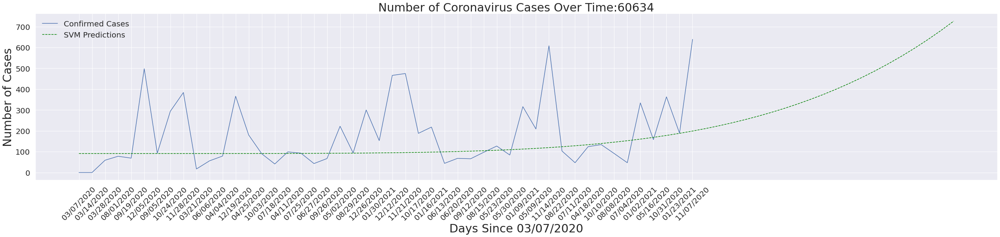

In [ ]:

plot_predictions(adjusted_dates, t_cases[which_region],confirmed_future_forecast_svm_pred, 'SVM Predictions', 'green',unique_region[which_region])


In [ ]:

# Future predictions 
# linear_pred = linear_pred.reshape(1,-1)[0]
confirmed_pred_df = pd.DataFrame({'Date': future_forecast_dates[-20:],'RL confirmed Cases Prediction': np.round(confirmed_future_forecast_linear_pred[-20:].ravel()),'Poly confirmed Cases Prediction': np.round(confirmed_future_forecast_poly_pred[-20:].ravel()),'SVM confirmed Cases prediction': np.round(confirmed_future_forecast_svm_pred[-20:].ravel())})
confirmed_pred_df


,Date,RL confirmed Cases Prediction,Poly confirmed Cases Prediction,SVM confirmed Cases prediction
0,04/24/2020,223.0,262.0,211.0
1,04/25/2020,225.0,276.0,224.0
2,04/26/2020,228.0,290.0,238.0
3,04/27/2020,230.0,306.0,253.0
4,04/28/2020,232.0,323.0,270.0
5,04/29/2020,234.0,342.0,288.0
6,04/30/2020,236.0,362.0,307.0
7,05/01/2020,238.0,383.0,328.0
8,05/02/2020,241.0,407.0,350.0
9,05/03/2020,243.0,431.0,374.0


In [ ]:

confirmed_total_future_forecast_linear_pred=confirmed_future_forecast_linear_pred[-20:].ravel().sum()
confirmed_total_future_forecast_linear_pred


4876.835168150979

In [ ]:

confirmed_total_future_forecast_poly_pred=confirmed_future_forecast_poly_pred[-20:].ravel().sum()
confirmed_total_future_forecast_poly_pred


9446.532919625966

In [ ]:

confirmed_total_future_forecast_svm_pred=confirmed_future_forecast_svm_pred[-20:].ravel().sum()
confirmed_total_future_forecast_svm_pred


8336.258392663844

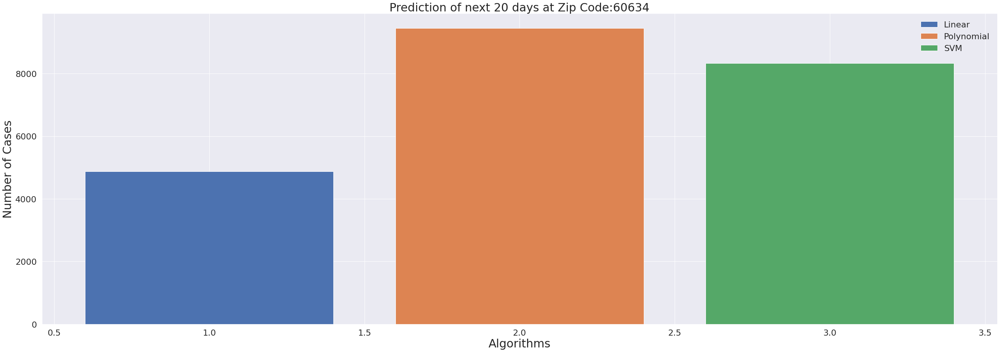

In [ ]:

plt.figure(figsize=(40,15))

plt.bar(1,confirmed_total_future_forecast_linear_pred)
plt.bar(2,confirmed_total_future_forecast_poly_pred)
plt.bar(3,confirmed_total_future_forecast_svm_pred)

plt.title('Prediction of next 20 days at Zip Code:{}'.format(unique_region[which_region]),size=30)
plt.xlabel('Algorithms', size=30)
plt.ylabel('Number of Cases', size=30)
plt.legend(['Linear','Polynomial','SVM'])
plt.show()



<hr>
<center>
<h4>
<b>
Prophet
</b>
</h4>
<hr>
</center>


In [ ]:


a=t_cases[which_region] #Target
b=a.ravel().astype(int)
b[b<1]=1
b

array([  1,   1,  59,  78,  69, 498,  93, 294, 384,  17,  56,  79, 366,
       180,  90,  41,  99,  93,  43,  67, 222,  94, 300, 153, 466, 475,
       188, 218,  44,  68,  66,  97, 127,  84, 316, 209, 608, 103,  47,
       124, 134,  91,  47, 334, 158, 363, 189, 639])

In [ ]:

from fbprophet import Prophet
df_prophet= pd.DataFrame({'ds':dates, 'y':b})
df_m1=df_prophet.copy()

In [ ]:

b=158
df_m1['y'] = np.log(df_m1['y'])


In [ ]:

m1_plain = Prophet()
m1_plain.fit(df_m1)
future = m1_plain.make_future_dataframe(periods=20)
forecast_m1 = m1_plain.predict(future)


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


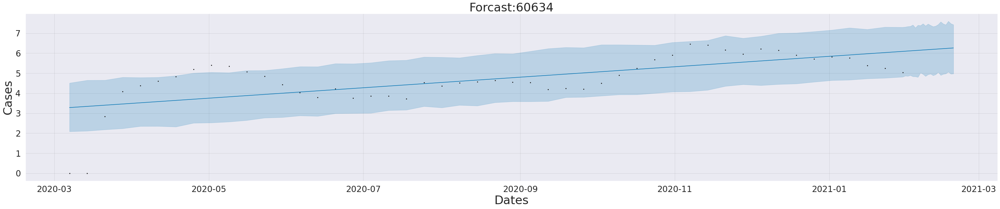

In [ ]:

from fbprophet.plot import plot,plot_components
fig=plot(m1_plain,forecast_m1, figsize=(40,8))
ax = fig.gca()
ax.set_title("Forcast:{}".format(unique_region[which_region]), size=34)
ax.set_xlabel("Dates", size=34)
ax.set_ylabel("Cases", size=34)
ax.tick_params(axis="x", labelsize=24)
ax.tick_params(axis="y", labelsize=24)


In [ ]:

# First, let's get some useful variables: "y" for the actual value and "n" for the number of observations.
y = df_prophet['y'].to_frame()
y.index = df_prophet['ds']
n = np.int(y.count())


In [ ]:

# The forecast is 'log transformed', so we need to 'inverse' it back by using the exp
forecast_m1_exp = np.exp(forecast_m1[['yhat','yhat_lower','yhat_upper']])
forecast_m1_exp.index = forecast_m1['ds']


In [ ]:

# Now let's calculate the MAPE for m1
error = forecast_m1_exp['yhat'] - y['y']
MAPE_m1 = ((error/y['y']).abs().sum()/n *100)
round(MAPE_m1-b,2)


2.11

<hr>
<center>
<h4>
<b>
Death Cases Prediction
</b>
</h4>
<hr>
</center>

In [ ]:

X_train_deaths, X_test_deaths, y_train_deaths, y_test_deaths = train_test_split(days_since_03_07_2020,t_deaths[which_region], test_size=0.3, shuffle= True,random_state=4)


In [ ]:
print("X_train_deaths:",X_train_deaths.shape)
print("X_test_deaths:",X_test_deaths.shape)
print("y_train_deaths:",y_train_deaths.shape)
print('y_test_deaths:',y_test_deaths.shape)

X_train_deaths: (33, 1)
X_test_deaths: (15, 1)
y_train_deaths: (33, 1)
y_test_deaths: (15, 1)


<hr>
<center>
<h4>
<b>
Scatter Plot
</b>
</h4>
<hr>
</center>

The linear model is: Y = 1.943 + 0.029907X


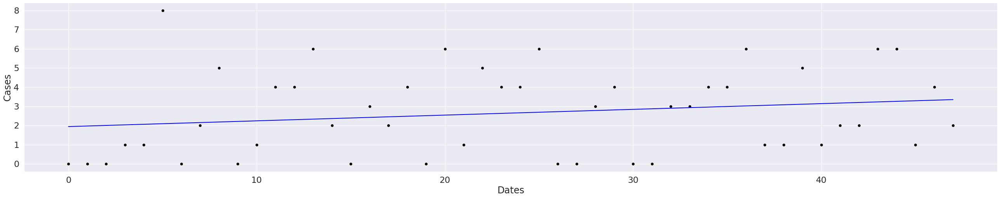

In [ ]:


X=days_since_03_07_2020
y=t_deaths[which_region]

reg = LinearRegression()
reg.fit(X, y)
print("The linear model is: Y = {:.5} + {:.5}X".format(reg.intercept_[0], reg.coef_[0][0]))
predictions = reg.predict(X)

actvspred = pd.DataFrame({'Actual': y.flatten(), 'Predicted': predictions.flatten()})

plt.figure(figsize=(40, 8))
plt.scatter(
    X,
    y,
    c='black'
)
plt.plot(
    X,
    predictions,
    c='blue',
    linewidth=2
)

plt.xlabel("Dates")
plt.ylabel("Cases")
plt.show()


<hr>
<center>
<h4>
<b>
Building A Linear Model
</b>
</h4>
<hr>
</center>

In [ ]:

# Linear regression for test 
deaths_linear_model = LinearRegression()
deaths_linear_model.fit(X_train_deaths, y_train_deaths)

deaths_linear_pred = deaths_linear_model.predict(X_test_deaths)

print('\n')

print('MAE for Linear Regression :', mean_absolute_error(y_test_deaths,deaths_linear_pred))
print('MSE for Linear Regression :', mean_squared_error(y_test_deaths,deaths_linear_pred))
print('RMSE for Linear Regression : ', np.sqrt(mean_squared_error(y_test_deaths,deaths_linear_pred)))

print('\n')




MAE for Linear Regression : 1.6474553334674398
MSE for Linear Regression : 3.7227412608047517
RMSE for Linear Regression :  1.9294406600890195




In [ ]:

# future forecast value for 20 days
deaths_future_forecast_linear_pred = deaths_linear_model.predict(future_forecast)


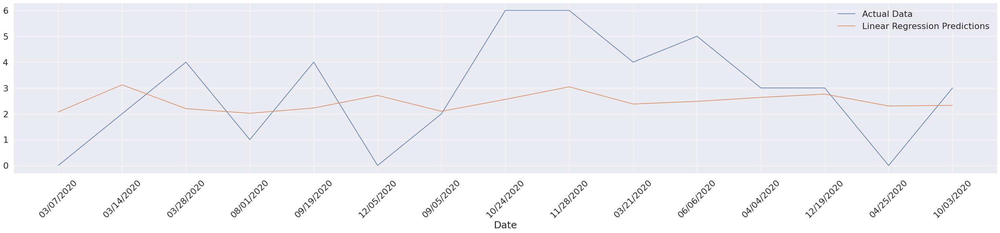

In [ ]:

plt.figure(figsize=(40,8)) 

plt.xticks(range(0,15,1),dates,rotation=45)
plt.xlabel('Date',fontsize=25)

plt.plot(y_test_deaths)
plt.plot(deaths_linear_pred)

plt.legend(['Actual Data', 'Linear Regression Predictions']);


<hr>
<center>
<h4>
<b>
Building A Polynomial Model
</b>
</h4>
<hr>
</center>

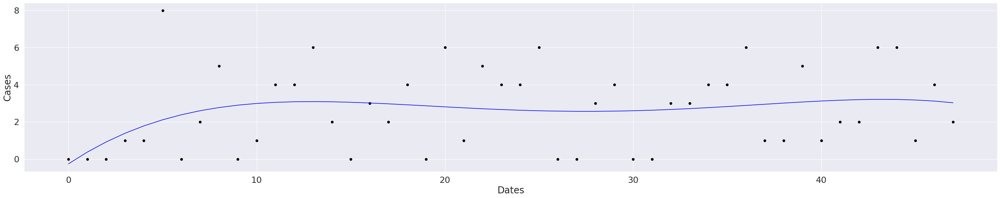

In [ ]:

poly = PolynomialFeatures(degree =4) 
X_poly = poly.fit_transform(X) 
  
poly.fit(X_poly, y) 
lin2 = LinearRegression() 
lin2.fit(X_poly, y) 
pred = lin2.predict(X_poly)
new_X, new_y = zip(*sorted(zip(X, pred)))

plt.figure(figsize=(40, 8))
plt.scatter(
    X,
    y,
    c='black'
)
plt.plot(
    new_X, new_y,
    c='blue'
)
plt.xlabel("Dates")
plt.ylabel("Cases")
plt.show()




In [ ]:

from sklearn.preprocessing import PolynomialFeatures
from sklearn import linear_model

# transform data for polynomial regression
poly = PolynomialFeatures(degree=3)
poly_X_train_deaths = poly.fit_transform(X_train_deaths)
poly_X_test_deaths = poly.fit_transform(X_test_deaths)
poly_future_forecast_deaths = poly.fit_transform(future_forecast)

deaths_poly_model = linear_model.LinearRegression()
deaths_poly_model.fit(poly_X_train_deaths, y_train_deaths)

deaths_poly_pred=deaths_poly_model.predict(poly_X_test_deaths)

print('\n')

print('MAE for Poly Regression :', mean_absolute_error(y_test_deaths,deaths_poly_pred))
print('MSE for Poly Regression :',mean_squared_error(y_test_deaths,deaths_poly_pred))
print('RMSE for Poly Regression : ',np.sqrt(mean_squared_error(y_test_deaths,deaths_poly_pred)))

print('\n')




MAE for Poly Regression : 1.5707364737318181
MSE for Poly Regression : 3.4811709453763413
RMSE for Poly Regression :  1.8657896305254624




In [ ]:
deaths_future_forecast_poly_pred =deaths_poly_model.predict(poly_future_forecast_deaths)

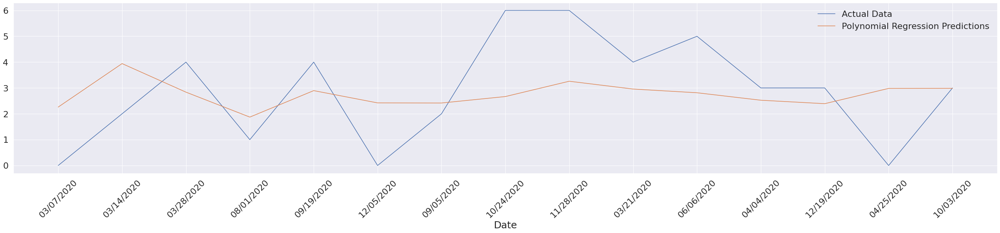

In [ ]:

plt.figure(figsize=(40,8)) 
plt.xticks(range(0,48,1),dates,rotation=45)
plt.xlabel('Date',fontsize=25)

plt.plot(y_test_deaths)
plt.plot(deaths_poly_pred)
plt.legend(['Actual Data', 'Polynomial Regression Predictions']);


<hr>
<center>
<h4>
<b>
Building A SVM Model
</b>
</h4>
<hr>
</center>

In [ ]:

# svm_confirmed = svm_search.best_estimator_
deaths_svm_model = SVR(shrinking=True, kernel='poly',gamma=0.01, epsilon=1,degree=5, C=0.1)
deaths_svm_model.fit(X_train_deaths, y_train_deaths)
deaths_svm_pred = deaths_svm_model.predict(X_test_deaths);

print('\n')

print('MAE for SVM :', mean_absolute_error(y_test_deaths,deaths_svm_pred))
print('MSE for SVM :',mean_squared_error(y_test_deaths,deaths_svm_pred))
print('RMSE for SVM : ',np.sqrt(mean_squared_error(y_test_deaths,deaths_svm_pred)))

print('\n')




MAE for SVM : 1.812924744321041
MSE for SVM : 4.291740982373053
RMSE for SVM :  2.071651752195106




/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [ ]:

deaths_future_forecast_svm_pred=deaths_svm_model.predict(future_forecast);


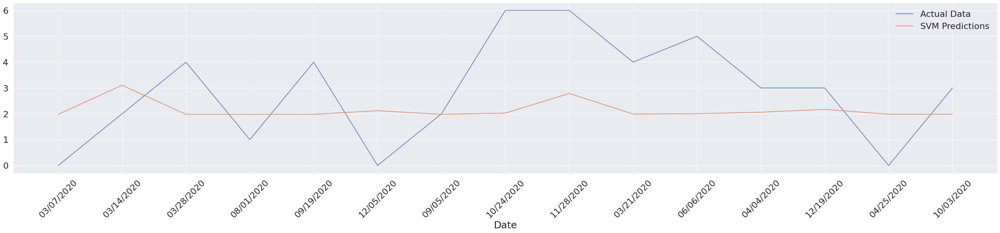

In [ ]:
plt.figure(figsize=(40,8)) 
plt.xticks(range(0,15,1),dates,rotation=45)
plt.xlabel('Date',fontsize=25)

plt.plot(y_test_deaths)
plt.plot(deaths_svm_pred)
plt.legend(['Actual Data', 'SVM Predictions']);


In [ ]:
def plot_predictions(x, y, pred, algo_name, color,region):
    plt.figure(figsize=(40, 8))
    plt.plot(x, y)

    plt.xticks(range(0,48,1),dates,rotation=45)
    plt.xlabel('Date',fontsize=25)


    plt.plot(future_forecast, pred, linestyle='dashed', color=color)
    plt.title('Number of Coronavirus Cases Over Time:{}'.format(region), size=30)
    plt.xlabel('Days Since 03/07/2020', size=30)
    plt.ylabel('Number of Cases', size=30)
    plt.legend(['Confirmed Cases', algo_name], prop={'size': 20})
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

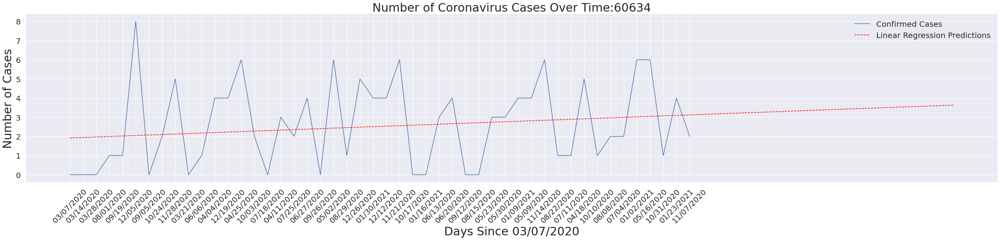

In [ ]:
plot_predictions(adjusted_dates, t_deaths[which_region],deaths_future_forecast_linear_pred, 'Linear Regression Predictions', 'red',unique_region[which_region])

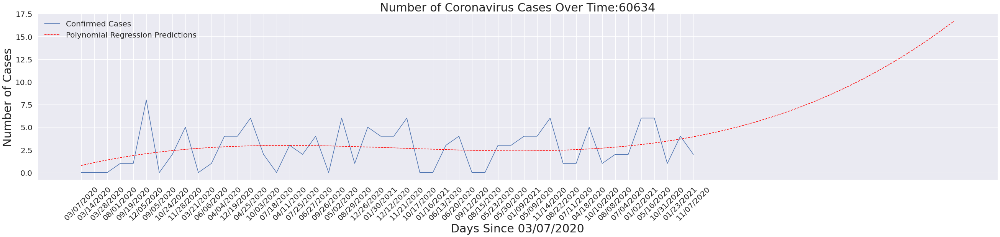

In [ ]:

plot_predictions(adjusted_dates, t_deaths[which_region],deaths_future_forecast_poly_pred, 'Polynomial Regression Predictions', 'red',unique_region[which_region])



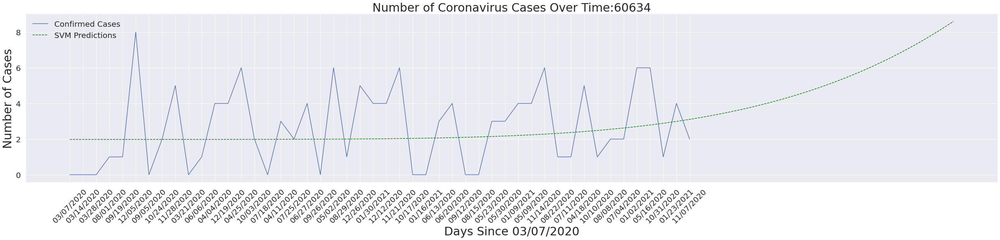

In [ ]:

plot_predictions(adjusted_dates, t_deaths[which_region],deaths_future_forecast_svm_pred, 'SVM Predictions', 'green',unique_region[which_region])


In [ ]:

# Future predictions 
# linear_pred = linear_pred.reshape(1,-1)[0]
deaths_pred_df = pd.DataFrame({'Date': future_forecast_dates[-20:],'RL deaths Cases Prediction': np.round(deaths_future_forecast_linear_pred[-20:].ravel()),'Poly deaths Cases Prediction': np.round(deaths_future_forecast_poly_pred[-20:].ravel()),'SVM deaths Cases prediction': np.round(deaths_future_forecast_svm_pred[-20:].ravel())})
deaths_pred_df


,Date,RL deaths Cases Prediction,Poly deaths Cases Prediction,SVM deaths Cases prediction
0,04/24/2020,3.0,4.0,3.0
1,04/25/2020,3.0,5.0,3.0
2,04/26/2020,3.0,5.0,4.0
3,04/27/2020,3.0,5.0,4.0
4,04/28/2020,3.0,6.0,4.0
5,04/29/2020,3.0,6.0,4.0
6,04/30/2020,3.0,7.0,4.0
7,05/01/2020,3.0,7.0,4.0
8,05/02/2020,3.0,8.0,5.0
9,05/03/2020,3.0,8.0,5.0


In [ ]:

total_deaths_future_forecast_linear_pred=deaths_future_forecast_linear_pred[-20:].ravel().sum()
total_deaths_future_forecast_linear_pred


67.80173911453285

In [ ]:

total_deaths_future_forecast_poly_pred=deaths_future_forecast_poly_pred[-20:].ravel().sum()
total_deaths_future_forecast_poly_pred


185.36519161469735

In [ ]:

total_deaths_future_forecast_svm_pred=deaths_future_forecast_svm_pred[-20:].ravel().sum()
total_deaths_future_forecast_svm_pred


107.51655812673138

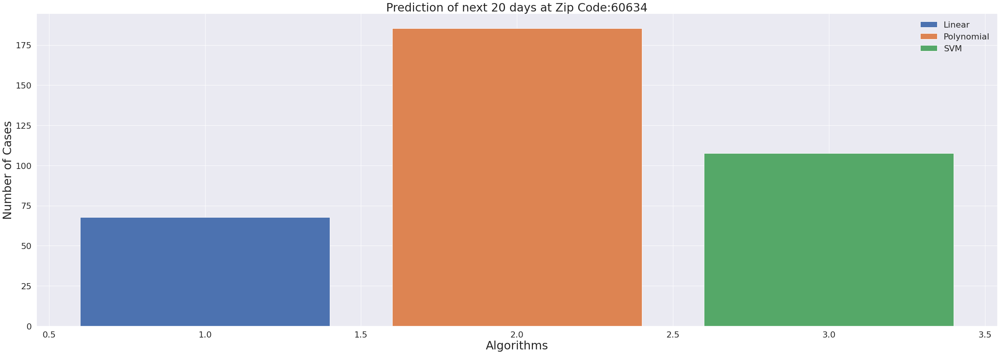

In [ ]:

plt.figure(figsize=(40,15))

plt.bar(1,total_deaths_future_forecast_linear_pred)
plt.bar(2,total_deaths_future_forecast_poly_pred)
plt.bar(3,total_deaths_future_forecast_svm_pred)

plt.title('Prediction of next 20 days at Zip Code:{}'.format(unique_region[which_region]),size=30)
plt.xlabel('Algorithms', size=30)
plt.ylabel('Number of Cases', size=30)
plt.legend(['Linear','Polynomial','SVM'])
plt.show()


In [ ]:


a=t_deaths[which_region] #Target
b=a.ravel().astype(int)
b[b<1]=1
b

array([1, 1, 1, 1, 1, 8, 1, 2, 5, 1, 1, 4, 4, 6, 2, 1, 3, 2, 4, 1, 6, 1,
       5, 4, 4, 6, 1, 1, 3, 4, 1, 1, 3, 3, 4, 4, 6, 1, 1, 5, 1, 2, 2, 6,
       6, 1, 4, 2])

In [ ]:

from fbprophet import Prophet
df_prophet= pd.DataFrame({'ds':dates, 'y':b})
df_m1=df_prophet.copy()


In [ ]:

b=158
df_m1['y'] = np.log(df_m1['y'])


In [ ]:

m1_plain = Prophet()
m1_plain.fit(df_m1)
future = m1_plain.make_future_dataframe(periods=20)
forecast_m1 = m1_plain.predict(future)


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


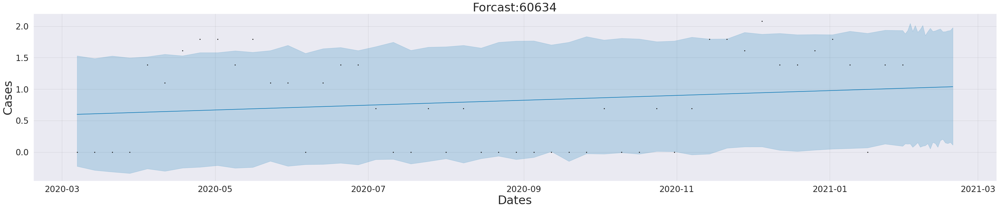

In [ ]:

from fbprophet.plot import plot,plot_components
fig=plot(m1_plain,forecast_m1, figsize=(40,8))
ax = fig.gca()
ax.set_title("Forcast:{}".format(unique_region[which_region]), size=34)
ax.set_xlabel("Dates", size=34)
ax.set_ylabel("Cases", size=34)
ax.tick_params(axis="x", labelsize=24)
ax.tick_params(axis="y", labelsize=24)


In [ ]:

# First, let's get some useful variables: "y" for the actual value and "n" for the number of observations.
y = df_prophet['y'].to_frame()
y.index = df_prophet['ds']
n = np.int(y.count())


In [ ]:

# The forecast is 'log transformed', so we need to 'inverse' it back by using the exp
forecast_m1_exp = np.exp(forecast_m1[['yhat','yhat_lower','yhat_upper']])
forecast_m1_exp.index = forecast_m1['ds']


In [ ]:

# Now let's calculate the MAPE for m1
error = forecast_m1_exp['yhat'] - y['y']
MAPE_m1 = ((error/y['y']).abs().sum()/n *100)
round(MAPE_m1,2)


72.42

<center>
<hr/>
<b>
Prediction based on Region/Zipcode 
</b>
<hr/>
</center>

In [ ]:


# For Number of Tests

total_test_future_forecast_linear_pred=[]
total_test_future_forecast_poly_pred=[]
total_test_future_forecast_svm_pred=[]

# For Number of confirmed cases

total_confirmed_future_forecast_linear_pred=[]
total_confirmed_future_forecast_poly_pred=[]
total_confirmed_future_forecast_svm_pred=[]

# For Number of deaths

total_deaths_future_forecast_linear_pred=[]
total_deaths_future_forecast_poly_pred=[]
total_deaths_future_forecast_svm_pred=[]


for i in range(len(unique_region)):

  X_train_test,X_test_test, y_train_test, y_test_test = train_test_split(days_since_03_07_2020,t_test[i], test_size=0.3,shuffle= True,random_state=6)
  X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(days_since_03_07_2020,t_cases[i], test_size=0.3, shuffle= True,random_state=4) 
  X_train_deaths, X_test_deaths, y_train_deaths, y_test_deaths = train_test_split(days_since_03_07_2020,t_deaths[i], test_size=0.3, shuffle= True,random_state=4)
  

  # For Number of Tests 
  #linear model
  test_linear_model.fit(X_train_test, y_train_test)
  test_future_forecast_linear_pred = test_linear_model.predict(future_forecast)

  total_test_future_forecast_linear_pred.append(abs(int(test_future_forecast_linear_pred[-20:].ravel().sum())))

  # polynomial model
  poly_X_train_test = poly.fit_transform(X_train_test)
  poly_X_test_test = poly.fit_transform(X_test_test)
  poly_future_forecast_test = poly.fit_transform(future_forecast)

  test_poly_model = linear_model.LinearRegression()
  test_poly_model.fit(poly_X_train_test, y_train_test)

  test_future_forecast_poly_pred =test_poly_model.predict(poly_future_forecast_test)

  total_test_future_forecast_poly_pred.append(abs(int(test_future_forecast_poly_pred[-20:].ravel().sum())))
  
  # SVM model
  test_svm_model.fit(X_train_test, y_train_test)
  test_future_forecast_svm_pred=test_svm_model.predict(future_forecast);

  total_test_future_forecast_svm_pred.append(abs(int(test_future_forecast_svm_pred[-20:].ravel().sum())))

  # For Number of Confirmed Cases
  #linear model
  confirmed_linear_model.fit(X_train_confirmed, y_train_confirmed)
  confirmed_future_forecast_linear_pred = confirmed_linear_model.predict(future_forecast)

  total_confirmed_future_forecast_linear_pred.append(abs(int(confirmed_future_forecast_linear_pred[-20:].ravel().sum())))

  # polynomial model
  poly_X_train_confirmed = poly.fit_transform(X_train_confirmed)
  poly_X_test_confirmed = poly.fit_transform(X_test_confirmed)
  poly_future_forecast_confirmed = poly.fit_transform(future_forecast)

  confirmed_poly_model = linear_model.LinearRegression()
  confirmed_poly_model.fit(poly_X_train_confirmed, y_train_confirmed)

  confirmed_future_forecast_poly_pred =confirmed_poly_model.predict(poly_future_forecast_confirmed)

  total_confirmed_future_forecast_poly_pred.append(abs(int(confirmed_future_forecast_poly_pred[-20:].ravel().sum())))

  # SVM model
  confirmed_svm_model.fit(X_train_confirmed, y_train_confirmed)
  confirmed_future_forecast_svm_pred=confirmed_svm_model.predict(future_forecast);

  total_confirmed_future_forecast_svm_pred.append(abs(int(confirmed_future_forecast_svm_pred[-20:].ravel().sum())))

  # Number of Deaths
  #linear model
  deaths_linear_model.fit(X_train_deaths, y_train_deaths)
  deaths_future_forecast_linear_pred = deaths_linear_model.predict(future_forecast)

  total_deaths_future_forecast_linear_pred.append(abs(int(deaths_future_forecast_linear_pred[-20:].ravel().sum())))

  # polynomial model
  poly_X_train_deaths = poly.fit_transform(X_train_deaths)
  poly_X_test_deaths = poly.fit_transform(X_test_deaths)
  poly_future_forecast_deaths = poly.fit_transform(future_forecast)

  deaths_poly_model = linear_model.LinearRegression()
  deaths_poly_model.fit(poly_X_train_deaths, y_train_deaths)

  deaths_future_forecast_poly_pred =deaths_poly_model.predict(poly_future_forecast_deaths)

  total_deaths_future_forecast_poly_pred.append(abs(int(deaths_future_forecast_poly_pred[-20:].ravel().sum())))

  # SVM model
  deaths_svm_model.fit(X_train_deaths, y_train_deaths)

  deaths_future_forecast_svm_pred=deaths_svm_model.predict(future_forecast);

  total_deaths_future_forecast_svm_pred.append(abs(int(deaths_future_forecast_svm_pred[-20:].ravel().sum())))


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConv

In [ ]:
# Future predictions based on Dates and regions

final_predict_df= pd.DataFrame({'Region/zipcode':unique_region,
                                'Linear_Predict_Test': np.round(total_test_future_forecast_linear_pred),
                                'Linear_Predict_Confirmed': np.round(total_confirmed_future_forecast_linear_pred),
                                'Linear_Predict_Deaths': np.round(total_deaths_future_forecast_linear_pred),
                                'Poly_Predict_Test': np.round(total_test_future_forecast_poly_pred),
                                'Poly_Predict_Confirmed': np.round(total_confirmed_future_forecast_poly_pred),
                                'Poly_Predict_Deaths': np.round(total_deaths_future_forecast_poly_pred),
                                'SVM_Predict_Test': np.round(total_test_future_forecast_svm_pred),
                                'SVM_Predict_Confirmed': np.round(total_confirmed_future_forecast_svm_pred),
                                'SVM_Predict_Deaths': np.round(total_deaths_future_forecast_svm_pred)
                                })


In [ ]:

final_df = final_predict_df.sort_values(by=['SVM_Predict_Confirmed'],ascending=False)


INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should

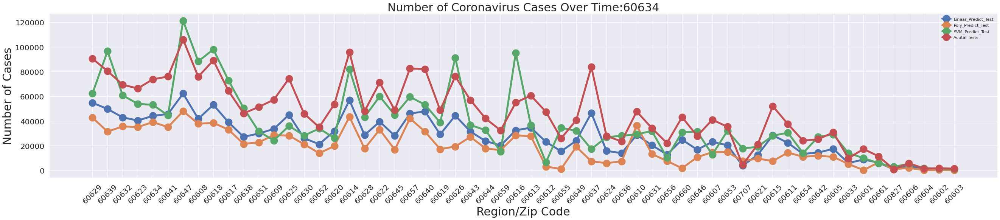

In [ ]:
plt.figure(figsize=(40,8))

plt.xticks(range(0,58,1),final_predict_df['Region/zipcode'],rotation=45)
plt.xlabel('Region/zipcode',fontsize=25) 


plt.plot(final_predict_df['Region/zipcode'], final_predict_df['Linear_Predict_Test'],marker = 'o',ms = 20, mec = 'r',linewidth = '5')
plt.plot(final_predict_df['Region/zipcode'], final_predict_df['Poly_Predict_Test'],marker = 'o',ms = 20, mec = 'g',linewidth = '5')
plt.plot(final_predict_df['Region/zipcode'], final_predict_df['SVM_Predict_Test'],marker = 'o',ms = 20, mec = 'b',linewidth = '5')
plt.plot(final_predict_df['Region/zipcode'], region_df['Number of Tests'],marker = 'o',ms = 20, mec = 'b',linewidth = '5')

plt.title('Region Wise next 20days total cases', size=20)
plt.title('Number of Coronavirus Cases Over Time:{}'.format(unique_region[4]),size=30)
plt.xlabel('Region/Zip Code', size=30)
plt.ylabel('Number of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.legend(['Linear_Predict_Test','Poly_Predict_Test','SVM_Predict_Test','Acutal Tests'])
plt.show()

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should

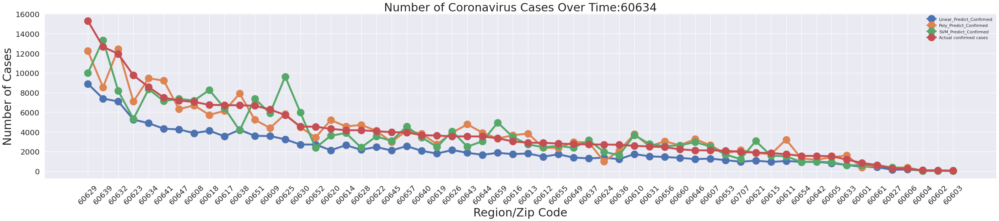

In [ ]:
plt.figure(figsize=(40,8))

plt.xticks(range(0,58,1),final_predict_df['Region/zipcode'],rotation=45)
plt.xlabel('Region/zipcode',fontsize=25) 


plt.plot(final_predict_df['Region/zipcode'], final_predict_df['Linear_Predict_Confirmed'],marker = 'o',ms = 20, mec = 'r',linewidth = '5')
plt.plot(final_predict_df['Region/zipcode'], final_predict_df['Poly_Predict_Confirmed'],marker = 'o',ms = 20, mec = 'g',linewidth = '5')
plt.plot(final_predict_df['Region/zipcode'], final_predict_df['SVM_Predict_Confirmed'],marker = 'o',ms = 20, mec = 'b',linewidth = '5')
plt.plot(final_predict_df['Region/zipcode'], region_df['Number of Confirmed Cases'],marker = 'o',ms = 20, mec = 'b',linewidth = '5')


plt.title('Number of Coronavirus Cases Over Time:{}'.format(unique_region[4]),size=30)
plt.xlabel('Region/Zip Code', size=30)
plt.ylabel('Number of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.legend(['Linear_Predict_Confirmed','Poly_Predict_Confirmed','SVM_Predict_Confirmed','Actual confirmed cases'])
plt.show()

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should

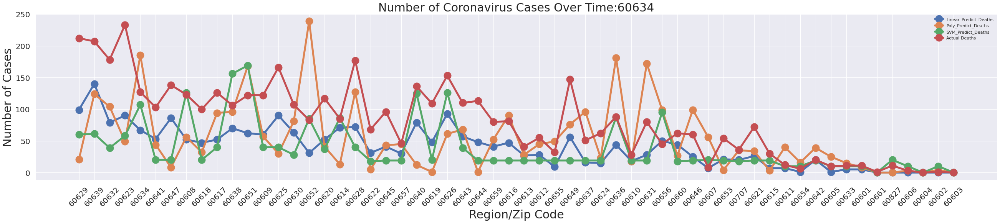

In [ ]:
plt.figure(figsize=(40,8))

plt.xticks(range(0,58,1),final_predict_df['Region/zipcode'],rotation=45)
plt.xlabel('Region/zipcode',fontsize=25) 


plt.plot(final_predict_df['Region/zipcode'], final_predict_df['Linear_Predict_Deaths'],marker = 'o',ms = 20, mec = 'r',linewidth = '5')
plt.plot(final_predict_df['Region/zipcode'], final_predict_df['Poly_Predict_Deaths'],marker = 'o',ms = 20, mec = 'g',linewidth = '5')
plt.plot(final_predict_df['Region/zipcode'], final_predict_df['SVM_Predict_Deaths'],marker = 'o',ms = 20, mec = 'b',linewidth = '5')
plt.plot(final_predict_df['Region/zipcode'], region_df['Number of Deaths'],marker = 'o',ms = 20, mec = 'b',linewidth = '5')

plt.title('Region Wise next 20days total cases', size=20)
plt.title('Number of Coronavirus Cases Over Time:{}'.format(unique_region[4]),size=30)
plt.xlabel('Region/Zip Code', size=30)
plt.ylabel('Number of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.legend(['Linear_Predict_Deaths','Poly_Predict_Deaths','SVM_Predict_Deaths','Actual Deaths'])
plt.show()

In [ ]:

predict_cases_svm=final_df.groupby('Region/zipcode')['SVM_Predict_Confirmed'].sum()
predict_cases_svm

Region/zipcode
60601      585
60602       20
60603       20
60604       19
60605      902
60606      268
60607     2510
60608     7183
60609     5888
60610     3671
60611     1503
60612     2429
60613     2723
60614     3874
60615     1574
60616     3470
60617     6412
60618     8258
60619     2448
60620     3601
60621     3060
60622     3532
60623     5313
60624     1963
60625     9624
60626     4042
60628     2400
60629     9974
60630     5956
60631     2758
60632     8160
60633      610
60634     8336
60636     1621
60637     3145
60638     4140
60639    13335
60640     3428
60641     7133
60642      970
60643     2487
60644     3040
60645     3070
60646     2947
60647     7354
60649     2373
60651     7373
60652     2370
60653     1685
60654      929
60655     2562
60656     2545
60657     4543
60659     4939
60660     2622
60661      613
60707     1218
60827      360
Name: SVM_Predict_Confirmed, dtype: int64

In [ ]:

predict_cases_svm.name = 'predict_cases_svm'


In [ ]:

# run only once if run again then there are overwriting the values.
chi_zips = chi_zips.join(predict_cases_svm, on='zip')
chi_zips


,objectid,shape_area,shape_len,zip,geometry,total_cases,predict_cases_svm
0,33.0,1.060523e+08,42720.044406,60647,"POLYGON ((-87.67762 41.91776, -87.67761 41.917...",7172.0,7354.0
1,34.0,1.274761e+08,48103.782721,60639,"POLYGON ((-87.72683 41.92265, -87.72693 41.922...",12653.0,13335.0
2,35.0,4.506904e+07,27288.609612,60707,"POLYGON ((-87.78500 41.90915, -87.78531 41.909...",1944.0,1218.0
3,36.0,7.085383e+07,42527.989679,60622,"POLYGON ((-87.66707 41.88885, -87.66707 41.888...",4068.0,3532.0
4,37.0,9.903962e+07,47970.140153,60651,"POLYGON ((-87.70656 41.89555, -87.70672 41.895...",6653.0,7373.0
...,...,...,...,...,...,...,...
56,57.0,1.552855e+08,53406.915617,60623,"POLYGON ((-87.69479 41.83008, -87.69486 41.830...",9746.0,5313.0
57,58.0,2.111148e+08,58701.325375,60629,"POLYGON ((-87.68306 41.75786, -87.68306 41.757...",15287.0,9974.0
58,59.0,2.116961e+08,58466.160298,60620,"POLYGON ((-87.62373 41.72167, -87.62388 41.721...",4297.0,3601.0
59,60.0,1.254243e+08,52377.854541,60637,"POLYGON ((-87.57691 41.79511, -87.57700 41.795...",2710.0,3145.0


In [ ]:
final_df

,Region/zipcode,Linear_Predict_Test,Linear_Predict_Confirmed,Linear_Predict_Deaths,Poly_Predict_Test,Poly_Predict_Confirmed,Poly_Predict_Deaths,SVM_Predict_Test,SVM_Predict_Confirmed,SVM_Predict_Deaths
1,60639,49728,7379,140,31389,8535,124,96542,13335,61
0,60629,54786,8887,99,42726,12217,21,62263,9974,60
13,60625,45041,3230,90,28170,5805,30,36026,9624,40
4,60634,44147,4876,67,39057,9446,185,53049,8336,107
8,60618,53104,4110,47,38481,5720,32,98000,8258,20
2,60632,42918,7091,79,35607,12445,104,60797,8160,39
11,60651,29842,3586,62,22686,5226,168,31599,7373,169
6,60647,62216,4241,86,47965,6310,8,121147,7354,20
7,60608,41757,3868,52,37733,6687,56,88285,7183,126
5,60641,45670,4316,53,35030,9208,44,44516,7133,20


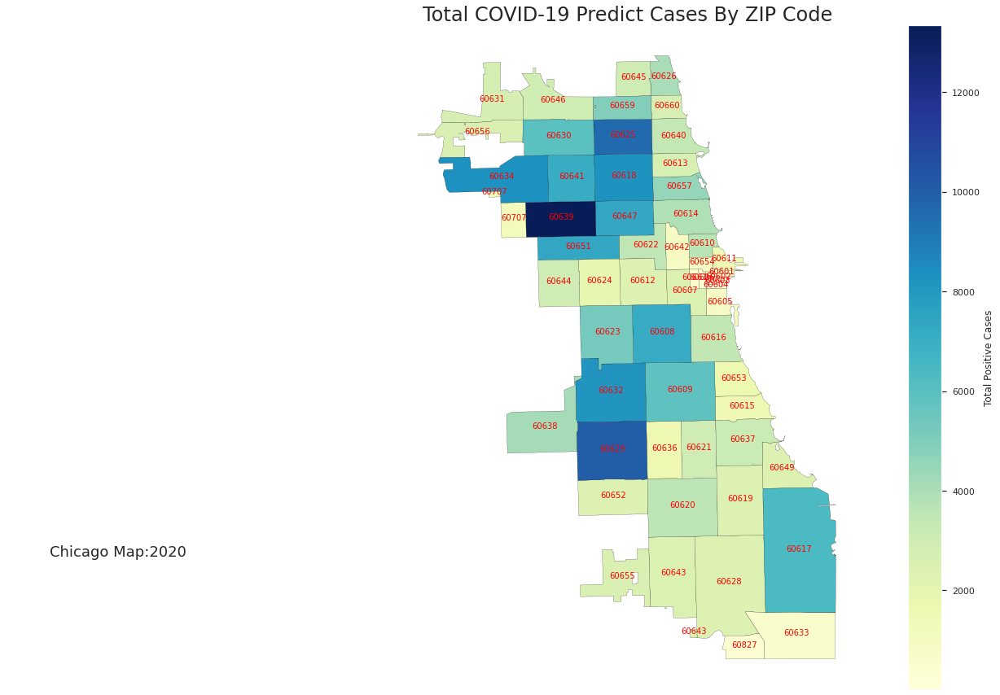

In [ ]:

fig, ax = plt.subplots(figsize=(20,15))
ax.axis('off')
ax.set_title('Total COVID-19 Predict Cases By ZIP Code',
            fontdict={'fontsize': 24, 'fontweight':10})# plot the map
chi_zips.plot(ax=ax, column='predict_cases_svm',
            edgecolor='black', linewidth=.2,
            cmap='YlGnBu', legend=True,
            legend_kwds={'label': 'Total Positive Cases'});# source the data
ax.annotate('Chicago Map:2020' ,
            xy=(0.05, .2),  xycoords='figure fraction', 
            fontsize=18);

for _, row in chi_zips.iterrows():
    xy = row['geometry'].centroid.coords
    ax.annotate(row['zip'], xy=xy[0],
                 horizontalalignment='center',
                 color='red',fontsize=10)
    

<center>
<h1>
<hr/>
<b>
Analysis , Visualization and Prediction On Combined Datasets 
</b>
<hr/>
</h1>
</center>

In [ ]:

region_df = pd.DataFrame({'Region': unique_region, 'Number of Confirmed Cases': confirmed_by_region,'Number of Deaths': death_by_region,'Number of Tests': test_by_region,'Population': population_by_region})
region_df.style.background_gradient(cmap='Blues')


,Region,Number of Confirmed Cases,Number of Deaths,Number of Tests,Population
0,60629,15287,212,90535,5368800
1,60639,12653,207,80460,4344816
2,60632,11926,178,69375,4369872
3,60623,9746,233,66350,4126992
4,60634,8570,127,73778,3647760
5,60641,7483,103,76008,3409104
6,60647,7172,138,105885,4200432
7,60608,7044,123,75867,3801840
8,60618,6739,100,89106,4530960
9,60617,6719,126,64375,3961632


In [ ]:
region_covid_df=region_df
region_covid_df

,Region,Number of Confirmed Cases,Number of Deaths,Number of Tests,Population
0,60629,15287,212,90535,5368800
1,60639,12653,207,80460,4344816
2,60632,11926,178,69375,4369872
3,60623,9746,233,66350,4126992
4,60634,8570,127,73778,3647760
5,60641,7483,103,76008,3409104
6,60647,7172,138,105885,4200432
7,60608,7044,123,75867,3801840
8,60618,6739,100,89106,4530960
9,60617,6719,126,64375,3961632


In [ ]:
region_covid_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 5 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   Region                     58 non-null     object
 1   Number of Confirmed Cases  58 non-null     int64 
 2   Number of Deaths           58 non-null     int64 
 3   Number of Tests            58 non-null     int64 
 4   Population                 58 non-null     int64 
dtypes: int64(4), object(1)
memory usage: 2.4+ KB


In [ ]:
new_crime_df=pd.read_csv('/content/drive/MyDrive/Prashant/lab/PBL/Datasets/Crime data/crime_dataset_according_zipcode.csv')
new_crime_df


,Date,CASE#,Date.1,Block,Primary_Description,Secondary_Description,Location_Desc,Arrest,Domestic,Beat,Ward,X COORDINATE,Y COORDINATE,LATITUDE,LONGITUDE,LOCATION,zipcode
0,2020-02-25 10:20:00,JD164115,2020-02-25 10:20:00,013XX S CANAL ST,BATTERY,SIMPLE,GROCERY FOOD STORE,Y,N,124,11.0,1173336.0,1893976.0,41.864494,-87.639158,"(41.864493678, -87.639158)",60607
1,2020-02-25 05:30:00,JD163938,2020-02-25 05:30:00,033XX W CULLOM AVE,THEFT,$500 AND UNDER,STREET,N,N,1724,33.0,1153387.0,1928387.0,41.959340,-87.711475,"(41.959339811, -87.711474784)",60618
2,2020-02-25 01:04:00,JC164345,2020-02-25 01:04:00,023XX S PULASKI RD,CRIMINAL TRESPASS,TO LAND,RESTAURANT,Y,N,1013,22.0,1150083.0,1887962.0,41.848475,-87.724676,"(41.848474762, -87.724676285)",60623
3,2020-02-25 06:05:00,JD164701,2020-02-25 06:05:00,058XX N RIDGE AVE,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,Y,Y,2013,48.0,1165471.0,1938819.0,41.987716,-87.666750,"(41.987716355, -87.666750459)",60660
4,2020-02-25 01:42:00,JD164416,2020-02-25 01:42:00,011XX N HARDING AVE,NARCOTICS,POSS: CRACK,STREET,Y,N,1112,37.0,1149847.0,1907230.0,41.901353,-87.725041,"(41.901352928, -87.725041269)",60651
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3862,2020-10-09 06:00:00,JD393472,2020-10-09 06:00:00,047XX N MALDEN ST,BATTERY,SIMPLE,APARTMENT,N,N,1913,46.0,1166621.0,1931521.0,41.967666,-87.662731,"(41.967665781, -87.662730846)",60640
3863,2020-10-02 12:20:00,JD385898,2020-10-02 12:20:00,024XX W 60TH ST,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,Y,Y,824,16.0,1160969.0,1864806.0,41.784713,-87.685365,"(41.78471324, -87.685364618)",60629
3864,2020-10-09 11:03:00,JD394423,2020-10-09 11:03:00,012XX W 74TH ST,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,N,Y,734,17.0,1169274.0,1855709.0,41.759574,-87.655178,"(41.759574155, -87.655178004)",60636
3865,2020-09-29 05:30:00,JD398130,2020-09-29 05:30:00,076XX S HALSTED ST,ROBBERY,ARMED - HANDGUN,GAS STATION,N,N,621,17.0,1172288.0,1854297.0,41.755634,-87.644173,"(41.755633717, -87.644173224)",60620


In [ ]:

new_crime_df.rename(columns = {'zipcode':'Region'}, inplace = True)
new_crime_df


,Date,CASE#,Date.1,Block,Primary_Description,Secondary_Description,Location_Desc,Arrest,Domestic,Beat,Ward,X COORDINATE,Y COORDINATE,LATITUDE,LONGITUDE,LOCATION,Region
0,2020-02-25 10:20:00,JD164115,2020-02-25 10:20:00,013XX S CANAL ST,BATTERY,SIMPLE,GROCERY FOOD STORE,Y,N,124,11.0,1173336.0,1893976.0,41.864494,-87.639158,"(41.864493678, -87.639158)",60607
1,2020-02-25 05:30:00,JD163938,2020-02-25 05:30:00,033XX W CULLOM AVE,THEFT,$500 AND UNDER,STREET,N,N,1724,33.0,1153387.0,1928387.0,41.959340,-87.711475,"(41.959339811, -87.711474784)",60618
2,2020-02-25 01:04:00,JC164345,2020-02-25 01:04:00,023XX S PULASKI RD,CRIMINAL TRESPASS,TO LAND,RESTAURANT,Y,N,1013,22.0,1150083.0,1887962.0,41.848475,-87.724676,"(41.848474762, -87.724676285)",60623
3,2020-02-25 06:05:00,JD164701,2020-02-25 06:05:00,058XX N RIDGE AVE,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,Y,Y,2013,48.0,1165471.0,1938819.0,41.987716,-87.666750,"(41.987716355, -87.666750459)",60660
4,2020-02-25 01:42:00,JD164416,2020-02-25 01:42:00,011XX N HARDING AVE,NARCOTICS,POSS: CRACK,STREET,Y,N,1112,37.0,1149847.0,1907230.0,41.901353,-87.725041,"(41.901352928, -87.725041269)",60651
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3862,2020-10-09 06:00:00,JD393472,2020-10-09 06:00:00,047XX N MALDEN ST,BATTERY,SIMPLE,APARTMENT,N,N,1913,46.0,1166621.0,1931521.0,41.967666,-87.662731,"(41.967665781, -87.662730846)",60640
3863,2020-10-02 12:20:00,JD385898,2020-10-02 12:20:00,024XX W 60TH ST,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,Y,Y,824,16.0,1160969.0,1864806.0,41.784713,-87.685365,"(41.78471324, -87.685364618)",60629
3864,2020-10-09 11:03:00,JD394423,2020-10-09 11:03:00,012XX W 74TH ST,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,N,Y,734,17.0,1169274.0,1855709.0,41.759574,-87.655178,"(41.759574155, -87.655178004)",60636
3865,2020-09-29 05:30:00,JD398130,2020-09-29 05:30:00,076XX S HALSTED ST,ROBBERY,ARMED - HANDGUN,GAS STATION,N,N,621,17.0,1172288.0,1854297.0,41.755634,-87.644173,"(41.755633717, -87.644173224)",60620


In [ ]:
new_crime_df['Date'] = pd.to_datetime(new_crime_df['Date']).dt.date
new_crime_df

,Date,CASE#,Date.1,Block,Primary_Description,Secondary_Description,Location_Desc,Arrest,Domestic,Beat,Ward,X COORDINATE,Y COORDINATE,LATITUDE,LONGITUDE,LOCATION,Region
0,2020-02-25,JD164115,2020-02-25 10:20:00,013XX S CANAL ST,BATTERY,SIMPLE,GROCERY FOOD STORE,Y,N,124,11.0,1173336.0,1893976.0,41.864494,-87.639158,"(41.864493678, -87.639158)",60607
1,2020-02-25,JD163938,2020-02-25 05:30:00,033XX W CULLOM AVE,THEFT,$500 AND UNDER,STREET,N,N,1724,33.0,1153387.0,1928387.0,41.959340,-87.711475,"(41.959339811, -87.711474784)",60618
2,2020-02-25,JC164345,2020-02-25 01:04:00,023XX S PULASKI RD,CRIMINAL TRESPASS,TO LAND,RESTAURANT,Y,N,1013,22.0,1150083.0,1887962.0,41.848475,-87.724676,"(41.848474762, -87.724676285)",60623
3,2020-02-25,JD164701,2020-02-25 06:05:00,058XX N RIDGE AVE,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,Y,Y,2013,48.0,1165471.0,1938819.0,41.987716,-87.666750,"(41.987716355, -87.666750459)",60660
4,2020-02-25,JD164416,2020-02-25 01:42:00,011XX N HARDING AVE,NARCOTICS,POSS: CRACK,STREET,Y,N,1112,37.0,1149847.0,1907230.0,41.901353,-87.725041,"(41.901352928, -87.725041269)",60651
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3862,2020-10-09,JD393472,2020-10-09 06:00:00,047XX N MALDEN ST,BATTERY,SIMPLE,APARTMENT,N,N,1913,46.0,1166621.0,1931521.0,41.967666,-87.662731,"(41.967665781, -87.662730846)",60640
3863,2020-10-02,JD385898,2020-10-02 12:20:00,024XX W 60TH ST,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,Y,Y,824,16.0,1160969.0,1864806.0,41.784713,-87.685365,"(41.78471324, -87.685364618)",60629
3864,2020-10-09,JD394423,2020-10-09 11:03:00,012XX W 74TH ST,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,N,Y,734,17.0,1169274.0,1855709.0,41.759574,-87.655178,"(41.759574155, -87.655178004)",60636
3865,2020-09-29,JD398130,2020-09-29 05:30:00,076XX S HALSTED ST,ROBBERY,ARMED - HANDGUN,GAS STATION,N,N,621,17.0,1172288.0,1854297.0,41.755634,-87.644173,"(41.755633717, -87.644173224)",60620


In [ ]:
new_crime_df.columns

Index(['Date', 'CASE#', 'Date.1', 'Block', 'Primary_Description',
       'Secondary_Description', 'Location_Desc', 'Arrest', 'Domestic', 'Beat',
       'Ward', 'X COORDINATE', 'Y COORDINATE', 'LATITUDE', 'LONGITUDE',
       'LOCATION', 'Region'],
      dtype='object')

In [ ]:
new_crime_df1=new_crime_df[['Primary_Description','Arrest', 'Domestic','Region']]
new_crime_df1

,Primary_Description,Arrest,Domestic,Region
0,BATTERY,Y,N,60607
1,THEFT,N,N,60618
2,CRIMINAL TRESPASS,Y,N,60623
3,BATTERY,Y,Y,60660
4,NARCOTICS,Y,N,60651
...,...,...,...,...
3862,BATTERY,N,N,60640
3863,BATTERY,Y,Y,60629
3864,BATTERY,N,Y,60636
3865,ROBBERY,N,N,60620


In [ ]:

combined_df=pd.merge(region_covid_df,new_crime_df1, on="Region",how="left")
combined_df

,Region,Number of Confirmed Cases,Number of Deaths,Number of Tests,Population,Primary_Description,Arrest,Domestic
0,60629,15287,212,90535,5368800,BATTERY,Y,N
1,60629,15287,212,90535,5368800,OFFENSE INVOLVING CHILDREN,N,Y
2,60629,15287,212,90535,5368800,ASSAULT,N,N
3,60629,15287,212,90535,5368800,THEFT,N,N
4,60629,15287,212,90535,5368800,OTHER OFFENSE,Y,N
...,...,...,...,...,...,...,...,...
3744,60603,54,0,1415,56352,DECEPTIVE PRACTICE,N,N
3745,60603,54,0,1415,56352,MOTOR VEHICLE THEFT,N,N
3746,60603,54,0,1415,56352,DECEPTIVE PRACTICE,N,N
3747,60603,54,0,1415,56352,WEAPONS VIOLATION,Y,N


In [ ]:

combined_df['Primary_Description'].value_counts()


THEFT                                738
BATTERY                              711
CRIMINAL DAMAGE                      458
ASSAULT                              336
DECEPTIVE PRACTICE                   290
OTHER OFFENSE                        202
MOTOR VEHICLE THEFT                  200
ROBBERY                              158
WEAPONS VIOLATION                    153
BURGLARY                             142
NARCOTICS                            129
CRIMINAL TRESPASS                     77
OFFENSE INVOLVING CHILDREN            38
SEX OFFENSE                           27
CRIMINAL SEXUAL ASSAULT               23
HOMICIDE                              19
ARSON                                 11
INTERFERENCE WITH PUBLIC OFFICER      10
PUBLIC PEACE VIOLATION                 8
PROSTITUTION                           7
KIDNAPPING                             4
INTIMIDATION                           3
STALKING                               2
LIQUOR LAW VIOLATION                   2
CONCEALED CARRY 

In [ ]:
combined_df.info();

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3749 entries, 0 to 3748
Data columns (total 8 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   Region                     3749 non-null   object
 1   Number of Confirmed Cases  3749 non-null   int64 
 2   Number of Deaths           3749 non-null   int64 
 3   Number of Tests            3749 non-null   int64 
 4   Population                 3749 non-null   int64 
 5   Primary_Description        3749 non-null   object
 6   Arrest                     3749 non-null   object
 7   Domestic                   3749 non-null   object
dtypes: int64(4), object(4)
memory usage: 263.6+ KB


In [ ]:
from sklearn.preprocessing import LabelEncoder  

le = LabelEncoder()
combined_df['Primary_Description']=le.fit_transform(combined_df['Primary_Description'])
combined_df['Primary_Description'].unique()


array([ 2, 16,  1, 23, 17,  5, 20,  8, 21, 15, 24,  3,  7, 14, 11,  0,  4,
       19,  6, 12, 10,  9, 13, 22, 18])

In [ ]:
combined_df['Primary_Description'].replace(to_replace =[ 2, 16,  1, 23, 17,  5, 20,  8, 21, 15, 24,  3,  7, 14, 11,  0,  4,19,  6, 12, 10,  9, 13, 22, 18],value =1,inplace=True)

In [ ]:
combined_df['Arrest']=le.fit_transform(combined_df['Arrest'])

In [ ]:
combined_df['Domestic']=le.fit_transform(combined_df['Domestic'])

In [ ]:
combined_df['Region']=combined_df['Region'].astype(str).astype(int)

In [ ]:
region_covid_df['Region']=region_df['Region'].astype(str).astype(int)

In [ ]:
combined_df.info();

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3749 entries, 0 to 3748
Data columns (total 8 columns):
 #   Column                     Non-Null Count  Dtype
---  ------                     --------------  -----
 0   Region                     3749 non-null   int64
 1   Number of Confirmed Cases  3749 non-null   int64
 2   Number of Deaths           3749 non-null   int64
 3   Number of Tests            3749 non-null   int64
 4   Population                 3749 non-null   int64
 5   Primary_Description        3749 non-null   int64
 6   Arrest                     3749 non-null   int64
 7   Domestic                   3749 non-null   int64
dtypes: int64(8)
memory usage: 263.6 KB


In [ ]:
combined_df

,Region,Number of Confirmed Cases,Number of Deaths,Number of Tests,Population,Primary_Description,Arrest,Domestic
0,60629,15287,212,90535,5368800,1,1,0
1,60629,15287,212,90535,5368800,1,0,1
2,60629,15287,212,90535,5368800,1,0,0
3,60629,15287,212,90535,5368800,1,0,0
4,60629,15287,212,90535,5368800,1,1,0
...,...,...,...,...,...,...,...,...
3744,60603,54,0,1415,56352,1,0,0
3745,60603,54,0,1415,56352,1,0,0
3746,60603,54,0,1415,56352,1,0,0
3747,60603,54,0,1415,56352,1,1,0


In [ ]:

# According to Zip code

region_pd=combined_df.groupby('Region')['Primary_Description'].sum()
region_arrest=combined_df.groupby('Region')['Arrest'].sum()
region_domestic=combined_df.groupby('Region')['Domestic'].sum()



In [ ]:
len(region_pd)

58

In [ ]:
len(region_arrest)

58

In [ ]:
len(region_domestic)

58

In [ ]:
# region_pd

In [ ]:
region_covid_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 5 columns):
 #   Column                     Non-Null Count  Dtype
---  ------                     --------------  -----
 0   Region                     58 non-null     int64
 1   Number of Confirmed Cases  58 non-null     int64
 2   Number of Deaths           58 non-null     int64
 3   Number of Tests            58 non-null     int64
 4   Population                 58 non-null     int64
dtypes: int64(5)
memory usage: 2.4 KB


In [ ]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3749 entries, 0 to 3748
Data columns (total 8 columns):
 #   Column                     Non-Null Count  Dtype
---  ------                     --------------  -----
 0   Region                     3749 non-null   int64
 1   Number of Confirmed Cases  3749 non-null   int64
 2   Number of Deaths           3749 non-null   int64
 3   Number of Tests            3749 non-null   int64
 4   Population                 3749 non-null   int64
 5   Primary_Description        3749 non-null   int64
 6   Arrest                     3749 non-null   int64
 7   Domestic                   3749 non-null   int64
dtypes: int64(8)
memory usage: 263.6 KB


In [ ]:

region_pd.name = 'crime_cases'


# run only once if run again then there are overwriting the values.
final_combined_df = region_covid_df.join(region_pd, on='Region')
final_combined_df


,Region,Number of Confirmed Cases,Number of Deaths,Number of Tests,Population,crime_cases
0,60629,15287,212,90535,5368800,137
1,60639,12653,207,80460,4344816,57
2,60632,11926,178,69375,4369872,54
3,60623,9746,233,66350,4126992,128
4,60634,8570,127,73778,3647760,52
5,60641,7483,103,76008,3409104,64
6,60647,7172,138,105885,4200432,58
7,60608,7044,123,75867,3801840,76
8,60618,6739,100,89106,4530960,74
9,60617,6719,126,64375,3961632,181


In [ ]:

region_arrest.name='arrest'
# run only once if run again then there are overwriting the values.
final_combined_df = final_combined_df.join(region_arrest,on='Region')
final_combined_df


,Region,Number of Confirmed Cases,Number of Deaths,Number of Tests,Population,crime_cases,arrest
0,60629,15287,212,90535,5368800,137,18
1,60639,12653,207,80460,4344816,57,9
2,60632,11926,178,69375,4369872,54,9
3,60623,9746,233,66350,4126992,128,26
4,60634,8570,127,73778,3647760,52,8
5,60641,7483,103,76008,3409104,64,4
6,60647,7172,138,105885,4200432,58,9
7,60608,7044,123,75867,3801840,76,12
8,60618,6739,100,89106,4530960,74,4
9,60617,6719,126,64375,3961632,181,22


In [ ]:
region_domestic.name='domestic'
# run only once if run again then there are overwriting the values.
final_combined_df = final_combined_df.join(region_domestic,on='Region')
final_combined_df

,Region,Number of Confirmed Cases,Number of Deaths,Number of Tests,Population,crime_cases,arrest,domestic
0,60629,15287,212,90535,5368800,137,18,32
1,60639,12653,207,80460,4344816,57,9,15
2,60632,11926,178,69375,4369872,54,9,12
3,60623,9746,233,66350,4126992,128,26,28
4,60634,8570,127,73778,3647760,52,8,10
5,60641,7483,103,76008,3409104,64,4,10
6,60647,7172,138,105885,4200432,58,9,8
7,60608,7044,123,75867,3801840,76,12,11
8,60618,6739,100,89106,4530960,74,4,10
9,60617,6719,126,64375,3961632,181,22,42


In [ ]:


crime_by_date=[]
for i in range (len(unique_region)):
  for j in range (len(dates)):
  
    crime_by_date.append(int(combined_df[(df['ZIP Code']== unique_region[i]) & (df['Week End']==dates[j]) & (new_crime_df['Date']==dates[j]) & (new_crime_df['Region']==unique_region[i])]['Primary_Description'].sum()))



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [ ]:
len(crime_by_date)

2784

In [ ]:
crime_by_date=np.reshape(crime_by_date,(-1, 48))

In [ ]:
crime_by_date.sum()

0

<center>
<h1>
<hr/>
<b>
Apply Machine Learning Algorithms on Combined Datasets
</b>
<hr/>
</h1>
</center>

In [ ]:

new_final_combined_df=final_combined_df


In [ ]:
forcating_crime=np.arange(232).reshape(-1,4)
# forcating_crime

In [ ]:
new_final_combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 8 columns):
 #   Column                     Non-Null Count  Dtype
---  ------                     --------------  -----
 0   Region                     58 non-null     int64
 1   Number of Confirmed Cases  58 non-null     int64
 2   Number of Deaths           58 non-null     int64
 3   Number of Tests            58 non-null     int64
 4   Population                 58 non-null     int64
 5   crime_cases                58 non-null     int64
 6   arrest                     58 non-null     int64
 7   domestic                   58 non-null     int64
dtypes: int64(8)
memory usage: 3.8 KB


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



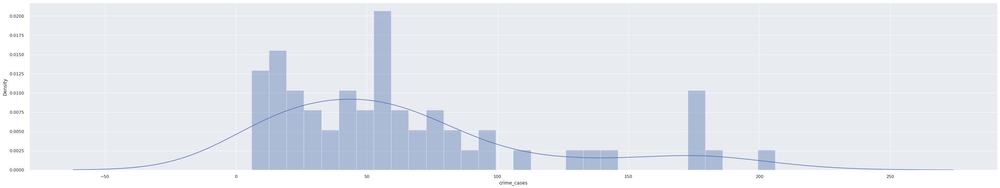

In [ ]:
sns.set(rc={'figure.figsize':(40,8)})
sns.distplot(new_final_combined_df['crime_cases'], bins=30)
plt.show()

In [ ]:
new_final_combined_df.columns

Index(['Region', 'Number of Confirmed Cases', 'Number of Deaths',
       'Number of Tests', 'Population', 'crime_cases', 'arrest', 'domestic'],
      dtype='object')

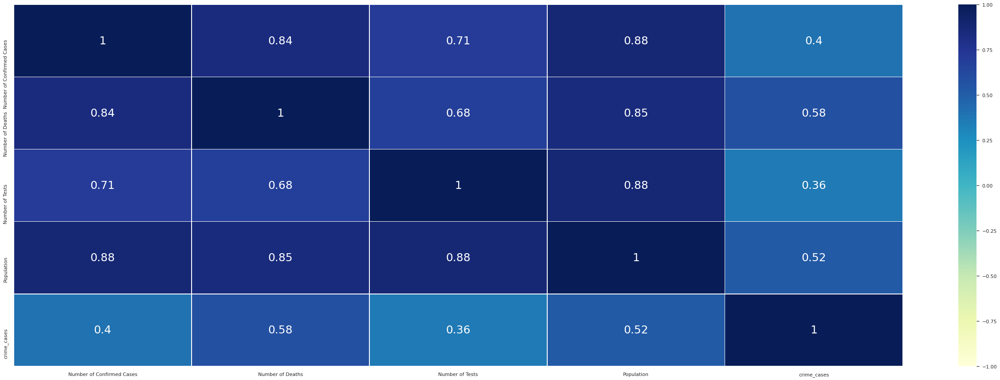

In [ ]:
sns.set(rc={'figure.figsize':(40,15)})
correlation_matrix = new_final_combined_df[['Number of Confirmed Cases', 'Number of Deaths','Number of Tests', 'Population', 'crime_cases']].corr().round(2)

sns.heatmap(correlation_matrix , xticklabels=correlation_matrix.columns.values,yticklabels=correlation_matrix.columns.values,annot=True,linewidths=.5,cmap="YlGnBu",annot_kws={"size":25},vmin=-1,vmax=1);


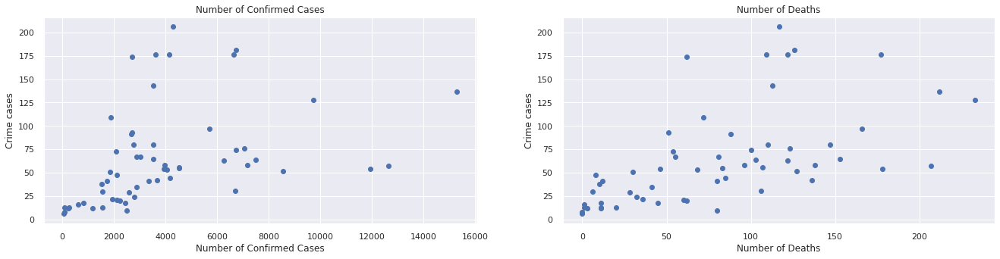

In [ ]:
plt.figure(figsize=(20, 5))

features = ['Number of Confirmed Cases', 'Number of Deaths']
target = new_final_combined_df['crime_cases']

for i, col in enumerate(features):
    plt.subplot(1, len(features) , i+1)
    x = new_final_combined_df[col]
    y = target
    plt.scatter(x, y, marker='o')
    plt.title(col)
    plt.xlabel(col)
    plt.ylabel('Crime cases')

<center>
<h3>
<hr/>
<b>
Linear Model
</b>
<hr/>
</h3>
</center>

In [ ]:

X = pd.DataFrame(np.c_[new_final_combined_df['Number of Confirmed Cases'],new_final_combined_df['Number of Deaths'],new_final_combined_df['Number of Tests'],new_final_combined_df['Population']], columns = ['Number of Confirmed Cases', 'Number of Deaths','Number of Tests', 'Population'])
Y = new_final_combined_df['crime_cases']


In [ ]:

from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state=5)
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)


(46, 4)
(12, 4)
(46,)
(12,)


In [ ]:

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

lin_model = LinearRegression()
lin_model.fit(X_train, Y_train)


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:



# model evaluation for testing set
y_test_predict = lin_model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(Y_test, y_test_predict)))


print("The model performance for testing set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('MAE for Poly Regression :', mean_absolute_error(Y_test,y_test_predict))
print('MSE for Poly Regression :',mean_squared_error(Y_test,y_test_predict))
print("\n")



The model performance for testing set
--------------------------------------
RMSE is 51.9420626753632
MAE for Poly Regression : 37.50467306050371
MSE for Poly Regression : 2697.9778749713596




In [ ]:
linear_forcating_crime=lin_model.predict(forcating_crime)
# linear_forcating_crime

<hr>
<center>
<h4>
<b>
Building A Polynomial Model
</b>
</h4>
<hr>
</center>

In [ ]:

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state=5)
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)


(46, 4)
(12, 4)
(46,)
(12,)


In [ ]:

from sklearn.preprocessing import PolynomialFeatures
from sklearn import linear_model

# transform data for polynomial regression
poly = PolynomialFeatures(degree=3)
poly_X_train = poly.fit_transform(X_train)
poly_X_test = poly.fit_transform(X_test)
poly_forcasting_crime = poly.fit_transform(forcating_crime)

# poly_future_forecast = poly.fit_transform(future_forecast)

poly_model = linear_model.LinearRegression()
poly_model.fit(poly_X_train, y_train)
poly_pred=poly_model.predict(poly_X_test)


print('\n')

print('MAE for Poly Regression :', mean_absolute_error(y_test,poly_pred))
print('MSE for Poly Regression :',mean_squared_error(y_test,poly_pred))
print('RMSE for Poly Regression : ',np.sqrt(mean_squared_error(y_test,poly_pred)))

print('\n')




MAE for Poly Regression : 85.02449113701432
MSE for Poly Regression : 13482.29950736244
RMSE for Poly Regression :  116.11330460960295




In [ ]:

poly_pred


array([-11.8797758 ,  53.44921185,   7.69472245,  28.40324852,
        10.05735334,  97.90345805, 316.69647001,  59.46975125,
        76.45777619,  26.22172463, -65.31996151,   5.55848054])

In [ ]:
poly_forcating_crime=poly_model.predict(poly_forcasting_crime)
poly_forcating_crime

array([   6.13046635,    6.17164396,    6.38506438,    6.91441261,
          7.90337366,    9.49563254,   11.83487426,   15.06478382,
         19.32904624,   24.77134652,   31.53536968,   39.76480071,
         49.60332463,   61.19462645,   74.68239117,   90.21030381,
        107.92204937,  127.96131286,  150.47177929,  175.59713366,
        203.48106099,  234.26724629,  268.09937455,  305.1211308 ,
        345.47620004,  389.30826727,  436.76101751,  487.97813576,
        543.10330704,  602.28021634,  665.65254869,  733.36398909,
        805.55822254,  882.37893405,  963.96980864, 1050.47453131,
       1142.03678707, 1238.80026093, 1340.90863789, 1448.50560297,
       1561.73484117, 1680.74003751, 1805.66487698, 1936.6530446 ,
       2073.84822538, 2217.39410433, 2367.43436645, 2524.11269675,
       2687.57278024, 2857.95830193, 3035.41294683, 3220.08039994,
       3412.10434628, 3611.62847085, 3818.79645866, 4033.75199472,
       4256.63876404, 4487.60045163])

<hr>
<center>
<h4>
<b>
Building A SVM Model
</b>
</h4>
<hr>
</center>

In [ ]:

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state=5)

print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

# svm_confirmed = svm_search.best_estimator_
svm_model = SVR(shrinking=True, kernel='sigmoid',gamma=0.01, epsilon=1,degree=5, C=0.1)
svm_model.fit(X_train, Y_train)
svm_pred = svm_model.predict(X_test);


(46, 4)
(12, 4)
(46,)
(12,)


In [ ]:

print('\n')

print('MAE for SVM :', mean_absolute_error(y_test,svm_pred))
print('MSE for SVM :',mean_squared_error(y_test,svm_pred))
print('RMSE for SVM : ',np.sqrt(mean_squared_error(y_test,svm_pred)))

print('\n')




MAE for SVM : 46.75
MSE for SVM : 3859.25
RMSE for SVM :  62.12286213625383




In [ ]:
svm_forcating_crime=svm_model.predict(forcating_crime)
svm_forcating_crime

array([53., 53., 53., 53., 53., 53., 53., 53., 53., 53., 53., 53., 53.,
       53., 53., 53., 53., 53., 53., 53., 53., 53., 53., 53., 53., 53.,
       53., 53., 53., 53., 53., 53., 53., 53., 53., 53., 53., 53., 53.,
       53., 53., 53., 53., 53., 53., 53., 53., 53., 53., 53., 53., 53.,
       53., 53., 53., 53., 53., 53.])

In [ ]:
final_regionwise_forcast = pd.DataFrame({'Region': unique_region, 'LR_crime_cases_Prediction':linear_forcating_crime.astype(int),'Poly_crime_cases_Prediction': poly_forcating_crime.astype(int),'SVM_crime_cases_Prediction': svm_forcating_crime.astype(int)})
final_regionwise_forcast.style.background_gradient(cmap='Blues')

,Region,LR_crime_cases_Prediction,Poly_crime_cases_Prediction,SVM_crime_cases_Prediction
0,60629,5,6,53
1,60639,7,6,53
2,60632,8,6,53
3,60623,9,6,53
4,60634,11,7,53
5,60641,12,9,53
6,60647,13,11,53
7,60608,15,15,53
8,60618,16,19,53
9,60617,17,24,53


INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should

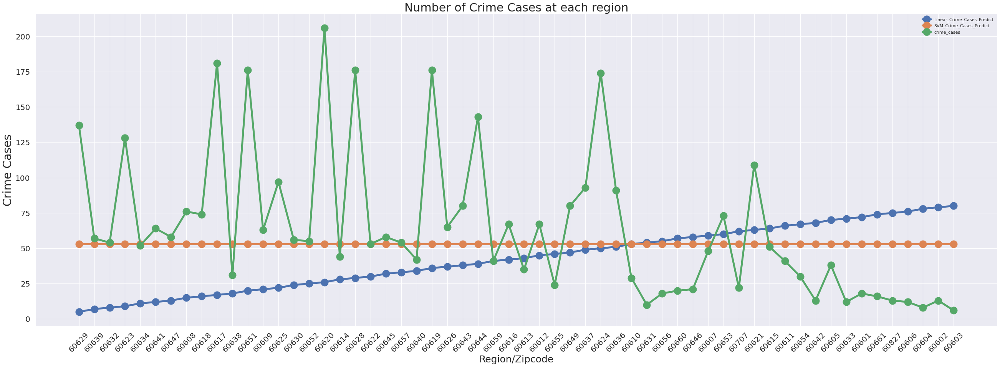

In [ ]:
plt.figure(figsize=(40,15))

plt.xticks(range(0,58,1),final_regionwise_forcast['Region'],rotation=45)
plt.xlabel('Region/Zipcode',fontsize=25) 


plt.plot(final_regionwise_forcast['Region'], final_regionwise_forcast['LR_crime_cases_Prediction'],marker = 'o',ms = 20, mec = 'r',linewidth = '5')
# plt.plot(final_regionwise_forcast['Region'], final_regionwise_forcast['Poly_crime_cases_Prediction'],marker = 'o',ms = 20, mec = 'g',linewidth = '5')
plt.plot(final_regionwise_forcast['Region'], final_regionwise_forcast['SVM_crime_cases_Prediction'],marker = 'o',ms = 20, mec = 'b',linewidth = '5')
plt.plot(final_regionwise_forcast['Region'], final_combined_df['crime_cases'],marker = 'o',ms = 20, mec = 'b',linewidth = '5')

plt.title('Number of Crime Cases at each region',size=30)
plt.ylabel('Crime Cases', size=30)

plt.xticks(size=20)
plt.yticks(size=20)
plt.legend(['Linear_Crime_Cases_Predict','SVM_Crime_Cases_Predict','crime_cases'])
plt.show()

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


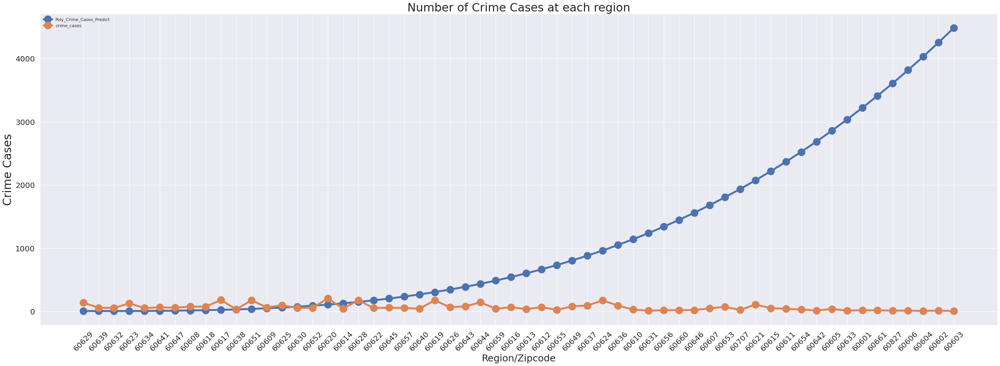

In [ ]:
plt.figure(figsize=(40,15))

plt.xticks(range(0,58,1),final_regionwise_forcast['Region'],rotation=45)
plt.xlabel('Region/Zipcode',fontsize=25) 


plt.plot(final_regionwise_forcast['Region'], final_regionwise_forcast['Poly_crime_cases_Prediction'],marker = 'o',ms = 20, mec = 'g',linewidth = '5')
plt.plot(final_regionwise_forcast['Region'], final_combined_df['crime_cases'],marker = 'o',ms = 20, mec = 'b',linewidth = '5')

plt.title('Number of Crime Cases at each region',size=30)
plt.ylabel('Crime Cases', size=30)

plt.xticks(size=20)
plt.yticks(size=20)
plt.legend(['Poly_Crime_Cases_Predict','crime_cases'])
plt.show()


In [ ]:
crime_cases_prediction_by_region_poly=final_regionwise_forcast.groupby('Region')['Poly_crime_cases_Prediction'].sum()
crime_cases_prediction_by_region_poly

Region
60601    3220
60602    4256
60603    4487
60604    4033
60605    2857
60606    3818
60607    1680
60608      15
60609      49
60610    1142
60611    2367
60612     665
60613     602
60614     127
60615    2217
60616     543
60617      24
60618      19
60619     305
60620     107
60621    2073
60622     175
60623       6
60624     963
60625      61
60626     345
60628     150
60629       6
60630      74
60631    1238
60632       6
60633    3035
60634       7
60636    1050
60637     882
60638      31
60639       6
60640     268
60641       9
60642    2687
60643     389
60644     436
60645     203
60646    1561
60647      11
60649     805
60651      39
60652      90
60653    1805
60654    2524
60655     733
60656    1340
60657     234
60659     487
60660    1448
60661    3412
60707    1936
60827    3611
Name: Poly_crime_cases_Prediction, dtype: int64

In [ ]:

crime_cases_prediction_by_region_poly.name = 'poly_crime_cases_predict'

# run only once if run again then there are overwriting the values.
chi_zips = chi_zips.join(crime_cases_prediction_by_region_poly, on='zip')
chi_zips


,objectid,shape_area,shape_len,zip,geometry,total_cases,predict_cases_svm,poly_crime_cases_predict
0,33.0,1.060523e+08,42720.044406,60647,"POLYGON ((-87.67762 41.91776, -87.67761 41.917...",7172.0,7354.0,11.0
1,34.0,1.274761e+08,48103.782721,60639,"POLYGON ((-87.72683 41.92265, -87.72693 41.922...",12653.0,13335.0,6.0
2,35.0,4.506904e+07,27288.609612,60707,"POLYGON ((-87.78500 41.90915, -87.78531 41.909...",1944.0,1218.0,1936.0
3,36.0,7.085383e+07,42527.989679,60622,"POLYGON ((-87.66707 41.88885, -87.66707 41.888...",4068.0,3532.0,175.0
4,37.0,9.903962e+07,47970.140153,60651,"POLYGON ((-87.70656 41.89555, -87.70672 41.895...",6653.0,7373.0,39.0
...,...,...,...,...,...,...,...,...
56,57.0,1.552855e+08,53406.915617,60623,"POLYGON ((-87.69479 41.83008, -87.69486 41.830...",9746.0,5313.0,6.0
57,58.0,2.111148e+08,58701.325375,60629,"POLYGON ((-87.68306 41.75786, -87.68306 41.757...",15287.0,9974.0,6.0
58,59.0,2.116961e+08,58466.160298,60620,"POLYGON ((-87.62373 41.72167, -87.62388 41.721...",4297.0,3601.0,107.0
59,60.0,1.254243e+08,52377.854541,60637,"POLYGON ((-87.57691 41.79511, -87.57700 41.795...",2710.0,3145.0,882.0


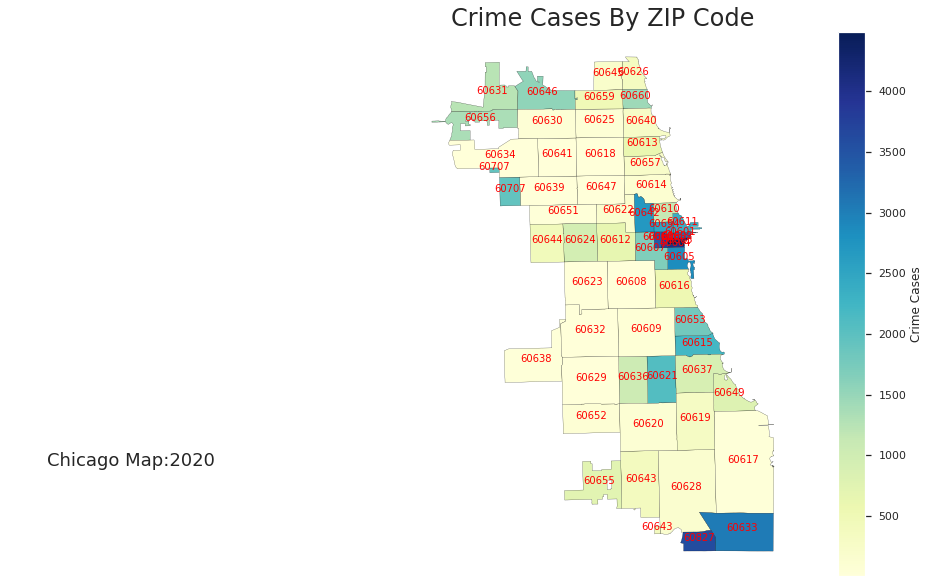

In [ ]:

fig, ax = plt.subplots(figsize=(15,10))
ax.axis('off')
ax.set_title('Crime Cases By ZIP Code',
            fontdict={'fontsize': 24, 'fontweight':10})# plot the map
chi_zips.plot(ax=ax, column='poly_crime_cases_predict',
            edgecolor='black', linewidth=.2,
            cmap='YlGnBu', legend=True,
            legend_kwds={'label': 'Crime Cases'});# source the data
ax.annotate('Chicago Map:2020' ,
            xy=(0.05, .2),  xycoords='figure fraction', 
            fontsize=18);

for _, row in chi_zips.iterrows():
    xy = row['geometry'].centroid.coords
    ax.annotate(row['zip'], xy=xy[0],
                 horizontalalignment='center',
                 color='red',fontsize=10)
    

<hr>
<center>
<h4>
<b>
**** Thank You ****
</b>
</h4>
<hr>
</center>